<img src="https://margaritaimpresora.files.wordpress.com/2013/11/di-logo-sanjoaquin.jpg" title="USM" width="70%" height="70%" style="float: left;"/>

<br><br><br><br><br><br><br><br><br><br>
_____

<center>
   <h2>Tarea 1: Implementar un Neural IR.</h2>
   <h2>Recuperación de información </h2>
   <h4>Profesor: Marcelo Mendoza</h4>
   <h4>Estudiante: Fernanda Weiss</h4>
</center>

### Datos:
* topics.51-100: Campo "title" serán las consultas.
* wsj2.xml: Colección de evaluación, contiene los documentos, el corpus, sobre los que se harán las queries.
* script.py: Parsea el corpus, wsj2.xml
* qrels.51-100: Ground truth de los docs relevantes (1) y los no (0)

    Luego de ejecuta *script.py* se tiene una carpeta *corpus* que tiene 10.163 documentos.

## Pasos a seguir:
0. Leer documentos
1. Pre-procesar el texto
2. Crear vocabulario y reconstruir documentos
3. Crear índice invertido
4. W2V skip-grams
5. Vectorizar documentos
6. Recuperar documentos usando el índice invertido
7. Implementar AWE y recuperar documentos con AWE para obtener Top-m de los recuperados antes (ej top-50)
8. Rankear con BM25 para obtener top-n (ej top-10)
9. Obtener métricas: precision and recall

In [188]:
import numpy as np

import matplotlib.pyplot as plt

import os

import operator  

from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk import FreqDist

from keras.preprocessing.text import text_to_word_sequence

from sklearn.metrics.pairwise import cosine_similarity

import gensim

### 1) Leer documentos

In [2]:
docs_dir = os.listdir("corpus/")
docs = {}
for file in docs_dir:
    docs[file.title()] = "".join(open("corpus/"+file).readlines())

In [3]:
texts = list(docs.values())
print("Hay {} documentos en el corpus".format(len(texts)))

Hay 10163 documentos en el corpus


In [150]:
texts[10]

"Business Brief -- Octel Communications Corp.:\n   Software Firm's Earnings\n   Climbed 25% in 2nd Quarter\nThe Milpitas, Calif., communications software concern\ncited solid performance in most of its major product lines\nand expanding international sales. A year ago, Octel earned\n$4 million, or 23 cents a share.\n   In late over-the-counter trading yesterday, Octel was\ntrading at $26.25, up 75 cents."

In [151]:
docs[list(docs.keys())[10]]

"Business Brief -- Octel Communications Corp.:\n   Software Firm's Earnings\n   Climbed 25% in 2nd Quarter\nThe Milpitas, Calif., communications software concern\ncited solid performance in most of its major product lines\nand expanding international sales. A year ago, Octel earned\n$4 million, or 23 cents a share.\n   In late over-the-counter trading yesterday, Octel was\ntrading at $26.25, up 75 cents."

In [68]:
list(docs.keys())[438]

'Wsj920114-0079'

### 2) Pre-procesar el texto

* **Tokenize:**
    * NLTK
    * Keras
    * Spacy

* **Remove stopwords:**
    * NLTK

* **Lower case**

* **Remove long words less 2**

* **Lemmatization - stemming**

In [4]:
def gen_dist(texts):
    word_dist = FreqDist()
    for s in texts:
        word_dist.update(s)
    return word_dist

def plt_zipf(dist):
    plt.figure(figsize=(12,6))
    dist.plot(50)

In [5]:
corpus_nltk = texts.copy()
for i in range(len(corpus_nltk)):
    corpus_nltk[i] = [token.lower() for token in word_tokenize(corpus_nltk[i]) if token.isalpha() ] 

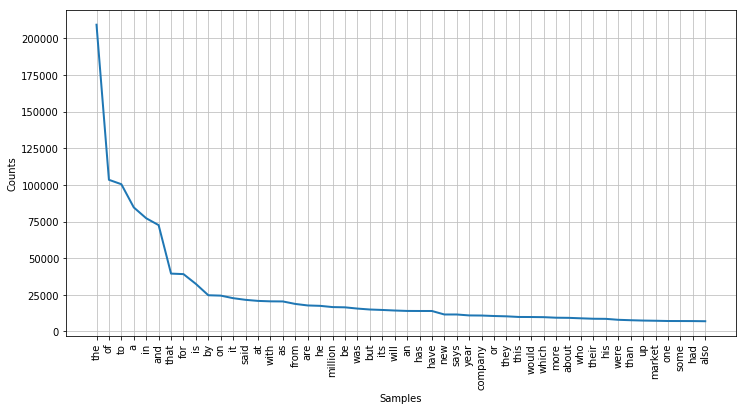

In [6]:
dist_nltk = gen_dist(corpus_nltk)
plt_zipf(dist_nltk)

In [7]:
other_stopwords = ['...','.','!',' ',';',',','``',"''",'--']
stoplist = np.concatenate((stopwords.words('english'),other_stopwords),axis=0)

stemmer = SnowballStemmer("english")

In [8]:
for i in range(len(corpus_nltk)):
    corpus_nltk[i] = [token for token in corpus_nltk[i] if token not in stoplist]
   # corpus_nltk[i] = [token for token in corpus_nltk[i] if token.isalpha()] #re.sub(r'[a-zA-Z]+')
    corpus_nltk[i] = [token for token in corpus_nltk[i] if len(token)>2]
   # corpus_nltk[i] = [stemmer.stem(token) for token in corpus_nltk[i]]

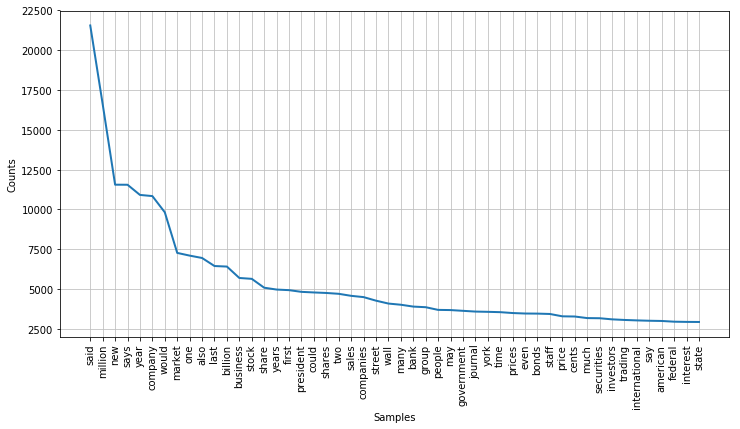

In [9]:
dist_nltk = gen_dist(corpus_nltk)
plt_zipf(dist_nltk)

In [237]:
docs_token = {}
for i in range(len(corpus_nltk)):
    docs_token[list(docs.keys())[i]] = corpus_nltk[i]

In [238]:
docs_token

{'Wsj920129-0130': ['politics',
  'policy',
  'plan',
  'revive',
  'economy',
  'medley',
  'tax',
  'cuts',
  'reversing',
  'reforms',
  'david',
  'wessel',
  'staff',
  'reporter',
  'wall',
  'street',
  'journal',
  'highlights',
  'president',
  'bush',
  'tax',
  'proposals',
  'starting',
  'march',
  'sooner',
  'plan',
  'would',
  'cut',
  'amount',
  'taxes',
  'withheld',
  'employers',
  'paycheck',
  'workers',
  'money',
  'withheld',
  'year',
  'necessary',
  'pay',
  'tax',
  'bills',
  'thus',
  'get',
  'large',
  'refunds',
  'change',
  'would',
  'curtail',
  'overwithholding',
  'providing',
  'average',
  'married',
  'wage',
  'earner',
  'boost',
  'available',
  'cash',
  'year',
  'reducing',
  'refund',
  'next',
  'year',
  'wager',
  'earners',
  'would',
  'see',
  'change',
  'withholding',
  'however',
  'increase',
  'personal',
  'exemption',
  'person',
  'child',
  'age',
  'effective',
  'increase',
  'would',
  'phased',
  'beginning',
  'fam

### 3) Crear vocabulario y recostruir documentos

In [10]:
voc = set()
for doc in corpus_nltk:
    for word in doc:
        voc.add(word)

word2id = {w: i for i, w in enumerate(voc)}
id2word = {i: w for i, w in enumerate(voc)}

corpus_ids = [[word2id[word] for word in doc] for doc in corpus_nltk]

In [11]:
print(len(corpus_nltk[0]))
print(len(corpus_ids[0]))

107
107


In [12]:
print("El vocabulario es de largo: ", len(voc))

El vocabulario es de largo:  58968


In [295]:
corpus_ids[0]

[56759,
 26185,
 12739,
 24971,
 11819,
 57855,
 14183,
 13204,
 4736,
 47695,
 14183,
 28075,
 51564,
 8175,
 29243,
 26820,
 16061,
 49500,
 14183,
 38635,
 1281,
 31606,
 26185,
 12739,
 31587,
 49500,
 20910,
 38635,
 18783,
 14183,
 28075,
 51564,
 17612,
 599,
 10612,
 1478,
 12739,
 47860,
 1281,
 33885,
 10612,
 47860,
 32361,
 14676,
 34519,
 35040,
 27709,
 4758,
 8175,
 13013,
 42492,
 20506,
 2069,
 45584,
 50861,
 5483,
 48339,
 43557,
 46981,
 30295,
 37757,
 49588,
 12739,
 38611,
 23889,
 45584,
 8188,
 46198,
 28075,
 31587,
 8188,
 8344,
 48838,
 49500,
 14183,
 38635,
 26185,
 12739,
 11819,
 16538,
 32037,
 31968,
 29211,
 19467,
 17275,
 37679,
 8175,
 26185,
 27350,
 27350,
 4432,
 27553,
 10812,
 26185,
 12739,
 4577,
 32696,
 13767,
 30371,
 22037,
 10738,
 14191,
 45138,
 12739,
 8178,
 17275,
 37679]

In [33]:
corpus_nltk[0]

['news',
 'international',
 'paper',
 'names',
 'new',
 'member',
 'executive',
 'suite',
 'one',
 'four',
 'executive',
 'vice',
 'presidents',
 'suwyn',
 'report',
 'directly',
 'chairman',
 'chief',
 'executive',
 'officer',
 'john',
 'georges',
 'international',
 'paper',
 'president',
 'chief',
 'operating',
 'officer',
 'three',
 'executive',
 'vice',
 'presidents',
 'dana',
 'mead',
 'directs',
 'pulp',
 'paper',
 'operations',
 'john',
 'dillon',
 'directs',
 'operations',
 'james',
 'melican',
 'supervises',
 'legal',
 'external',
 'affairs',
 'suwyn',
 'fills',
 'position',
 'left',
 'vacant',
 'david',
 'wang',
 'decided',
 'retire',
 'last',
 'year',
 'much',
 'responsibilities',
 'particularly',
 'paper',
 'distribution',
 'assumed',
 'david',
 'oskin',
 'senior',
 'vice',
 'president',
 'oskin',
 'recently',
 'named',
 'chief',
 'executive',
 'officer',
 'international',
 'paper',
 'new',
 'zealand',
 'affiliate',
 'carter',
 'holt',
 'harvey',
 'spokesman',
 'said',
 'su

Sin hacer stem el tamaño del vocabulario aumenta en 18000 app

In [13]:
[print(k,": ", word2id[k]) for k in list(word2id)[:10]]

cabarets :  0
domsjoe :  1
sentinels :  19570
fogel :  2
chattering :  3
caromed :  4
combats :  51026
subsidized :  5
klopp :  6
gird :  7


[None, None, None, None, None, None, None, None, None, None]

In [14]:
[print(k,": ", id2word[k]) for k in list(id2word)[:10]]

0 :  cabarets
1 :  domsjoe
2 :  fogel
3 :  chattering
4 :  caromed
5 :  subsidized
6 :  klopp
7 :  gird
8 :  impenetrable
9 :  csx


[None, None, None, None, None, None, None, None, None, None]

In [55]:
corpus_nltk[438]

['news']

In [62]:
for i in corpus_nltk:
    if len(i) < 2:
        print('dead')

dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead
dead


### 4) Crear índice invertido

In [277]:
from collections import defaultdict, Counter

inv_indx = defaultdict(list)
for i, (idx, text) in enumerate(docs_token.items()):
    c = Counter(text)
    for word in text:
#         print(word)
        if word in voc:
#             print('holi')
            if word in inv_indx:
                inv_indx[word].update({idx: c[word]})
            else:
                inv_indx[word] = dict([(idx, c[word])])
    

In [276]:
'the' in inv_indx

False

In [279]:
inv_indx['ham']['Wsj920122-0179']

1

In [232]:
from collections import Counter

c = Counter(['eggs', 'ham', 'say', 'hello', 'eggs', 'hello'])

In [239]:
print(c['hello'])

2


In [ ]:
#corpus_nltk

In [280]:
inv_indx

[]

In [282]:
inv_indx['news']['Wsj920319-0167']

1

### 5) Skip-grams

Generar Skip-grams

In [45]:
print(corpus_ids[3])

[10769, 39253, 14503]


In [42]:
from keras.preprocessing.sequence import skipgrams

# generate skip-grams
skip_grams = [skipgrams(corpus_id, len(voc), window_size=2) for corpus_id in corpus_ids]

In [46]:
print(skip_grams[3])

([[10769, 14503], [10769, 52195], [14503, 42073], [14503, 53516], [39253, 14503], [39253, 21840], [14503, 39253], [14503, 10769], [39253, 10769], [39253, 52674], [10769, 36113], [10769, 39253]], [1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1])


In [51]:
# view sample skip-grams
pairs, labels = skip_grams[3][0], skip_grams[3][1]
for i in range(10):
    print("({:s} ({:d}), {:s} ({:d})) -> {:d}".format(
          id2word[pairs[i][0]], pairs[i][0], 
          id2word[pairs[i][1]], pairs[i][1], 
          labels[i]))

(zurn (10769), contracts (14503)) -> 1
(zurn (10769), haggled (52195)) -> 0
(contracts (14503), expensive (42073)) -> 0
(contracts (14503), infatuation (53516)) -> 0
(industries (39253), contracts (14503)) -> 1
(industries (39253), campaigne (21840)) -> 0
(contracts (14503), industries (39253)) -> 1
(contracts (14503), zurn (10769)) -> 1
(industries (39253), zurn (10769)) -> 1
(industries (39253), tapping (52674)) -> 0


Documento sin skip-grams => doc de largo 1

In [77]:
len([i for i in skip_grams if not i[0]])

19

In [78]:
skip_grams = [i for i in skip_grams if i[0]]

In [80]:
vocab_size = len(word2id) + 1 
embed_size = 100

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:16: UserWarning: The `Merge` layer is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  app.launch_new_instance()


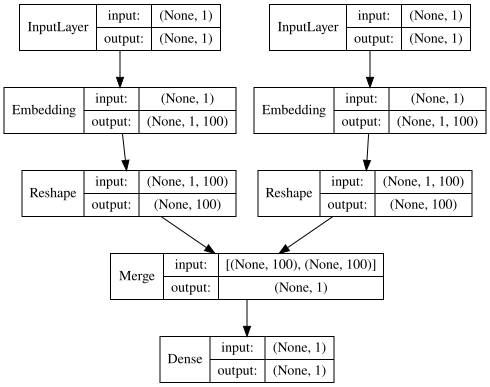

In [81]:
from keras.layers import Merge
from keras.layers.core import Dense, Reshape
from keras.layers.embeddings import Embedding
from keras.models import Sequential

# build skip-gram architecture
word_model = Sequential()
word_model.add(Embedding(vocab_size, embed_size, embeddings_initializer="glorot_uniform",input_length=1))
word_model.add(Reshape((embed_size, )))

context_model = Sequential()
context_model.add(Embedding(vocab_size, embed_size, embeddings_initializer="glorot_uniform", input_length=1))
context_model.add(Reshape((embed_size,)))

model = Sequential()
model.add(Merge([word_model, context_model], mode="dot"))
model.add(Dense(1, kernel_initializer="glorot_uniform", activation="sigmoid"))
model.compile(loss="mean_squared_error", optimizer="rmsprop", metrics=['accuracy'])

# view model summary
# print(model.summary())

# visualize model structure
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

SVG(model_to_dot(model, show_shapes=True, show_layer_names=False, 
                 rankdir='TB').create(prog='dot', format='svg'))

In [82]:
for epoch in range(1, 4):
    loss = []
    for i, elem in enumerate(skip_grams):
        pair_first_elem = np.array(list(zip(*elem[0]))[0], dtype='int32')
        pair_second_elem = np.array(list(zip(*elem[0]))[1], dtype='int32')
        labels = np.array(elem[1], dtype='int32')
        X = [pair_first_elem, pair_second_elem]
        Y = labels
        print('Processed {} (skip_first, skip_second, relevance) pairs'.format(i))
        loss.append(model.train_on_batch(X,Y))

    print('Epoch:', epoch, 'Loss:', loss)

Processed 0 (skip_first, skip_second, relevance) pairs
Processed 1 (skip_first, skip_second, relevance) pairs
Processed 2 (skip_first, skip_second, relevance) pairs
Processed 3 (skip_first, skip_second, relevance) pairs
Processed 4 (skip_first, skip_second, relevance) pairs
Processed 5 (skip_first, skip_second, relevance) pairs
Processed 6 (skip_first, skip_second, relevance) pairs
Processed 7 (skip_first, skip_second, relevance) pairs
Processed 8 (skip_first, skip_second, relevance) pairs
Processed 9 (skip_first, skip_second, relevance) pairs
Processed 10 (skip_first, skip_second, relevance) pairs
Processed 11 (skip_first, skip_second, relevance) pairs
Processed 12 (skip_first, skip_second, relevance) pairs
Processed 13 (skip_first, skip_second, relevance) pairs
Processed 14 (skip_first, skip_second, relevance) pairs
Processed 15 (skip_first, skip_second, relevance) pairs
Processed 16 (skip_first, skip_second, relevance) pairs
Processed 17 (skip_first, skip_second, relevance) pairs
Pr

Processed 147 (skip_first, skip_second, relevance) pairs
Processed 148 (skip_first, skip_second, relevance) pairs
Processed 149 (skip_first, skip_second, relevance) pairs
Processed 150 (skip_first, skip_second, relevance) pairs
Processed 151 (skip_first, skip_second, relevance) pairs
Processed 152 (skip_first, skip_second, relevance) pairs
Processed 153 (skip_first, skip_second, relevance) pairs
Processed 154 (skip_first, skip_second, relevance) pairs
Processed 155 (skip_first, skip_second, relevance) pairs
Processed 156 (skip_first, skip_second, relevance) pairs
Processed 157 (skip_first, skip_second, relevance) pairs
Processed 158 (skip_first, skip_second, relevance) pairs
Processed 159 (skip_first, skip_second, relevance) pairs
Processed 160 (skip_first, skip_second, relevance) pairs
Processed 161 (skip_first, skip_second, relevance) pairs
Processed 162 (skip_first, skip_second, relevance) pairs
Processed 163 (skip_first, skip_second, relevance) pairs
Processed 164 (skip_first, skip

Processed 292 (skip_first, skip_second, relevance) pairs
Processed 293 (skip_first, skip_second, relevance) pairs
Processed 294 (skip_first, skip_second, relevance) pairs
Processed 295 (skip_first, skip_second, relevance) pairs
Processed 296 (skip_first, skip_second, relevance) pairs
Processed 297 (skip_first, skip_second, relevance) pairs
Processed 298 (skip_first, skip_second, relevance) pairs
Processed 299 (skip_first, skip_second, relevance) pairs
Processed 300 (skip_first, skip_second, relevance) pairs
Processed 301 (skip_first, skip_second, relevance) pairs
Processed 302 (skip_first, skip_second, relevance) pairs
Processed 303 (skip_first, skip_second, relevance) pairs
Processed 304 (skip_first, skip_second, relevance) pairs
Processed 305 (skip_first, skip_second, relevance) pairs
Processed 306 (skip_first, skip_second, relevance) pairs
Processed 307 (skip_first, skip_second, relevance) pairs
Processed 308 (skip_first, skip_second, relevance) pairs
Processed 309 (skip_first, skip

Processed 436 (skip_first, skip_second, relevance) pairs
Processed 437 (skip_first, skip_second, relevance) pairs
Processed 438 (skip_first, skip_second, relevance) pairs
Processed 439 (skip_first, skip_second, relevance) pairs
Processed 440 (skip_first, skip_second, relevance) pairs
Processed 441 (skip_first, skip_second, relevance) pairs
Processed 442 (skip_first, skip_second, relevance) pairs
Processed 443 (skip_first, skip_second, relevance) pairs
Processed 444 (skip_first, skip_second, relevance) pairs
Processed 445 (skip_first, skip_second, relevance) pairs
Processed 446 (skip_first, skip_second, relevance) pairs
Processed 447 (skip_first, skip_second, relevance) pairs
Processed 448 (skip_first, skip_second, relevance) pairs
Processed 449 (skip_first, skip_second, relevance) pairs
Processed 450 (skip_first, skip_second, relevance) pairs
Processed 451 (skip_first, skip_second, relevance) pairs
Processed 452 (skip_first, skip_second, relevance) pairs
Processed 453 (skip_first, skip

Processed 580 (skip_first, skip_second, relevance) pairs
Processed 581 (skip_first, skip_second, relevance) pairs
Processed 582 (skip_first, skip_second, relevance) pairs
Processed 583 (skip_first, skip_second, relevance) pairs
Processed 584 (skip_first, skip_second, relevance) pairs
Processed 585 (skip_first, skip_second, relevance) pairs
Processed 586 (skip_first, skip_second, relevance) pairs
Processed 587 (skip_first, skip_second, relevance) pairs
Processed 588 (skip_first, skip_second, relevance) pairs
Processed 589 (skip_first, skip_second, relevance) pairs
Processed 590 (skip_first, skip_second, relevance) pairs
Processed 591 (skip_first, skip_second, relevance) pairs
Processed 592 (skip_first, skip_second, relevance) pairs
Processed 593 (skip_first, skip_second, relevance) pairs
Processed 594 (skip_first, skip_second, relevance) pairs
Processed 595 (skip_first, skip_second, relevance) pairs
Processed 596 (skip_first, skip_second, relevance) pairs
Processed 597 (skip_first, skip

Processed 725 (skip_first, skip_second, relevance) pairs
Processed 726 (skip_first, skip_second, relevance) pairs
Processed 727 (skip_first, skip_second, relevance) pairs
Processed 728 (skip_first, skip_second, relevance) pairs
Processed 729 (skip_first, skip_second, relevance) pairs
Processed 730 (skip_first, skip_second, relevance) pairs
Processed 731 (skip_first, skip_second, relevance) pairs
Processed 732 (skip_first, skip_second, relevance) pairs
Processed 733 (skip_first, skip_second, relevance) pairs
Processed 734 (skip_first, skip_second, relevance) pairs
Processed 735 (skip_first, skip_second, relevance) pairs
Processed 736 (skip_first, skip_second, relevance) pairs
Processed 737 (skip_first, skip_second, relevance) pairs
Processed 738 (skip_first, skip_second, relevance) pairs
Processed 739 (skip_first, skip_second, relevance) pairs
Processed 740 (skip_first, skip_second, relevance) pairs
Processed 741 (skip_first, skip_second, relevance) pairs
Processed 742 (skip_first, skip

Processed 869 (skip_first, skip_second, relevance) pairs
Processed 870 (skip_first, skip_second, relevance) pairs
Processed 871 (skip_first, skip_second, relevance) pairs
Processed 872 (skip_first, skip_second, relevance) pairs
Processed 873 (skip_first, skip_second, relevance) pairs
Processed 874 (skip_first, skip_second, relevance) pairs
Processed 875 (skip_first, skip_second, relevance) pairs
Processed 876 (skip_first, skip_second, relevance) pairs
Processed 877 (skip_first, skip_second, relevance) pairs
Processed 878 (skip_first, skip_second, relevance) pairs
Processed 879 (skip_first, skip_second, relevance) pairs
Processed 880 (skip_first, skip_second, relevance) pairs
Processed 881 (skip_first, skip_second, relevance) pairs
Processed 882 (skip_first, skip_second, relevance) pairs
Processed 883 (skip_first, skip_second, relevance) pairs
Processed 884 (skip_first, skip_second, relevance) pairs
Processed 885 (skip_first, skip_second, relevance) pairs
Processed 886 (skip_first, skip

Processed 1013 (skip_first, skip_second, relevance) pairs
Processed 1014 (skip_first, skip_second, relevance) pairs
Processed 1015 (skip_first, skip_second, relevance) pairs
Processed 1016 (skip_first, skip_second, relevance) pairs
Processed 1017 (skip_first, skip_second, relevance) pairs
Processed 1018 (skip_first, skip_second, relevance) pairs
Processed 1019 (skip_first, skip_second, relevance) pairs
Processed 1020 (skip_first, skip_second, relevance) pairs
Processed 1021 (skip_first, skip_second, relevance) pairs
Processed 1022 (skip_first, skip_second, relevance) pairs
Processed 1023 (skip_first, skip_second, relevance) pairs
Processed 1024 (skip_first, skip_second, relevance) pairs
Processed 1025 (skip_first, skip_second, relevance) pairs
Processed 1026 (skip_first, skip_second, relevance) pairs
Processed 1027 (skip_first, skip_second, relevance) pairs
Processed 1028 (skip_first, skip_second, relevance) pairs
Processed 1029 (skip_first, skip_second, relevance) pairs
Processed 1030

Processed 1155 (skip_first, skip_second, relevance) pairs
Processed 1156 (skip_first, skip_second, relevance) pairs
Processed 1157 (skip_first, skip_second, relevance) pairs
Processed 1158 (skip_first, skip_second, relevance) pairs
Processed 1159 (skip_first, skip_second, relevance) pairs
Processed 1160 (skip_first, skip_second, relevance) pairs
Processed 1161 (skip_first, skip_second, relevance) pairs
Processed 1162 (skip_first, skip_second, relevance) pairs
Processed 1163 (skip_first, skip_second, relevance) pairs
Processed 1164 (skip_first, skip_second, relevance) pairs
Processed 1165 (skip_first, skip_second, relevance) pairs
Processed 1166 (skip_first, skip_second, relevance) pairs
Processed 1167 (skip_first, skip_second, relevance) pairs
Processed 1168 (skip_first, skip_second, relevance) pairs
Processed 1169 (skip_first, skip_second, relevance) pairs
Processed 1170 (skip_first, skip_second, relevance) pairs
Processed 1171 (skip_first, skip_second, relevance) pairs
Processed 1172

Processed 1297 (skip_first, skip_second, relevance) pairs
Processed 1298 (skip_first, skip_second, relevance) pairs
Processed 1299 (skip_first, skip_second, relevance) pairs
Processed 1300 (skip_first, skip_second, relevance) pairs
Processed 1301 (skip_first, skip_second, relevance) pairs
Processed 1302 (skip_first, skip_second, relevance) pairs
Processed 1303 (skip_first, skip_second, relevance) pairs
Processed 1304 (skip_first, skip_second, relevance) pairs
Processed 1305 (skip_first, skip_second, relevance) pairs
Processed 1306 (skip_first, skip_second, relevance) pairs
Processed 1307 (skip_first, skip_second, relevance) pairs
Processed 1308 (skip_first, skip_second, relevance) pairs
Processed 1309 (skip_first, skip_second, relevance) pairs
Processed 1310 (skip_first, skip_second, relevance) pairs
Processed 1311 (skip_first, skip_second, relevance) pairs
Processed 1312 (skip_first, skip_second, relevance) pairs
Processed 1313 (skip_first, skip_second, relevance) pairs
Processed 1314

Processed 1439 (skip_first, skip_second, relevance) pairs
Processed 1440 (skip_first, skip_second, relevance) pairs
Processed 1441 (skip_first, skip_second, relevance) pairs
Processed 1442 (skip_first, skip_second, relevance) pairs
Processed 1443 (skip_first, skip_second, relevance) pairs
Processed 1444 (skip_first, skip_second, relevance) pairs
Processed 1445 (skip_first, skip_second, relevance) pairs
Processed 1446 (skip_first, skip_second, relevance) pairs
Processed 1447 (skip_first, skip_second, relevance) pairs
Processed 1448 (skip_first, skip_second, relevance) pairs
Processed 1449 (skip_first, skip_second, relevance) pairs
Processed 1450 (skip_first, skip_second, relevance) pairs
Processed 1451 (skip_first, skip_second, relevance) pairs
Processed 1452 (skip_first, skip_second, relevance) pairs
Processed 1453 (skip_first, skip_second, relevance) pairs
Processed 1454 (skip_first, skip_second, relevance) pairs
Processed 1455 (skip_first, skip_second, relevance) pairs
Processed 1456

Processed 1582 (skip_first, skip_second, relevance) pairs
Processed 1583 (skip_first, skip_second, relevance) pairs
Processed 1584 (skip_first, skip_second, relevance) pairs
Processed 1585 (skip_first, skip_second, relevance) pairs
Processed 1586 (skip_first, skip_second, relevance) pairs
Processed 1587 (skip_first, skip_second, relevance) pairs
Processed 1588 (skip_first, skip_second, relevance) pairs
Processed 1589 (skip_first, skip_second, relevance) pairs
Processed 1590 (skip_first, skip_second, relevance) pairs
Processed 1591 (skip_first, skip_second, relevance) pairs
Processed 1592 (skip_first, skip_second, relevance) pairs
Processed 1593 (skip_first, skip_second, relevance) pairs
Processed 1594 (skip_first, skip_second, relevance) pairs
Processed 1595 (skip_first, skip_second, relevance) pairs
Processed 1596 (skip_first, skip_second, relevance) pairs
Processed 1597 (skip_first, skip_second, relevance) pairs
Processed 1598 (skip_first, skip_second, relevance) pairs
Processed 1599

Processed 1725 (skip_first, skip_second, relevance) pairs
Processed 1726 (skip_first, skip_second, relevance) pairs
Processed 1727 (skip_first, skip_second, relevance) pairs
Processed 1728 (skip_first, skip_second, relevance) pairs
Processed 1729 (skip_first, skip_second, relevance) pairs
Processed 1730 (skip_first, skip_second, relevance) pairs
Processed 1731 (skip_first, skip_second, relevance) pairs
Processed 1732 (skip_first, skip_second, relevance) pairs
Processed 1733 (skip_first, skip_second, relevance) pairs
Processed 1734 (skip_first, skip_second, relevance) pairs
Processed 1735 (skip_first, skip_second, relevance) pairs
Processed 1736 (skip_first, skip_second, relevance) pairs
Processed 1737 (skip_first, skip_second, relevance) pairs
Processed 1738 (skip_first, skip_second, relevance) pairs
Processed 1739 (skip_first, skip_second, relevance) pairs
Processed 1740 (skip_first, skip_second, relevance) pairs
Processed 1741 (skip_first, skip_second, relevance) pairs
Processed 1742

Processed 1867 (skip_first, skip_second, relevance) pairs
Processed 1868 (skip_first, skip_second, relevance) pairs
Processed 1869 (skip_first, skip_second, relevance) pairs
Processed 1870 (skip_first, skip_second, relevance) pairs
Processed 1871 (skip_first, skip_second, relevance) pairs
Processed 1872 (skip_first, skip_second, relevance) pairs
Processed 1873 (skip_first, skip_second, relevance) pairs
Processed 1874 (skip_first, skip_second, relevance) pairs
Processed 1875 (skip_first, skip_second, relevance) pairs
Processed 1876 (skip_first, skip_second, relevance) pairs
Processed 1877 (skip_first, skip_second, relevance) pairs
Processed 1878 (skip_first, skip_second, relevance) pairs
Processed 1879 (skip_first, skip_second, relevance) pairs
Processed 1880 (skip_first, skip_second, relevance) pairs
Processed 1881 (skip_first, skip_second, relevance) pairs
Processed 1882 (skip_first, skip_second, relevance) pairs
Processed 1883 (skip_first, skip_second, relevance) pairs
Processed 1884

Processed 2009 (skip_first, skip_second, relevance) pairs
Processed 2010 (skip_first, skip_second, relevance) pairs
Processed 2011 (skip_first, skip_second, relevance) pairs
Processed 2012 (skip_first, skip_second, relevance) pairs
Processed 2013 (skip_first, skip_second, relevance) pairs
Processed 2014 (skip_first, skip_second, relevance) pairs
Processed 2015 (skip_first, skip_second, relevance) pairs
Processed 2016 (skip_first, skip_second, relevance) pairs
Processed 2017 (skip_first, skip_second, relevance) pairs
Processed 2018 (skip_first, skip_second, relevance) pairs
Processed 2019 (skip_first, skip_second, relevance) pairs
Processed 2020 (skip_first, skip_second, relevance) pairs
Processed 2021 (skip_first, skip_second, relevance) pairs
Processed 2022 (skip_first, skip_second, relevance) pairs
Processed 2023 (skip_first, skip_second, relevance) pairs
Processed 2024 (skip_first, skip_second, relevance) pairs
Processed 2025 (skip_first, skip_second, relevance) pairs
Processed 2026

Processed 2151 (skip_first, skip_second, relevance) pairs
Processed 2152 (skip_first, skip_second, relevance) pairs
Processed 2153 (skip_first, skip_second, relevance) pairs
Processed 2154 (skip_first, skip_second, relevance) pairs
Processed 2155 (skip_first, skip_second, relevance) pairs
Processed 2156 (skip_first, skip_second, relevance) pairs
Processed 2157 (skip_first, skip_second, relevance) pairs
Processed 2158 (skip_first, skip_second, relevance) pairs
Processed 2159 (skip_first, skip_second, relevance) pairs
Processed 2160 (skip_first, skip_second, relevance) pairs
Processed 2161 (skip_first, skip_second, relevance) pairs
Processed 2162 (skip_first, skip_second, relevance) pairs
Processed 2163 (skip_first, skip_second, relevance) pairs
Processed 2164 (skip_first, skip_second, relevance) pairs
Processed 2165 (skip_first, skip_second, relevance) pairs
Processed 2166 (skip_first, skip_second, relevance) pairs
Processed 2167 (skip_first, skip_second, relevance) pairs
Processed 2168

Processed 2293 (skip_first, skip_second, relevance) pairs
Processed 2294 (skip_first, skip_second, relevance) pairs
Processed 2295 (skip_first, skip_second, relevance) pairs
Processed 2296 (skip_first, skip_second, relevance) pairs
Processed 2297 (skip_first, skip_second, relevance) pairs
Processed 2298 (skip_first, skip_second, relevance) pairs
Processed 2299 (skip_first, skip_second, relevance) pairs
Processed 2300 (skip_first, skip_second, relevance) pairs
Processed 2301 (skip_first, skip_second, relevance) pairs
Processed 2302 (skip_first, skip_second, relevance) pairs
Processed 2303 (skip_first, skip_second, relevance) pairs
Processed 2304 (skip_first, skip_second, relevance) pairs
Processed 2305 (skip_first, skip_second, relevance) pairs
Processed 2306 (skip_first, skip_second, relevance) pairs
Processed 2307 (skip_first, skip_second, relevance) pairs
Processed 2308 (skip_first, skip_second, relevance) pairs
Processed 2309 (skip_first, skip_second, relevance) pairs
Processed 2310

Processed 2435 (skip_first, skip_second, relevance) pairs
Processed 2436 (skip_first, skip_second, relevance) pairs
Processed 2437 (skip_first, skip_second, relevance) pairs
Processed 2438 (skip_first, skip_second, relevance) pairs
Processed 2439 (skip_first, skip_second, relevance) pairs
Processed 2440 (skip_first, skip_second, relevance) pairs
Processed 2441 (skip_first, skip_second, relevance) pairs
Processed 2442 (skip_first, skip_second, relevance) pairs
Processed 2443 (skip_first, skip_second, relevance) pairs
Processed 2444 (skip_first, skip_second, relevance) pairs
Processed 2445 (skip_first, skip_second, relevance) pairs
Processed 2446 (skip_first, skip_second, relevance) pairs
Processed 2447 (skip_first, skip_second, relevance) pairs
Processed 2448 (skip_first, skip_second, relevance) pairs
Processed 2449 (skip_first, skip_second, relevance) pairs
Processed 2450 (skip_first, skip_second, relevance) pairs
Processed 2451 (skip_first, skip_second, relevance) pairs
Processed 2452

Processed 2577 (skip_first, skip_second, relevance) pairs
Processed 2578 (skip_first, skip_second, relevance) pairs
Processed 2579 (skip_first, skip_second, relevance) pairs
Processed 2580 (skip_first, skip_second, relevance) pairs
Processed 2581 (skip_first, skip_second, relevance) pairs
Processed 2582 (skip_first, skip_second, relevance) pairs
Processed 2583 (skip_first, skip_second, relevance) pairs
Processed 2584 (skip_first, skip_second, relevance) pairs
Processed 2585 (skip_first, skip_second, relevance) pairs
Processed 2586 (skip_first, skip_second, relevance) pairs
Processed 2587 (skip_first, skip_second, relevance) pairs
Processed 2588 (skip_first, skip_second, relevance) pairs
Processed 2589 (skip_first, skip_second, relevance) pairs
Processed 2590 (skip_first, skip_second, relevance) pairs
Processed 2591 (skip_first, skip_second, relevance) pairs
Processed 2592 (skip_first, skip_second, relevance) pairs
Processed 2593 (skip_first, skip_second, relevance) pairs
Processed 2594

Processed 2719 (skip_first, skip_second, relevance) pairs
Processed 2720 (skip_first, skip_second, relevance) pairs
Processed 2721 (skip_first, skip_second, relevance) pairs
Processed 2722 (skip_first, skip_second, relevance) pairs
Processed 2723 (skip_first, skip_second, relevance) pairs
Processed 2724 (skip_first, skip_second, relevance) pairs
Processed 2725 (skip_first, skip_second, relevance) pairs
Processed 2726 (skip_first, skip_second, relevance) pairs
Processed 2727 (skip_first, skip_second, relevance) pairs
Processed 2728 (skip_first, skip_second, relevance) pairs
Processed 2729 (skip_first, skip_second, relevance) pairs
Processed 2730 (skip_first, skip_second, relevance) pairs
Processed 2731 (skip_first, skip_second, relevance) pairs
Processed 2732 (skip_first, skip_second, relevance) pairs
Processed 2733 (skip_first, skip_second, relevance) pairs
Processed 2734 (skip_first, skip_second, relevance) pairs
Processed 2735 (skip_first, skip_second, relevance) pairs
Processed 2736

Processed 2861 (skip_first, skip_second, relevance) pairs
Processed 2862 (skip_first, skip_second, relevance) pairs
Processed 2863 (skip_first, skip_second, relevance) pairs
Processed 2864 (skip_first, skip_second, relevance) pairs
Processed 2865 (skip_first, skip_second, relevance) pairs
Processed 2866 (skip_first, skip_second, relevance) pairs
Processed 2867 (skip_first, skip_second, relevance) pairs
Processed 2868 (skip_first, skip_second, relevance) pairs
Processed 2869 (skip_first, skip_second, relevance) pairs
Processed 2870 (skip_first, skip_second, relevance) pairs
Processed 2871 (skip_first, skip_second, relevance) pairs
Processed 2872 (skip_first, skip_second, relevance) pairs
Processed 2873 (skip_first, skip_second, relevance) pairs
Processed 2874 (skip_first, skip_second, relevance) pairs
Processed 2875 (skip_first, skip_second, relevance) pairs
Processed 2876 (skip_first, skip_second, relevance) pairs
Processed 2877 (skip_first, skip_second, relevance) pairs
Processed 2878

Processed 3003 (skip_first, skip_second, relevance) pairs
Processed 3004 (skip_first, skip_second, relevance) pairs
Processed 3005 (skip_first, skip_second, relevance) pairs
Processed 3006 (skip_first, skip_second, relevance) pairs
Processed 3007 (skip_first, skip_second, relevance) pairs
Processed 3008 (skip_first, skip_second, relevance) pairs
Processed 3009 (skip_first, skip_second, relevance) pairs
Processed 3010 (skip_first, skip_second, relevance) pairs
Processed 3011 (skip_first, skip_second, relevance) pairs
Processed 3012 (skip_first, skip_second, relevance) pairs
Processed 3013 (skip_first, skip_second, relevance) pairs
Processed 3014 (skip_first, skip_second, relevance) pairs
Processed 3015 (skip_first, skip_second, relevance) pairs
Processed 3016 (skip_first, skip_second, relevance) pairs
Processed 3017 (skip_first, skip_second, relevance) pairs
Processed 3018 (skip_first, skip_second, relevance) pairs
Processed 3019 (skip_first, skip_second, relevance) pairs
Processed 3020

Processed 3145 (skip_first, skip_second, relevance) pairs
Processed 3146 (skip_first, skip_second, relevance) pairs
Processed 3147 (skip_first, skip_second, relevance) pairs
Processed 3148 (skip_first, skip_second, relevance) pairs
Processed 3149 (skip_first, skip_second, relevance) pairs
Processed 3150 (skip_first, skip_second, relevance) pairs
Processed 3151 (skip_first, skip_second, relevance) pairs
Processed 3152 (skip_first, skip_second, relevance) pairs
Processed 3153 (skip_first, skip_second, relevance) pairs
Processed 3154 (skip_first, skip_second, relevance) pairs
Processed 3155 (skip_first, skip_second, relevance) pairs
Processed 3156 (skip_first, skip_second, relevance) pairs
Processed 3157 (skip_first, skip_second, relevance) pairs
Processed 3158 (skip_first, skip_second, relevance) pairs
Processed 3159 (skip_first, skip_second, relevance) pairs
Processed 3160 (skip_first, skip_second, relevance) pairs
Processed 3161 (skip_first, skip_second, relevance) pairs
Processed 3162

Processed 3287 (skip_first, skip_second, relevance) pairs
Processed 3288 (skip_first, skip_second, relevance) pairs
Processed 3289 (skip_first, skip_second, relevance) pairs
Processed 3290 (skip_first, skip_second, relevance) pairs
Processed 3291 (skip_first, skip_second, relevance) pairs
Processed 3292 (skip_first, skip_second, relevance) pairs
Processed 3293 (skip_first, skip_second, relevance) pairs
Processed 3294 (skip_first, skip_second, relevance) pairs
Processed 3295 (skip_first, skip_second, relevance) pairs
Processed 3296 (skip_first, skip_second, relevance) pairs
Processed 3297 (skip_first, skip_second, relevance) pairs
Processed 3298 (skip_first, skip_second, relevance) pairs
Processed 3299 (skip_first, skip_second, relevance) pairs
Processed 3300 (skip_first, skip_second, relevance) pairs
Processed 3301 (skip_first, skip_second, relevance) pairs
Processed 3302 (skip_first, skip_second, relevance) pairs
Processed 3303 (skip_first, skip_second, relevance) pairs
Processed 3304

Processed 3429 (skip_first, skip_second, relevance) pairs
Processed 3430 (skip_first, skip_second, relevance) pairs
Processed 3431 (skip_first, skip_second, relevance) pairs
Processed 3432 (skip_first, skip_second, relevance) pairs
Processed 3433 (skip_first, skip_second, relevance) pairs
Processed 3434 (skip_first, skip_second, relevance) pairs
Processed 3435 (skip_first, skip_second, relevance) pairs
Processed 3436 (skip_first, skip_second, relevance) pairs
Processed 3437 (skip_first, skip_second, relevance) pairs
Processed 3438 (skip_first, skip_second, relevance) pairs
Processed 3439 (skip_first, skip_second, relevance) pairs
Processed 3440 (skip_first, skip_second, relevance) pairs
Processed 3441 (skip_first, skip_second, relevance) pairs
Processed 3442 (skip_first, skip_second, relevance) pairs
Processed 3443 (skip_first, skip_second, relevance) pairs
Processed 3444 (skip_first, skip_second, relevance) pairs
Processed 3445 (skip_first, skip_second, relevance) pairs
Processed 3446

Processed 3571 (skip_first, skip_second, relevance) pairs
Processed 3572 (skip_first, skip_second, relevance) pairs
Processed 3573 (skip_first, skip_second, relevance) pairs
Processed 3574 (skip_first, skip_second, relevance) pairs
Processed 3575 (skip_first, skip_second, relevance) pairs
Processed 3576 (skip_first, skip_second, relevance) pairs
Processed 3577 (skip_first, skip_second, relevance) pairs
Processed 3578 (skip_first, skip_second, relevance) pairs
Processed 3579 (skip_first, skip_second, relevance) pairs
Processed 3580 (skip_first, skip_second, relevance) pairs
Processed 3581 (skip_first, skip_second, relevance) pairs
Processed 3582 (skip_first, skip_second, relevance) pairs
Processed 3583 (skip_first, skip_second, relevance) pairs
Processed 3584 (skip_first, skip_second, relevance) pairs
Processed 3585 (skip_first, skip_second, relevance) pairs
Processed 3586 (skip_first, skip_second, relevance) pairs
Processed 3587 (skip_first, skip_second, relevance) pairs
Processed 3588

Processed 3713 (skip_first, skip_second, relevance) pairs
Processed 3714 (skip_first, skip_second, relevance) pairs
Processed 3715 (skip_first, skip_second, relevance) pairs
Processed 3716 (skip_first, skip_second, relevance) pairs
Processed 3717 (skip_first, skip_second, relevance) pairs
Processed 3718 (skip_first, skip_second, relevance) pairs
Processed 3719 (skip_first, skip_second, relevance) pairs
Processed 3720 (skip_first, skip_second, relevance) pairs
Processed 3721 (skip_first, skip_second, relevance) pairs
Processed 3722 (skip_first, skip_second, relevance) pairs
Processed 3723 (skip_first, skip_second, relevance) pairs
Processed 3724 (skip_first, skip_second, relevance) pairs
Processed 3725 (skip_first, skip_second, relevance) pairs
Processed 3726 (skip_first, skip_second, relevance) pairs
Processed 3727 (skip_first, skip_second, relevance) pairs
Processed 3728 (skip_first, skip_second, relevance) pairs
Processed 3729 (skip_first, skip_second, relevance) pairs
Processed 3730

Processed 3855 (skip_first, skip_second, relevance) pairs
Processed 3856 (skip_first, skip_second, relevance) pairs
Processed 3857 (skip_first, skip_second, relevance) pairs
Processed 3858 (skip_first, skip_second, relevance) pairs
Processed 3859 (skip_first, skip_second, relevance) pairs
Processed 3860 (skip_first, skip_second, relevance) pairs
Processed 3861 (skip_first, skip_second, relevance) pairs
Processed 3862 (skip_first, skip_second, relevance) pairs
Processed 3863 (skip_first, skip_second, relevance) pairs
Processed 3864 (skip_first, skip_second, relevance) pairs
Processed 3865 (skip_first, skip_second, relevance) pairs
Processed 3866 (skip_first, skip_second, relevance) pairs
Processed 3867 (skip_first, skip_second, relevance) pairs
Processed 3868 (skip_first, skip_second, relevance) pairs
Processed 3869 (skip_first, skip_second, relevance) pairs
Processed 3870 (skip_first, skip_second, relevance) pairs
Processed 3871 (skip_first, skip_second, relevance) pairs
Processed 3872

Processed 3997 (skip_first, skip_second, relevance) pairs
Processed 3998 (skip_first, skip_second, relevance) pairs
Processed 3999 (skip_first, skip_second, relevance) pairs
Processed 4000 (skip_first, skip_second, relevance) pairs
Processed 4001 (skip_first, skip_second, relevance) pairs
Processed 4002 (skip_first, skip_second, relevance) pairs
Processed 4003 (skip_first, skip_second, relevance) pairs
Processed 4004 (skip_first, skip_second, relevance) pairs
Processed 4005 (skip_first, skip_second, relevance) pairs
Processed 4006 (skip_first, skip_second, relevance) pairs
Processed 4007 (skip_first, skip_second, relevance) pairs
Processed 4008 (skip_first, skip_second, relevance) pairs
Processed 4009 (skip_first, skip_second, relevance) pairs
Processed 4010 (skip_first, skip_second, relevance) pairs
Processed 4011 (skip_first, skip_second, relevance) pairs
Processed 4012 (skip_first, skip_second, relevance) pairs
Processed 4013 (skip_first, skip_second, relevance) pairs
Processed 4014

Processed 4139 (skip_first, skip_second, relevance) pairs
Processed 4140 (skip_first, skip_second, relevance) pairs
Processed 4141 (skip_first, skip_second, relevance) pairs
Processed 4142 (skip_first, skip_second, relevance) pairs
Processed 4143 (skip_first, skip_second, relevance) pairs
Processed 4144 (skip_first, skip_second, relevance) pairs
Processed 4145 (skip_first, skip_second, relevance) pairs
Processed 4146 (skip_first, skip_second, relevance) pairs
Processed 4147 (skip_first, skip_second, relevance) pairs
Processed 4148 (skip_first, skip_second, relevance) pairs
Processed 4149 (skip_first, skip_second, relevance) pairs
Processed 4150 (skip_first, skip_second, relevance) pairs
Processed 4151 (skip_first, skip_second, relevance) pairs
Processed 4152 (skip_first, skip_second, relevance) pairs
Processed 4153 (skip_first, skip_second, relevance) pairs
Processed 4154 (skip_first, skip_second, relevance) pairs
Processed 4155 (skip_first, skip_second, relevance) pairs
Processed 4156

Processed 4282 (skip_first, skip_second, relevance) pairs
Processed 4283 (skip_first, skip_second, relevance) pairs
Processed 4284 (skip_first, skip_second, relevance) pairs
Processed 4285 (skip_first, skip_second, relevance) pairs
Processed 4286 (skip_first, skip_second, relevance) pairs
Processed 4287 (skip_first, skip_second, relevance) pairs
Processed 4288 (skip_first, skip_second, relevance) pairs
Processed 4289 (skip_first, skip_second, relevance) pairs
Processed 4290 (skip_first, skip_second, relevance) pairs
Processed 4291 (skip_first, skip_second, relevance) pairs
Processed 4292 (skip_first, skip_second, relevance) pairs
Processed 4293 (skip_first, skip_second, relevance) pairs
Processed 4294 (skip_first, skip_second, relevance) pairs
Processed 4295 (skip_first, skip_second, relevance) pairs
Processed 4296 (skip_first, skip_second, relevance) pairs
Processed 4297 (skip_first, skip_second, relevance) pairs
Processed 4298 (skip_first, skip_second, relevance) pairs
Processed 4299

Processed 4425 (skip_first, skip_second, relevance) pairs
Processed 4426 (skip_first, skip_second, relevance) pairs
Processed 4427 (skip_first, skip_second, relevance) pairs
Processed 4428 (skip_first, skip_second, relevance) pairs
Processed 4429 (skip_first, skip_second, relevance) pairs
Processed 4430 (skip_first, skip_second, relevance) pairs
Processed 4431 (skip_first, skip_second, relevance) pairs
Processed 4432 (skip_first, skip_second, relevance) pairs
Processed 4433 (skip_first, skip_second, relevance) pairs
Processed 4434 (skip_first, skip_second, relevance) pairs
Processed 4435 (skip_first, skip_second, relevance) pairs
Processed 4436 (skip_first, skip_second, relevance) pairs
Processed 4437 (skip_first, skip_second, relevance) pairs
Processed 4438 (skip_first, skip_second, relevance) pairs
Processed 4439 (skip_first, skip_second, relevance) pairs
Processed 4440 (skip_first, skip_second, relevance) pairs
Processed 4441 (skip_first, skip_second, relevance) pairs
Processed 4442

Processed 4568 (skip_first, skip_second, relevance) pairs
Processed 4569 (skip_first, skip_second, relevance) pairs
Processed 4570 (skip_first, skip_second, relevance) pairs
Processed 4571 (skip_first, skip_second, relevance) pairs
Processed 4572 (skip_first, skip_second, relevance) pairs
Processed 4573 (skip_first, skip_second, relevance) pairs
Processed 4574 (skip_first, skip_second, relevance) pairs
Processed 4575 (skip_first, skip_second, relevance) pairs
Processed 4576 (skip_first, skip_second, relevance) pairs
Processed 4577 (skip_first, skip_second, relevance) pairs
Processed 4578 (skip_first, skip_second, relevance) pairs
Processed 4579 (skip_first, skip_second, relevance) pairs
Processed 4580 (skip_first, skip_second, relevance) pairs
Processed 4581 (skip_first, skip_second, relevance) pairs
Processed 4582 (skip_first, skip_second, relevance) pairs
Processed 4583 (skip_first, skip_second, relevance) pairs
Processed 4584 (skip_first, skip_second, relevance) pairs
Processed 4585

Processed 4710 (skip_first, skip_second, relevance) pairs
Processed 4711 (skip_first, skip_second, relevance) pairs
Processed 4712 (skip_first, skip_second, relevance) pairs
Processed 4713 (skip_first, skip_second, relevance) pairs
Processed 4714 (skip_first, skip_second, relevance) pairs
Processed 4715 (skip_first, skip_second, relevance) pairs
Processed 4716 (skip_first, skip_second, relevance) pairs
Processed 4717 (skip_first, skip_second, relevance) pairs
Processed 4718 (skip_first, skip_second, relevance) pairs
Processed 4719 (skip_first, skip_second, relevance) pairs
Processed 4720 (skip_first, skip_second, relevance) pairs
Processed 4721 (skip_first, skip_second, relevance) pairs
Processed 4722 (skip_first, skip_second, relevance) pairs
Processed 4723 (skip_first, skip_second, relevance) pairs
Processed 4724 (skip_first, skip_second, relevance) pairs
Processed 4725 (skip_first, skip_second, relevance) pairs
Processed 4726 (skip_first, skip_second, relevance) pairs
Processed 4727

Processed 4852 (skip_first, skip_second, relevance) pairs
Processed 4853 (skip_first, skip_second, relevance) pairs
Processed 4854 (skip_first, skip_second, relevance) pairs
Processed 4855 (skip_first, skip_second, relevance) pairs
Processed 4856 (skip_first, skip_second, relevance) pairs
Processed 4857 (skip_first, skip_second, relevance) pairs
Processed 4858 (skip_first, skip_second, relevance) pairs
Processed 4859 (skip_first, skip_second, relevance) pairs
Processed 4860 (skip_first, skip_second, relevance) pairs
Processed 4861 (skip_first, skip_second, relevance) pairs
Processed 4862 (skip_first, skip_second, relevance) pairs
Processed 4863 (skip_first, skip_second, relevance) pairs
Processed 4864 (skip_first, skip_second, relevance) pairs
Processed 4865 (skip_first, skip_second, relevance) pairs
Processed 4866 (skip_first, skip_second, relevance) pairs
Processed 4867 (skip_first, skip_second, relevance) pairs
Processed 4868 (skip_first, skip_second, relevance) pairs
Processed 4869

Processed 4994 (skip_first, skip_second, relevance) pairs
Processed 4995 (skip_first, skip_second, relevance) pairs
Processed 4996 (skip_first, skip_second, relevance) pairs
Processed 4997 (skip_first, skip_second, relevance) pairs
Processed 4998 (skip_first, skip_second, relevance) pairs
Processed 4999 (skip_first, skip_second, relevance) pairs
Processed 5000 (skip_first, skip_second, relevance) pairs
Processed 5001 (skip_first, skip_second, relevance) pairs
Processed 5002 (skip_first, skip_second, relevance) pairs
Processed 5003 (skip_first, skip_second, relevance) pairs
Processed 5004 (skip_first, skip_second, relevance) pairs
Processed 5005 (skip_first, skip_second, relevance) pairs
Processed 5006 (skip_first, skip_second, relevance) pairs
Processed 5007 (skip_first, skip_second, relevance) pairs
Processed 5008 (skip_first, skip_second, relevance) pairs
Processed 5009 (skip_first, skip_second, relevance) pairs
Processed 5010 (skip_first, skip_second, relevance) pairs
Processed 5011

Processed 5136 (skip_first, skip_second, relevance) pairs
Processed 5137 (skip_first, skip_second, relevance) pairs
Processed 5138 (skip_first, skip_second, relevance) pairs
Processed 5139 (skip_first, skip_second, relevance) pairs
Processed 5140 (skip_first, skip_second, relevance) pairs
Processed 5141 (skip_first, skip_second, relevance) pairs
Processed 5142 (skip_first, skip_second, relevance) pairs
Processed 5143 (skip_first, skip_second, relevance) pairs
Processed 5144 (skip_first, skip_second, relevance) pairs
Processed 5145 (skip_first, skip_second, relevance) pairs
Processed 5146 (skip_first, skip_second, relevance) pairs
Processed 5147 (skip_first, skip_second, relevance) pairs
Processed 5148 (skip_first, skip_second, relevance) pairs
Processed 5149 (skip_first, skip_second, relevance) pairs
Processed 5150 (skip_first, skip_second, relevance) pairs
Processed 5151 (skip_first, skip_second, relevance) pairs
Processed 5152 (skip_first, skip_second, relevance) pairs
Processed 5153

Processed 5278 (skip_first, skip_second, relevance) pairs
Processed 5279 (skip_first, skip_second, relevance) pairs
Processed 5280 (skip_first, skip_second, relevance) pairs
Processed 5281 (skip_first, skip_second, relevance) pairs
Processed 5282 (skip_first, skip_second, relevance) pairs
Processed 5283 (skip_first, skip_second, relevance) pairs
Processed 5284 (skip_first, skip_second, relevance) pairs
Processed 5285 (skip_first, skip_second, relevance) pairs
Processed 5286 (skip_first, skip_second, relevance) pairs
Processed 5287 (skip_first, skip_second, relevance) pairs
Processed 5288 (skip_first, skip_second, relevance) pairs
Processed 5289 (skip_first, skip_second, relevance) pairs
Processed 5290 (skip_first, skip_second, relevance) pairs
Processed 5291 (skip_first, skip_second, relevance) pairs
Processed 5292 (skip_first, skip_second, relevance) pairs
Processed 5293 (skip_first, skip_second, relevance) pairs
Processed 5294 (skip_first, skip_second, relevance) pairs
Processed 5295

Processed 5421 (skip_first, skip_second, relevance) pairs
Processed 5422 (skip_first, skip_second, relevance) pairs
Processed 5423 (skip_first, skip_second, relevance) pairs
Processed 5424 (skip_first, skip_second, relevance) pairs
Processed 5425 (skip_first, skip_second, relevance) pairs
Processed 5426 (skip_first, skip_second, relevance) pairs
Processed 5427 (skip_first, skip_second, relevance) pairs
Processed 5428 (skip_first, skip_second, relevance) pairs
Processed 5429 (skip_first, skip_second, relevance) pairs
Processed 5430 (skip_first, skip_second, relevance) pairs
Processed 5431 (skip_first, skip_second, relevance) pairs
Processed 5432 (skip_first, skip_second, relevance) pairs
Processed 5433 (skip_first, skip_second, relevance) pairs
Processed 5434 (skip_first, skip_second, relevance) pairs
Processed 5435 (skip_first, skip_second, relevance) pairs
Processed 5436 (skip_first, skip_second, relevance) pairs
Processed 5437 (skip_first, skip_second, relevance) pairs
Processed 5438

Processed 5564 (skip_first, skip_second, relevance) pairs
Processed 5565 (skip_first, skip_second, relevance) pairs
Processed 5566 (skip_first, skip_second, relevance) pairs
Processed 5567 (skip_first, skip_second, relevance) pairs
Processed 5568 (skip_first, skip_second, relevance) pairs
Processed 5569 (skip_first, skip_second, relevance) pairs
Processed 5570 (skip_first, skip_second, relevance) pairs
Processed 5571 (skip_first, skip_second, relevance) pairs
Processed 5572 (skip_first, skip_second, relevance) pairs
Processed 5573 (skip_first, skip_second, relevance) pairs
Processed 5574 (skip_first, skip_second, relevance) pairs
Processed 5575 (skip_first, skip_second, relevance) pairs
Processed 5576 (skip_first, skip_second, relevance) pairs
Processed 5577 (skip_first, skip_second, relevance) pairs
Processed 5578 (skip_first, skip_second, relevance) pairs
Processed 5579 (skip_first, skip_second, relevance) pairs
Processed 5580 (skip_first, skip_second, relevance) pairs
Processed 5581

Processed 5706 (skip_first, skip_second, relevance) pairs
Processed 5707 (skip_first, skip_second, relevance) pairs
Processed 5708 (skip_first, skip_second, relevance) pairs
Processed 5709 (skip_first, skip_second, relevance) pairs
Processed 5710 (skip_first, skip_second, relevance) pairs
Processed 5711 (skip_first, skip_second, relevance) pairs
Processed 5712 (skip_first, skip_second, relevance) pairs
Processed 5713 (skip_first, skip_second, relevance) pairs
Processed 5714 (skip_first, skip_second, relevance) pairs
Processed 5715 (skip_first, skip_second, relevance) pairs
Processed 5716 (skip_first, skip_second, relevance) pairs
Processed 5717 (skip_first, skip_second, relevance) pairs
Processed 5718 (skip_first, skip_second, relevance) pairs
Processed 5719 (skip_first, skip_second, relevance) pairs
Processed 5720 (skip_first, skip_second, relevance) pairs
Processed 5721 (skip_first, skip_second, relevance) pairs
Processed 5722 (skip_first, skip_second, relevance) pairs
Processed 5723

Processed 5848 (skip_first, skip_second, relevance) pairs
Processed 5849 (skip_first, skip_second, relevance) pairs
Processed 5850 (skip_first, skip_second, relevance) pairs
Processed 5851 (skip_first, skip_second, relevance) pairs
Processed 5852 (skip_first, skip_second, relevance) pairs
Processed 5853 (skip_first, skip_second, relevance) pairs
Processed 5854 (skip_first, skip_second, relevance) pairs
Processed 5855 (skip_first, skip_second, relevance) pairs
Processed 5856 (skip_first, skip_second, relevance) pairs
Processed 5857 (skip_first, skip_second, relevance) pairs
Processed 5858 (skip_first, skip_second, relevance) pairs
Processed 5859 (skip_first, skip_second, relevance) pairs
Processed 5860 (skip_first, skip_second, relevance) pairs
Processed 5861 (skip_first, skip_second, relevance) pairs
Processed 5862 (skip_first, skip_second, relevance) pairs
Processed 5863 (skip_first, skip_second, relevance) pairs
Processed 5864 (skip_first, skip_second, relevance) pairs
Processed 5865

Processed 5990 (skip_first, skip_second, relevance) pairs
Processed 5991 (skip_first, skip_second, relevance) pairs
Processed 5992 (skip_first, skip_second, relevance) pairs
Processed 5993 (skip_first, skip_second, relevance) pairs
Processed 5994 (skip_first, skip_second, relevance) pairs
Processed 5995 (skip_first, skip_second, relevance) pairs
Processed 5996 (skip_first, skip_second, relevance) pairs
Processed 5997 (skip_first, skip_second, relevance) pairs
Processed 5998 (skip_first, skip_second, relevance) pairs
Processed 5999 (skip_first, skip_second, relevance) pairs
Processed 6000 (skip_first, skip_second, relevance) pairs
Processed 6001 (skip_first, skip_second, relevance) pairs
Processed 6002 (skip_first, skip_second, relevance) pairs
Processed 6003 (skip_first, skip_second, relevance) pairs
Processed 6004 (skip_first, skip_second, relevance) pairs
Processed 6005 (skip_first, skip_second, relevance) pairs
Processed 6006 (skip_first, skip_second, relevance) pairs
Processed 6007

Processed 6132 (skip_first, skip_second, relevance) pairs
Processed 6133 (skip_first, skip_second, relevance) pairs
Processed 6134 (skip_first, skip_second, relevance) pairs
Processed 6135 (skip_first, skip_second, relevance) pairs
Processed 6136 (skip_first, skip_second, relevance) pairs
Processed 6137 (skip_first, skip_second, relevance) pairs
Processed 6138 (skip_first, skip_second, relevance) pairs
Processed 6139 (skip_first, skip_second, relevance) pairs
Processed 6140 (skip_first, skip_second, relevance) pairs
Processed 6141 (skip_first, skip_second, relevance) pairs
Processed 6142 (skip_first, skip_second, relevance) pairs
Processed 6143 (skip_first, skip_second, relevance) pairs
Processed 6144 (skip_first, skip_second, relevance) pairs
Processed 6145 (skip_first, skip_second, relevance) pairs
Processed 6146 (skip_first, skip_second, relevance) pairs
Processed 6147 (skip_first, skip_second, relevance) pairs
Processed 6148 (skip_first, skip_second, relevance) pairs
Processed 6149

Processed 6274 (skip_first, skip_second, relevance) pairs
Processed 6275 (skip_first, skip_second, relevance) pairs
Processed 6276 (skip_first, skip_second, relevance) pairs
Processed 6277 (skip_first, skip_second, relevance) pairs
Processed 6278 (skip_first, skip_second, relevance) pairs
Processed 6279 (skip_first, skip_second, relevance) pairs
Processed 6280 (skip_first, skip_second, relevance) pairs
Processed 6281 (skip_first, skip_second, relevance) pairs
Processed 6282 (skip_first, skip_second, relevance) pairs
Processed 6283 (skip_first, skip_second, relevance) pairs
Processed 6284 (skip_first, skip_second, relevance) pairs
Processed 6285 (skip_first, skip_second, relevance) pairs
Processed 6286 (skip_first, skip_second, relevance) pairs
Processed 6287 (skip_first, skip_second, relevance) pairs
Processed 6288 (skip_first, skip_second, relevance) pairs
Processed 6289 (skip_first, skip_second, relevance) pairs
Processed 6290 (skip_first, skip_second, relevance) pairs
Processed 6291

Processed 6416 (skip_first, skip_second, relevance) pairs
Processed 6417 (skip_first, skip_second, relevance) pairs
Processed 6418 (skip_first, skip_second, relevance) pairs
Processed 6419 (skip_first, skip_second, relevance) pairs
Processed 6420 (skip_first, skip_second, relevance) pairs
Processed 6421 (skip_first, skip_second, relevance) pairs
Processed 6422 (skip_first, skip_second, relevance) pairs
Processed 6423 (skip_first, skip_second, relevance) pairs
Processed 6424 (skip_first, skip_second, relevance) pairs
Processed 6425 (skip_first, skip_second, relevance) pairs
Processed 6426 (skip_first, skip_second, relevance) pairs
Processed 6427 (skip_first, skip_second, relevance) pairs
Processed 6428 (skip_first, skip_second, relevance) pairs
Processed 6429 (skip_first, skip_second, relevance) pairs
Processed 6430 (skip_first, skip_second, relevance) pairs
Processed 6431 (skip_first, skip_second, relevance) pairs
Processed 6432 (skip_first, skip_second, relevance) pairs
Processed 6433

Processed 6558 (skip_first, skip_second, relevance) pairs
Processed 6559 (skip_first, skip_second, relevance) pairs
Processed 6560 (skip_first, skip_second, relevance) pairs
Processed 6561 (skip_first, skip_second, relevance) pairs
Processed 6562 (skip_first, skip_second, relevance) pairs
Processed 6563 (skip_first, skip_second, relevance) pairs
Processed 6564 (skip_first, skip_second, relevance) pairs
Processed 6565 (skip_first, skip_second, relevance) pairs
Processed 6566 (skip_first, skip_second, relevance) pairs
Processed 6567 (skip_first, skip_second, relevance) pairs
Processed 6568 (skip_first, skip_second, relevance) pairs
Processed 6569 (skip_first, skip_second, relevance) pairs
Processed 6570 (skip_first, skip_second, relevance) pairs
Processed 6571 (skip_first, skip_second, relevance) pairs
Processed 6572 (skip_first, skip_second, relevance) pairs
Processed 6573 (skip_first, skip_second, relevance) pairs
Processed 6574 (skip_first, skip_second, relevance) pairs
Processed 6575

Processed 6701 (skip_first, skip_second, relevance) pairs
Processed 6702 (skip_first, skip_second, relevance) pairs
Processed 6703 (skip_first, skip_second, relevance) pairs
Processed 6704 (skip_first, skip_second, relevance) pairs
Processed 6705 (skip_first, skip_second, relevance) pairs
Processed 6706 (skip_first, skip_second, relevance) pairs
Processed 6707 (skip_first, skip_second, relevance) pairs
Processed 6708 (skip_first, skip_second, relevance) pairs
Processed 6709 (skip_first, skip_second, relevance) pairs
Processed 6710 (skip_first, skip_second, relevance) pairs
Processed 6711 (skip_first, skip_second, relevance) pairs
Processed 6712 (skip_first, skip_second, relevance) pairs
Processed 6713 (skip_first, skip_second, relevance) pairs
Processed 6714 (skip_first, skip_second, relevance) pairs
Processed 6715 (skip_first, skip_second, relevance) pairs
Processed 6716 (skip_first, skip_second, relevance) pairs
Processed 6717 (skip_first, skip_second, relevance) pairs
Processed 6718

Processed 6843 (skip_first, skip_second, relevance) pairs
Processed 6844 (skip_first, skip_second, relevance) pairs
Processed 6845 (skip_first, skip_second, relevance) pairs
Processed 6846 (skip_first, skip_second, relevance) pairs
Processed 6847 (skip_first, skip_second, relevance) pairs
Processed 6848 (skip_first, skip_second, relevance) pairs
Processed 6849 (skip_first, skip_second, relevance) pairs
Processed 6850 (skip_first, skip_second, relevance) pairs
Processed 6851 (skip_first, skip_second, relevance) pairs
Processed 6852 (skip_first, skip_second, relevance) pairs
Processed 6853 (skip_first, skip_second, relevance) pairs
Processed 6854 (skip_first, skip_second, relevance) pairs
Processed 6855 (skip_first, skip_second, relevance) pairs
Processed 6856 (skip_first, skip_second, relevance) pairs
Processed 6857 (skip_first, skip_second, relevance) pairs
Processed 6858 (skip_first, skip_second, relevance) pairs
Processed 6859 (skip_first, skip_second, relevance) pairs
Processed 6860

Processed 6985 (skip_first, skip_second, relevance) pairs
Processed 6986 (skip_first, skip_second, relevance) pairs
Processed 6987 (skip_first, skip_second, relevance) pairs
Processed 6988 (skip_first, skip_second, relevance) pairs
Processed 6989 (skip_first, skip_second, relevance) pairs
Processed 6990 (skip_first, skip_second, relevance) pairs
Processed 6991 (skip_first, skip_second, relevance) pairs
Processed 6992 (skip_first, skip_second, relevance) pairs
Processed 6993 (skip_first, skip_second, relevance) pairs
Processed 6994 (skip_first, skip_second, relevance) pairs
Processed 6995 (skip_first, skip_second, relevance) pairs
Processed 6996 (skip_first, skip_second, relevance) pairs
Processed 6997 (skip_first, skip_second, relevance) pairs
Processed 6998 (skip_first, skip_second, relevance) pairs
Processed 6999 (skip_first, skip_second, relevance) pairs
Processed 7000 (skip_first, skip_second, relevance) pairs
Processed 7001 (skip_first, skip_second, relevance) pairs
Processed 7002

Processed 7127 (skip_first, skip_second, relevance) pairs
Processed 7128 (skip_first, skip_second, relevance) pairs
Processed 7129 (skip_first, skip_second, relevance) pairs
Processed 7130 (skip_first, skip_second, relevance) pairs
Processed 7131 (skip_first, skip_second, relevance) pairs
Processed 7132 (skip_first, skip_second, relevance) pairs
Processed 7133 (skip_first, skip_second, relevance) pairs
Processed 7134 (skip_first, skip_second, relevance) pairs
Processed 7135 (skip_first, skip_second, relevance) pairs
Processed 7136 (skip_first, skip_second, relevance) pairs
Processed 7137 (skip_first, skip_second, relevance) pairs
Processed 7138 (skip_first, skip_second, relevance) pairs
Processed 7139 (skip_first, skip_second, relevance) pairs
Processed 7140 (skip_first, skip_second, relevance) pairs
Processed 7141 (skip_first, skip_second, relevance) pairs
Processed 7142 (skip_first, skip_second, relevance) pairs
Processed 7143 (skip_first, skip_second, relevance) pairs
Processed 7144

Processed 7269 (skip_first, skip_second, relevance) pairs
Processed 7270 (skip_first, skip_second, relevance) pairs
Processed 7271 (skip_first, skip_second, relevance) pairs
Processed 7272 (skip_first, skip_second, relevance) pairs
Processed 7273 (skip_first, skip_second, relevance) pairs
Processed 7274 (skip_first, skip_second, relevance) pairs
Processed 7275 (skip_first, skip_second, relevance) pairs
Processed 7276 (skip_first, skip_second, relevance) pairs
Processed 7277 (skip_first, skip_second, relevance) pairs
Processed 7278 (skip_first, skip_second, relevance) pairs
Processed 7279 (skip_first, skip_second, relevance) pairs
Processed 7280 (skip_first, skip_second, relevance) pairs
Processed 7281 (skip_first, skip_second, relevance) pairs
Processed 7282 (skip_first, skip_second, relevance) pairs
Processed 7283 (skip_first, skip_second, relevance) pairs
Processed 7284 (skip_first, skip_second, relevance) pairs
Processed 7285 (skip_first, skip_second, relevance) pairs
Processed 7286

Processed 7411 (skip_first, skip_second, relevance) pairs
Processed 7412 (skip_first, skip_second, relevance) pairs
Processed 7413 (skip_first, skip_second, relevance) pairs
Processed 7414 (skip_first, skip_second, relevance) pairs
Processed 7415 (skip_first, skip_second, relevance) pairs
Processed 7416 (skip_first, skip_second, relevance) pairs
Processed 7417 (skip_first, skip_second, relevance) pairs
Processed 7418 (skip_first, skip_second, relevance) pairs
Processed 7419 (skip_first, skip_second, relevance) pairs
Processed 7420 (skip_first, skip_second, relevance) pairs
Processed 7421 (skip_first, skip_second, relevance) pairs
Processed 7422 (skip_first, skip_second, relevance) pairs
Processed 7423 (skip_first, skip_second, relevance) pairs
Processed 7424 (skip_first, skip_second, relevance) pairs
Processed 7425 (skip_first, skip_second, relevance) pairs
Processed 7426 (skip_first, skip_second, relevance) pairs
Processed 7427 (skip_first, skip_second, relevance) pairs
Processed 7428

Processed 7553 (skip_first, skip_second, relevance) pairs
Processed 7554 (skip_first, skip_second, relevance) pairs
Processed 7555 (skip_first, skip_second, relevance) pairs
Processed 7556 (skip_first, skip_second, relevance) pairs
Processed 7557 (skip_first, skip_second, relevance) pairs
Processed 7558 (skip_first, skip_second, relevance) pairs
Processed 7559 (skip_first, skip_second, relevance) pairs
Processed 7560 (skip_first, skip_second, relevance) pairs
Processed 7561 (skip_first, skip_second, relevance) pairs
Processed 7562 (skip_first, skip_second, relevance) pairs
Processed 7563 (skip_first, skip_second, relevance) pairs
Processed 7564 (skip_first, skip_second, relevance) pairs
Processed 7565 (skip_first, skip_second, relevance) pairs
Processed 7566 (skip_first, skip_second, relevance) pairs
Processed 7567 (skip_first, skip_second, relevance) pairs
Processed 7568 (skip_first, skip_second, relevance) pairs
Processed 7569 (skip_first, skip_second, relevance) pairs
Processed 7570

Processed 7695 (skip_first, skip_second, relevance) pairs
Processed 7696 (skip_first, skip_second, relevance) pairs
Processed 7697 (skip_first, skip_second, relevance) pairs
Processed 7698 (skip_first, skip_second, relevance) pairs
Processed 7699 (skip_first, skip_second, relevance) pairs
Processed 7700 (skip_first, skip_second, relevance) pairs
Processed 7701 (skip_first, skip_second, relevance) pairs
Processed 7702 (skip_first, skip_second, relevance) pairs
Processed 7703 (skip_first, skip_second, relevance) pairs
Processed 7704 (skip_first, skip_second, relevance) pairs
Processed 7705 (skip_first, skip_second, relevance) pairs
Processed 7706 (skip_first, skip_second, relevance) pairs
Processed 7707 (skip_first, skip_second, relevance) pairs
Processed 7708 (skip_first, skip_second, relevance) pairs
Processed 7709 (skip_first, skip_second, relevance) pairs
Processed 7710 (skip_first, skip_second, relevance) pairs
Processed 7711 (skip_first, skip_second, relevance) pairs
Processed 7712

Processed 7837 (skip_first, skip_second, relevance) pairs
Processed 7838 (skip_first, skip_second, relevance) pairs
Processed 7839 (skip_first, skip_second, relevance) pairs
Processed 7840 (skip_first, skip_second, relevance) pairs
Processed 7841 (skip_first, skip_second, relevance) pairs
Processed 7842 (skip_first, skip_second, relevance) pairs
Processed 7843 (skip_first, skip_second, relevance) pairs
Processed 7844 (skip_first, skip_second, relevance) pairs
Processed 7845 (skip_first, skip_second, relevance) pairs
Processed 7846 (skip_first, skip_second, relevance) pairs
Processed 7847 (skip_first, skip_second, relevance) pairs
Processed 7848 (skip_first, skip_second, relevance) pairs
Processed 7849 (skip_first, skip_second, relevance) pairs
Processed 7850 (skip_first, skip_second, relevance) pairs
Processed 7851 (skip_first, skip_second, relevance) pairs
Processed 7852 (skip_first, skip_second, relevance) pairs
Processed 7853 (skip_first, skip_second, relevance) pairs
Processed 7854

Processed 7979 (skip_first, skip_second, relevance) pairs
Processed 7980 (skip_first, skip_second, relevance) pairs
Processed 7981 (skip_first, skip_second, relevance) pairs
Processed 7982 (skip_first, skip_second, relevance) pairs
Processed 7983 (skip_first, skip_second, relevance) pairs
Processed 7984 (skip_first, skip_second, relevance) pairs
Processed 7985 (skip_first, skip_second, relevance) pairs
Processed 7986 (skip_first, skip_second, relevance) pairs
Processed 7987 (skip_first, skip_second, relevance) pairs
Processed 7988 (skip_first, skip_second, relevance) pairs
Processed 7989 (skip_first, skip_second, relevance) pairs
Processed 7990 (skip_first, skip_second, relevance) pairs
Processed 7991 (skip_first, skip_second, relevance) pairs
Processed 7992 (skip_first, skip_second, relevance) pairs
Processed 7993 (skip_first, skip_second, relevance) pairs
Processed 7994 (skip_first, skip_second, relevance) pairs
Processed 7995 (skip_first, skip_second, relevance) pairs
Processed 7996

Processed 8122 (skip_first, skip_second, relevance) pairs
Processed 8123 (skip_first, skip_second, relevance) pairs
Processed 8124 (skip_first, skip_second, relevance) pairs
Processed 8125 (skip_first, skip_second, relevance) pairs
Processed 8126 (skip_first, skip_second, relevance) pairs
Processed 8127 (skip_first, skip_second, relevance) pairs
Processed 8128 (skip_first, skip_second, relevance) pairs
Processed 8129 (skip_first, skip_second, relevance) pairs
Processed 8130 (skip_first, skip_second, relevance) pairs
Processed 8131 (skip_first, skip_second, relevance) pairs
Processed 8132 (skip_first, skip_second, relevance) pairs
Processed 8133 (skip_first, skip_second, relevance) pairs
Processed 8134 (skip_first, skip_second, relevance) pairs
Processed 8135 (skip_first, skip_second, relevance) pairs
Processed 8136 (skip_first, skip_second, relevance) pairs
Processed 8137 (skip_first, skip_second, relevance) pairs
Processed 8138 (skip_first, skip_second, relevance) pairs
Processed 8139

Processed 8264 (skip_first, skip_second, relevance) pairs
Processed 8265 (skip_first, skip_second, relevance) pairs
Processed 8266 (skip_first, skip_second, relevance) pairs
Processed 8267 (skip_first, skip_second, relevance) pairs
Processed 8268 (skip_first, skip_second, relevance) pairs
Processed 8269 (skip_first, skip_second, relevance) pairs
Processed 8270 (skip_first, skip_second, relevance) pairs
Processed 8271 (skip_first, skip_second, relevance) pairs
Processed 8272 (skip_first, skip_second, relevance) pairs
Processed 8273 (skip_first, skip_second, relevance) pairs
Processed 8274 (skip_first, skip_second, relevance) pairs
Processed 8275 (skip_first, skip_second, relevance) pairs
Processed 8276 (skip_first, skip_second, relevance) pairs
Processed 8277 (skip_first, skip_second, relevance) pairs
Processed 8278 (skip_first, skip_second, relevance) pairs
Processed 8279 (skip_first, skip_second, relevance) pairs
Processed 8280 (skip_first, skip_second, relevance) pairs
Processed 8281

Processed 8407 (skip_first, skip_second, relevance) pairs
Processed 8408 (skip_first, skip_second, relevance) pairs
Processed 8409 (skip_first, skip_second, relevance) pairs
Processed 8410 (skip_first, skip_second, relevance) pairs
Processed 8411 (skip_first, skip_second, relevance) pairs
Processed 8412 (skip_first, skip_second, relevance) pairs
Processed 8413 (skip_first, skip_second, relevance) pairs
Processed 8414 (skip_first, skip_second, relevance) pairs
Processed 8415 (skip_first, skip_second, relevance) pairs
Processed 8416 (skip_first, skip_second, relevance) pairs
Processed 8417 (skip_first, skip_second, relevance) pairs
Processed 8418 (skip_first, skip_second, relevance) pairs
Processed 8419 (skip_first, skip_second, relevance) pairs
Processed 8420 (skip_first, skip_second, relevance) pairs
Processed 8421 (skip_first, skip_second, relevance) pairs
Processed 8422 (skip_first, skip_second, relevance) pairs
Processed 8423 (skip_first, skip_second, relevance) pairs
Processed 8424

Processed 8549 (skip_first, skip_second, relevance) pairs
Processed 8550 (skip_first, skip_second, relevance) pairs
Processed 8551 (skip_first, skip_second, relevance) pairs
Processed 8552 (skip_first, skip_second, relevance) pairs
Processed 8553 (skip_first, skip_second, relevance) pairs
Processed 8554 (skip_first, skip_second, relevance) pairs
Processed 8555 (skip_first, skip_second, relevance) pairs
Processed 8556 (skip_first, skip_second, relevance) pairs
Processed 8557 (skip_first, skip_second, relevance) pairs
Processed 8558 (skip_first, skip_second, relevance) pairs
Processed 8559 (skip_first, skip_second, relevance) pairs
Processed 8560 (skip_first, skip_second, relevance) pairs
Processed 8561 (skip_first, skip_second, relevance) pairs
Processed 8562 (skip_first, skip_second, relevance) pairs
Processed 8563 (skip_first, skip_second, relevance) pairs
Processed 8564 (skip_first, skip_second, relevance) pairs
Processed 8565 (skip_first, skip_second, relevance) pairs
Processed 8566

Processed 8691 (skip_first, skip_second, relevance) pairs
Processed 8692 (skip_first, skip_second, relevance) pairs
Processed 8693 (skip_first, skip_second, relevance) pairs
Processed 8694 (skip_first, skip_second, relevance) pairs
Processed 8695 (skip_first, skip_second, relevance) pairs
Processed 8696 (skip_first, skip_second, relevance) pairs
Processed 8697 (skip_first, skip_second, relevance) pairs
Processed 8698 (skip_first, skip_second, relevance) pairs
Processed 8699 (skip_first, skip_second, relevance) pairs
Processed 8700 (skip_first, skip_second, relevance) pairs
Processed 8701 (skip_first, skip_second, relevance) pairs
Processed 8702 (skip_first, skip_second, relevance) pairs
Processed 8703 (skip_first, skip_second, relevance) pairs
Processed 8704 (skip_first, skip_second, relevance) pairs
Processed 8705 (skip_first, skip_second, relevance) pairs
Processed 8706 (skip_first, skip_second, relevance) pairs
Processed 8707 (skip_first, skip_second, relevance) pairs
Processed 8708

Processed 8833 (skip_first, skip_second, relevance) pairs
Processed 8834 (skip_first, skip_second, relevance) pairs
Processed 8835 (skip_first, skip_second, relevance) pairs
Processed 8836 (skip_first, skip_second, relevance) pairs
Processed 8837 (skip_first, skip_second, relevance) pairs
Processed 8838 (skip_first, skip_second, relevance) pairs
Processed 8839 (skip_first, skip_second, relevance) pairs
Processed 8840 (skip_first, skip_second, relevance) pairs
Processed 8841 (skip_first, skip_second, relevance) pairs
Processed 8842 (skip_first, skip_second, relevance) pairs
Processed 8843 (skip_first, skip_second, relevance) pairs
Processed 8844 (skip_first, skip_second, relevance) pairs
Processed 8845 (skip_first, skip_second, relevance) pairs
Processed 8846 (skip_first, skip_second, relevance) pairs
Processed 8847 (skip_first, skip_second, relevance) pairs
Processed 8848 (skip_first, skip_second, relevance) pairs
Processed 8849 (skip_first, skip_second, relevance) pairs
Processed 8850

Processed 8975 (skip_first, skip_second, relevance) pairs
Processed 8976 (skip_first, skip_second, relevance) pairs
Processed 8977 (skip_first, skip_second, relevance) pairs
Processed 8978 (skip_first, skip_second, relevance) pairs
Processed 8979 (skip_first, skip_second, relevance) pairs
Processed 8980 (skip_first, skip_second, relevance) pairs
Processed 8981 (skip_first, skip_second, relevance) pairs
Processed 8982 (skip_first, skip_second, relevance) pairs
Processed 8983 (skip_first, skip_second, relevance) pairs
Processed 8984 (skip_first, skip_second, relevance) pairs
Processed 8985 (skip_first, skip_second, relevance) pairs
Processed 8986 (skip_first, skip_second, relevance) pairs
Processed 8987 (skip_first, skip_second, relevance) pairs
Processed 8988 (skip_first, skip_second, relevance) pairs
Processed 8989 (skip_first, skip_second, relevance) pairs
Processed 8990 (skip_first, skip_second, relevance) pairs
Processed 8991 (skip_first, skip_second, relevance) pairs
Processed 8992

Processed 9117 (skip_first, skip_second, relevance) pairs
Processed 9118 (skip_first, skip_second, relevance) pairs
Processed 9119 (skip_first, skip_second, relevance) pairs
Processed 9120 (skip_first, skip_second, relevance) pairs
Processed 9121 (skip_first, skip_second, relevance) pairs
Processed 9122 (skip_first, skip_second, relevance) pairs
Processed 9123 (skip_first, skip_second, relevance) pairs
Processed 9124 (skip_first, skip_second, relevance) pairs
Processed 9125 (skip_first, skip_second, relevance) pairs
Processed 9126 (skip_first, skip_second, relevance) pairs
Processed 9127 (skip_first, skip_second, relevance) pairs
Processed 9128 (skip_first, skip_second, relevance) pairs
Processed 9129 (skip_first, skip_second, relevance) pairs
Processed 9130 (skip_first, skip_second, relevance) pairs
Processed 9131 (skip_first, skip_second, relevance) pairs
Processed 9132 (skip_first, skip_second, relevance) pairs
Processed 9133 (skip_first, skip_second, relevance) pairs
Processed 9134

Processed 9260 (skip_first, skip_second, relevance) pairs
Processed 9261 (skip_first, skip_second, relevance) pairs
Processed 9262 (skip_first, skip_second, relevance) pairs
Processed 9263 (skip_first, skip_second, relevance) pairs
Processed 9264 (skip_first, skip_second, relevance) pairs
Processed 9265 (skip_first, skip_second, relevance) pairs
Processed 9266 (skip_first, skip_second, relevance) pairs
Processed 9267 (skip_first, skip_second, relevance) pairs
Processed 9268 (skip_first, skip_second, relevance) pairs
Processed 9269 (skip_first, skip_second, relevance) pairs
Processed 9270 (skip_first, skip_second, relevance) pairs
Processed 9271 (skip_first, skip_second, relevance) pairs
Processed 9272 (skip_first, skip_second, relevance) pairs
Processed 9273 (skip_first, skip_second, relevance) pairs
Processed 9274 (skip_first, skip_second, relevance) pairs
Processed 9275 (skip_first, skip_second, relevance) pairs
Processed 9276 (skip_first, skip_second, relevance) pairs
Processed 9277

Processed 9403 (skip_first, skip_second, relevance) pairs
Processed 9404 (skip_first, skip_second, relevance) pairs
Processed 9405 (skip_first, skip_second, relevance) pairs
Processed 9406 (skip_first, skip_second, relevance) pairs
Processed 9407 (skip_first, skip_second, relevance) pairs
Processed 9408 (skip_first, skip_second, relevance) pairs
Processed 9409 (skip_first, skip_second, relevance) pairs
Processed 9410 (skip_first, skip_second, relevance) pairs
Processed 9411 (skip_first, skip_second, relevance) pairs
Processed 9412 (skip_first, skip_second, relevance) pairs
Processed 9413 (skip_first, skip_second, relevance) pairs
Processed 9414 (skip_first, skip_second, relevance) pairs
Processed 9415 (skip_first, skip_second, relevance) pairs
Processed 9416 (skip_first, skip_second, relevance) pairs
Processed 9417 (skip_first, skip_second, relevance) pairs
Processed 9418 (skip_first, skip_second, relevance) pairs
Processed 9419 (skip_first, skip_second, relevance) pairs
Processed 9420

Processed 9545 (skip_first, skip_second, relevance) pairs
Processed 9546 (skip_first, skip_second, relevance) pairs
Processed 9547 (skip_first, skip_second, relevance) pairs
Processed 9548 (skip_first, skip_second, relevance) pairs
Processed 9549 (skip_first, skip_second, relevance) pairs
Processed 9550 (skip_first, skip_second, relevance) pairs
Processed 9551 (skip_first, skip_second, relevance) pairs
Processed 9552 (skip_first, skip_second, relevance) pairs
Processed 9553 (skip_first, skip_second, relevance) pairs
Processed 9554 (skip_first, skip_second, relevance) pairs
Processed 9555 (skip_first, skip_second, relevance) pairs
Processed 9556 (skip_first, skip_second, relevance) pairs
Processed 9557 (skip_first, skip_second, relevance) pairs
Processed 9558 (skip_first, skip_second, relevance) pairs
Processed 9559 (skip_first, skip_second, relevance) pairs
Processed 9560 (skip_first, skip_second, relevance) pairs
Processed 9561 (skip_first, skip_second, relevance) pairs
Processed 9562

Processed 9687 (skip_first, skip_second, relevance) pairs
Processed 9688 (skip_first, skip_second, relevance) pairs
Processed 9689 (skip_first, skip_second, relevance) pairs
Processed 9690 (skip_first, skip_second, relevance) pairs
Processed 9691 (skip_first, skip_second, relevance) pairs
Processed 9692 (skip_first, skip_second, relevance) pairs
Processed 9693 (skip_first, skip_second, relevance) pairs
Processed 9694 (skip_first, skip_second, relevance) pairs
Processed 9695 (skip_first, skip_second, relevance) pairs
Processed 9696 (skip_first, skip_second, relevance) pairs
Processed 9697 (skip_first, skip_second, relevance) pairs
Processed 9698 (skip_first, skip_second, relevance) pairs
Processed 9699 (skip_first, skip_second, relevance) pairs
Processed 9700 (skip_first, skip_second, relevance) pairs
Processed 9701 (skip_first, skip_second, relevance) pairs
Processed 9702 (skip_first, skip_second, relevance) pairs
Processed 9703 (skip_first, skip_second, relevance) pairs
Processed 9704

Processed 9829 (skip_first, skip_second, relevance) pairs
Processed 9830 (skip_first, skip_second, relevance) pairs
Processed 9831 (skip_first, skip_second, relevance) pairs
Processed 9832 (skip_first, skip_second, relevance) pairs
Processed 9833 (skip_first, skip_second, relevance) pairs
Processed 9834 (skip_first, skip_second, relevance) pairs
Processed 9835 (skip_first, skip_second, relevance) pairs
Processed 9836 (skip_first, skip_second, relevance) pairs
Processed 9837 (skip_first, skip_second, relevance) pairs
Processed 9838 (skip_first, skip_second, relevance) pairs
Processed 9839 (skip_first, skip_second, relevance) pairs
Processed 9840 (skip_first, skip_second, relevance) pairs
Processed 9841 (skip_first, skip_second, relevance) pairs
Processed 9842 (skip_first, skip_second, relevance) pairs
Processed 9843 (skip_first, skip_second, relevance) pairs
Processed 9844 (skip_first, skip_second, relevance) pairs
Processed 9845 (skip_first, skip_second, relevance) pairs
Processed 9846

Processed 9971 (skip_first, skip_second, relevance) pairs
Processed 9972 (skip_first, skip_second, relevance) pairs
Processed 9973 (skip_first, skip_second, relevance) pairs
Processed 9974 (skip_first, skip_second, relevance) pairs
Processed 9975 (skip_first, skip_second, relevance) pairs
Processed 9976 (skip_first, skip_second, relevance) pairs
Processed 9977 (skip_first, skip_second, relevance) pairs
Processed 9978 (skip_first, skip_second, relevance) pairs
Processed 9979 (skip_first, skip_second, relevance) pairs
Processed 9980 (skip_first, skip_second, relevance) pairs
Processed 9981 (skip_first, skip_second, relevance) pairs
Processed 9982 (skip_first, skip_second, relevance) pairs
Processed 9983 (skip_first, skip_second, relevance) pairs
Processed 9984 (skip_first, skip_second, relevance) pairs
Processed 9985 (skip_first, skip_second, relevance) pairs
Processed 9986 (skip_first, skip_second, relevance) pairs
Processed 9987 (skip_first, skip_second, relevance) pairs
Processed 9988

Processed 10112 (skip_first, skip_second, relevance) pairs
Processed 10113 (skip_first, skip_second, relevance) pairs
Processed 10114 (skip_first, skip_second, relevance) pairs
Processed 10115 (skip_first, skip_second, relevance) pairs
Processed 10116 (skip_first, skip_second, relevance) pairs
Processed 10117 (skip_first, skip_second, relevance) pairs
Processed 10118 (skip_first, skip_second, relevance) pairs
Processed 10119 (skip_first, skip_second, relevance) pairs
Processed 10120 (skip_first, skip_second, relevance) pairs
Processed 10121 (skip_first, skip_second, relevance) pairs
Processed 10122 (skip_first, skip_second, relevance) pairs
Processed 10123 (skip_first, skip_second, relevance) pairs
Processed 10124 (skip_first, skip_second, relevance) pairs
Processed 10125 (skip_first, skip_second, relevance) pairs
Processed 10126 (skip_first, skip_second, relevance) pairs
Processed 10127 (skip_first, skip_second, relevance) pairs
Processed 10128 (skip_first, skip_second, relevance) pai

Processed 2 (skip_first, skip_second, relevance) pairs
Processed 3 (skip_first, skip_second, relevance) pairs
Processed 4 (skip_first, skip_second, relevance) pairs
Processed 5 (skip_first, skip_second, relevance) pairs
Processed 6 (skip_first, skip_second, relevance) pairs
Processed 7 (skip_first, skip_second, relevance) pairs
Processed 8 (skip_first, skip_second, relevance) pairs
Processed 9 (skip_first, skip_second, relevance) pairs
Processed 10 (skip_first, skip_second, relevance) pairs
Processed 11 (skip_first, skip_second, relevance) pairs
Processed 12 (skip_first, skip_second, relevance) pairs
Processed 13 (skip_first, skip_second, relevance) pairs
Processed 14 (skip_first, skip_second, relevance) pairs
Processed 15 (skip_first, skip_second, relevance) pairs
Processed 16 (skip_first, skip_second, relevance) pairs
Processed 17 (skip_first, skip_second, relevance) pairs
Processed 18 (skip_first, skip_second, relevance) pairs
Processed 19 (skip_first, skip_second, relevance) pairs


Processed 149 (skip_first, skip_second, relevance) pairs
Processed 150 (skip_first, skip_second, relevance) pairs
Processed 151 (skip_first, skip_second, relevance) pairs
Processed 152 (skip_first, skip_second, relevance) pairs
Processed 153 (skip_first, skip_second, relevance) pairs
Processed 154 (skip_first, skip_second, relevance) pairs
Processed 155 (skip_first, skip_second, relevance) pairs
Processed 156 (skip_first, skip_second, relevance) pairs
Processed 157 (skip_first, skip_second, relevance) pairs
Processed 158 (skip_first, skip_second, relevance) pairs
Processed 159 (skip_first, skip_second, relevance) pairs
Processed 160 (skip_first, skip_second, relevance) pairs
Processed 161 (skip_first, skip_second, relevance) pairs
Processed 162 (skip_first, skip_second, relevance) pairs
Processed 163 (skip_first, skip_second, relevance) pairs
Processed 164 (skip_first, skip_second, relevance) pairs
Processed 165 (skip_first, skip_second, relevance) pairs
Processed 166 (skip_first, skip

Processed 293 (skip_first, skip_second, relevance) pairs
Processed 294 (skip_first, skip_second, relevance) pairs
Processed 295 (skip_first, skip_second, relevance) pairs
Processed 296 (skip_first, skip_second, relevance) pairs
Processed 297 (skip_first, skip_second, relevance) pairs
Processed 298 (skip_first, skip_second, relevance) pairs
Processed 299 (skip_first, skip_second, relevance) pairs
Processed 300 (skip_first, skip_second, relevance) pairs
Processed 301 (skip_first, skip_second, relevance) pairs
Processed 302 (skip_first, skip_second, relevance) pairs
Processed 303 (skip_first, skip_second, relevance) pairs
Processed 304 (skip_first, skip_second, relevance) pairs
Processed 305 (skip_first, skip_second, relevance) pairs
Processed 306 (skip_first, skip_second, relevance) pairs
Processed 307 (skip_first, skip_second, relevance) pairs
Processed 308 (skip_first, skip_second, relevance) pairs
Processed 309 (skip_first, skip_second, relevance) pairs
Processed 310 (skip_first, skip

Processed 437 (skip_first, skip_second, relevance) pairs
Processed 438 (skip_first, skip_second, relevance) pairs
Processed 439 (skip_first, skip_second, relevance) pairs
Processed 440 (skip_first, skip_second, relevance) pairs
Processed 441 (skip_first, skip_second, relevance) pairs
Processed 442 (skip_first, skip_second, relevance) pairs
Processed 443 (skip_first, skip_second, relevance) pairs
Processed 444 (skip_first, skip_second, relevance) pairs
Processed 445 (skip_first, skip_second, relevance) pairs
Processed 446 (skip_first, skip_second, relevance) pairs
Processed 447 (skip_first, skip_second, relevance) pairs
Processed 448 (skip_first, skip_second, relevance) pairs
Processed 449 (skip_first, skip_second, relevance) pairs
Processed 450 (skip_first, skip_second, relevance) pairs
Processed 451 (skip_first, skip_second, relevance) pairs
Processed 452 (skip_first, skip_second, relevance) pairs
Processed 453 (skip_first, skip_second, relevance) pairs
Processed 454 (skip_first, skip

Processed 581 (skip_first, skip_second, relevance) pairs
Processed 582 (skip_first, skip_second, relevance) pairs
Processed 583 (skip_first, skip_second, relevance) pairs
Processed 584 (skip_first, skip_second, relevance) pairs
Processed 585 (skip_first, skip_second, relevance) pairs
Processed 586 (skip_first, skip_second, relevance) pairs
Processed 587 (skip_first, skip_second, relevance) pairs
Processed 588 (skip_first, skip_second, relevance) pairs
Processed 589 (skip_first, skip_second, relevance) pairs
Processed 590 (skip_first, skip_second, relevance) pairs
Processed 591 (skip_first, skip_second, relevance) pairs
Processed 592 (skip_first, skip_second, relevance) pairs
Processed 593 (skip_first, skip_second, relevance) pairs
Processed 594 (skip_first, skip_second, relevance) pairs
Processed 595 (skip_first, skip_second, relevance) pairs
Processed 596 (skip_first, skip_second, relevance) pairs
Processed 597 (skip_first, skip_second, relevance) pairs
Processed 598 (skip_first, skip

Processed 725 (skip_first, skip_second, relevance) pairs
Processed 726 (skip_first, skip_second, relevance) pairs
Processed 727 (skip_first, skip_second, relevance) pairs
Processed 728 (skip_first, skip_second, relevance) pairs
Processed 729 (skip_first, skip_second, relevance) pairs
Processed 730 (skip_first, skip_second, relevance) pairs
Processed 731 (skip_first, skip_second, relevance) pairs
Processed 732 (skip_first, skip_second, relevance) pairs
Processed 733 (skip_first, skip_second, relevance) pairs
Processed 734 (skip_first, skip_second, relevance) pairs
Processed 735 (skip_first, skip_second, relevance) pairs
Processed 736 (skip_first, skip_second, relevance) pairs
Processed 737 (skip_first, skip_second, relevance) pairs
Processed 738 (skip_first, skip_second, relevance) pairs
Processed 739 (skip_first, skip_second, relevance) pairs
Processed 740 (skip_first, skip_second, relevance) pairs
Processed 741 (skip_first, skip_second, relevance) pairs
Processed 742 (skip_first, skip

Processed 870 (skip_first, skip_second, relevance) pairs
Processed 871 (skip_first, skip_second, relevance) pairs
Processed 872 (skip_first, skip_second, relevance) pairs
Processed 873 (skip_first, skip_second, relevance) pairs
Processed 874 (skip_first, skip_second, relevance) pairs
Processed 875 (skip_first, skip_second, relevance) pairs
Processed 876 (skip_first, skip_second, relevance) pairs
Processed 877 (skip_first, skip_second, relevance) pairs
Processed 878 (skip_first, skip_second, relevance) pairs
Processed 879 (skip_first, skip_second, relevance) pairs
Processed 880 (skip_first, skip_second, relevance) pairs
Processed 881 (skip_first, skip_second, relevance) pairs
Processed 882 (skip_first, skip_second, relevance) pairs
Processed 883 (skip_first, skip_second, relevance) pairs
Processed 884 (skip_first, skip_second, relevance) pairs
Processed 885 (skip_first, skip_second, relevance) pairs
Processed 886 (skip_first, skip_second, relevance) pairs
Processed 887 (skip_first, skip

Processed 1014 (skip_first, skip_second, relevance) pairs
Processed 1015 (skip_first, skip_second, relevance) pairs
Processed 1016 (skip_first, skip_second, relevance) pairs
Processed 1017 (skip_first, skip_second, relevance) pairs
Processed 1018 (skip_first, skip_second, relevance) pairs
Processed 1019 (skip_first, skip_second, relevance) pairs
Processed 1020 (skip_first, skip_second, relevance) pairs
Processed 1021 (skip_first, skip_second, relevance) pairs
Processed 1022 (skip_first, skip_second, relevance) pairs
Processed 1023 (skip_first, skip_second, relevance) pairs
Processed 1024 (skip_first, skip_second, relevance) pairs
Processed 1025 (skip_first, skip_second, relevance) pairs
Processed 1026 (skip_first, skip_second, relevance) pairs
Processed 1027 (skip_first, skip_second, relevance) pairs
Processed 1028 (skip_first, skip_second, relevance) pairs
Processed 1029 (skip_first, skip_second, relevance) pairs
Processed 1030 (skip_first, skip_second, relevance) pairs
Processed 1031

Processed 1156 (skip_first, skip_second, relevance) pairs
Processed 1157 (skip_first, skip_second, relevance) pairs
Processed 1158 (skip_first, skip_second, relevance) pairs
Processed 1159 (skip_first, skip_second, relevance) pairs
Processed 1160 (skip_first, skip_second, relevance) pairs
Processed 1161 (skip_first, skip_second, relevance) pairs
Processed 1162 (skip_first, skip_second, relevance) pairs
Processed 1163 (skip_first, skip_second, relevance) pairs
Processed 1164 (skip_first, skip_second, relevance) pairs
Processed 1165 (skip_first, skip_second, relevance) pairs
Processed 1166 (skip_first, skip_second, relevance) pairs
Processed 1167 (skip_first, skip_second, relevance) pairs
Processed 1168 (skip_first, skip_second, relevance) pairs
Processed 1169 (skip_first, skip_second, relevance) pairs
Processed 1170 (skip_first, skip_second, relevance) pairs
Processed 1171 (skip_first, skip_second, relevance) pairs
Processed 1172 (skip_first, skip_second, relevance) pairs
Processed 1173

Processed 1299 (skip_first, skip_second, relevance) pairs
Processed 1300 (skip_first, skip_second, relevance) pairs
Processed 1301 (skip_first, skip_second, relevance) pairs
Processed 1302 (skip_first, skip_second, relevance) pairs
Processed 1303 (skip_first, skip_second, relevance) pairs
Processed 1304 (skip_first, skip_second, relevance) pairs
Processed 1305 (skip_first, skip_second, relevance) pairs
Processed 1306 (skip_first, skip_second, relevance) pairs
Processed 1307 (skip_first, skip_second, relevance) pairs
Processed 1308 (skip_first, skip_second, relevance) pairs
Processed 1309 (skip_first, skip_second, relevance) pairs
Processed 1310 (skip_first, skip_second, relevance) pairs
Processed 1311 (skip_first, skip_second, relevance) pairs
Processed 1312 (skip_first, skip_second, relevance) pairs
Processed 1313 (skip_first, skip_second, relevance) pairs
Processed 1314 (skip_first, skip_second, relevance) pairs
Processed 1315 (skip_first, skip_second, relevance) pairs
Processed 1316

Processed 1441 (skip_first, skip_second, relevance) pairs
Processed 1442 (skip_first, skip_second, relevance) pairs
Processed 1443 (skip_first, skip_second, relevance) pairs
Processed 1444 (skip_first, skip_second, relevance) pairs
Processed 1445 (skip_first, skip_second, relevance) pairs
Processed 1446 (skip_first, skip_second, relevance) pairs
Processed 1447 (skip_first, skip_second, relevance) pairs
Processed 1448 (skip_first, skip_second, relevance) pairs
Processed 1449 (skip_first, skip_second, relevance) pairs
Processed 1450 (skip_first, skip_second, relevance) pairs
Processed 1451 (skip_first, skip_second, relevance) pairs
Processed 1452 (skip_first, skip_second, relevance) pairs
Processed 1453 (skip_first, skip_second, relevance) pairs
Processed 1454 (skip_first, skip_second, relevance) pairs
Processed 1455 (skip_first, skip_second, relevance) pairs
Processed 1456 (skip_first, skip_second, relevance) pairs
Processed 1457 (skip_first, skip_second, relevance) pairs
Processed 1458

Processed 1583 (skip_first, skip_second, relevance) pairs
Processed 1584 (skip_first, skip_second, relevance) pairs
Processed 1585 (skip_first, skip_second, relevance) pairs
Processed 1586 (skip_first, skip_second, relevance) pairs
Processed 1587 (skip_first, skip_second, relevance) pairs
Processed 1588 (skip_first, skip_second, relevance) pairs
Processed 1589 (skip_first, skip_second, relevance) pairs
Processed 1590 (skip_first, skip_second, relevance) pairs
Processed 1591 (skip_first, skip_second, relevance) pairs
Processed 1592 (skip_first, skip_second, relevance) pairs
Processed 1593 (skip_first, skip_second, relevance) pairs
Processed 1594 (skip_first, skip_second, relevance) pairs
Processed 1595 (skip_first, skip_second, relevance) pairs
Processed 1596 (skip_first, skip_second, relevance) pairs
Processed 1597 (skip_first, skip_second, relevance) pairs
Processed 1598 (skip_first, skip_second, relevance) pairs
Processed 1599 (skip_first, skip_second, relevance) pairs
Processed 1600

Processed 1725 (skip_first, skip_second, relevance) pairs
Processed 1726 (skip_first, skip_second, relevance) pairs
Processed 1727 (skip_first, skip_second, relevance) pairs
Processed 1728 (skip_first, skip_second, relevance) pairs
Processed 1729 (skip_first, skip_second, relevance) pairs
Processed 1730 (skip_first, skip_second, relevance) pairs
Processed 1731 (skip_first, skip_second, relevance) pairs
Processed 1732 (skip_first, skip_second, relevance) pairs
Processed 1733 (skip_first, skip_second, relevance) pairs
Processed 1734 (skip_first, skip_second, relevance) pairs
Processed 1735 (skip_first, skip_second, relevance) pairs
Processed 1736 (skip_first, skip_second, relevance) pairs
Processed 1737 (skip_first, skip_second, relevance) pairs
Processed 1738 (skip_first, skip_second, relevance) pairs
Processed 1739 (skip_first, skip_second, relevance) pairs
Processed 1740 (skip_first, skip_second, relevance) pairs
Processed 1741 (skip_first, skip_second, relevance) pairs
Processed 1742

Processed 1868 (skip_first, skip_second, relevance) pairs
Processed 1869 (skip_first, skip_second, relevance) pairs
Processed 1870 (skip_first, skip_second, relevance) pairs
Processed 1871 (skip_first, skip_second, relevance) pairs
Processed 1872 (skip_first, skip_second, relevance) pairs
Processed 1873 (skip_first, skip_second, relevance) pairs
Processed 1874 (skip_first, skip_second, relevance) pairs
Processed 1875 (skip_first, skip_second, relevance) pairs
Processed 1876 (skip_first, skip_second, relevance) pairs
Processed 1877 (skip_first, skip_second, relevance) pairs
Processed 1878 (skip_first, skip_second, relevance) pairs
Processed 1879 (skip_first, skip_second, relevance) pairs
Processed 1880 (skip_first, skip_second, relevance) pairs
Processed 1881 (skip_first, skip_second, relevance) pairs
Processed 1882 (skip_first, skip_second, relevance) pairs
Processed 1883 (skip_first, skip_second, relevance) pairs
Processed 1884 (skip_first, skip_second, relevance) pairs
Processed 1885

Processed 2010 (skip_first, skip_second, relevance) pairs
Processed 2011 (skip_first, skip_second, relevance) pairs
Processed 2012 (skip_first, skip_second, relevance) pairs
Processed 2013 (skip_first, skip_second, relevance) pairs
Processed 2014 (skip_first, skip_second, relevance) pairs
Processed 2015 (skip_first, skip_second, relevance) pairs
Processed 2016 (skip_first, skip_second, relevance) pairs
Processed 2017 (skip_first, skip_second, relevance) pairs
Processed 2018 (skip_first, skip_second, relevance) pairs
Processed 2019 (skip_first, skip_second, relevance) pairs
Processed 2020 (skip_first, skip_second, relevance) pairs
Processed 2021 (skip_first, skip_second, relevance) pairs
Processed 2022 (skip_first, skip_second, relevance) pairs
Processed 2023 (skip_first, skip_second, relevance) pairs
Processed 2024 (skip_first, skip_second, relevance) pairs
Processed 2025 (skip_first, skip_second, relevance) pairs
Processed 2026 (skip_first, skip_second, relevance) pairs
Processed 2027

Processed 2152 (skip_first, skip_second, relevance) pairs
Processed 2153 (skip_first, skip_second, relevance) pairs
Processed 2154 (skip_first, skip_second, relevance) pairs
Processed 2155 (skip_first, skip_second, relevance) pairs
Processed 2156 (skip_first, skip_second, relevance) pairs
Processed 2157 (skip_first, skip_second, relevance) pairs
Processed 2158 (skip_first, skip_second, relevance) pairs
Processed 2159 (skip_first, skip_second, relevance) pairs
Processed 2160 (skip_first, skip_second, relevance) pairs
Processed 2161 (skip_first, skip_second, relevance) pairs
Processed 2162 (skip_first, skip_second, relevance) pairs
Processed 2163 (skip_first, skip_second, relevance) pairs
Processed 2164 (skip_first, skip_second, relevance) pairs
Processed 2165 (skip_first, skip_second, relevance) pairs
Processed 2166 (skip_first, skip_second, relevance) pairs
Processed 2167 (skip_first, skip_second, relevance) pairs
Processed 2168 (skip_first, skip_second, relevance) pairs
Processed 2169

Processed 2294 (skip_first, skip_second, relevance) pairs
Processed 2295 (skip_first, skip_second, relevance) pairs
Processed 2296 (skip_first, skip_second, relevance) pairs
Processed 2297 (skip_first, skip_second, relevance) pairs
Processed 2298 (skip_first, skip_second, relevance) pairs
Processed 2299 (skip_first, skip_second, relevance) pairs
Processed 2300 (skip_first, skip_second, relevance) pairs
Processed 2301 (skip_first, skip_second, relevance) pairs
Processed 2302 (skip_first, skip_second, relevance) pairs
Processed 2303 (skip_first, skip_second, relevance) pairs
Processed 2304 (skip_first, skip_second, relevance) pairs
Processed 2305 (skip_first, skip_second, relevance) pairs
Processed 2306 (skip_first, skip_second, relevance) pairs
Processed 2307 (skip_first, skip_second, relevance) pairs
Processed 2308 (skip_first, skip_second, relevance) pairs
Processed 2309 (skip_first, skip_second, relevance) pairs
Processed 2310 (skip_first, skip_second, relevance) pairs
Processed 2311

Processed 2436 (skip_first, skip_second, relevance) pairs
Processed 2437 (skip_first, skip_second, relevance) pairs
Processed 2438 (skip_first, skip_second, relevance) pairs
Processed 2439 (skip_first, skip_second, relevance) pairs
Processed 2440 (skip_first, skip_second, relevance) pairs
Processed 2441 (skip_first, skip_second, relevance) pairs
Processed 2442 (skip_first, skip_second, relevance) pairs
Processed 2443 (skip_first, skip_second, relevance) pairs
Processed 2444 (skip_first, skip_second, relevance) pairs
Processed 2445 (skip_first, skip_second, relevance) pairs
Processed 2446 (skip_first, skip_second, relevance) pairs
Processed 2447 (skip_first, skip_second, relevance) pairs
Processed 2448 (skip_first, skip_second, relevance) pairs
Processed 2449 (skip_first, skip_second, relevance) pairs
Processed 2450 (skip_first, skip_second, relevance) pairs
Processed 2451 (skip_first, skip_second, relevance) pairs
Processed 2452 (skip_first, skip_second, relevance) pairs
Processed 2453

Processed 2578 (skip_first, skip_second, relevance) pairs
Processed 2579 (skip_first, skip_second, relevance) pairs
Processed 2580 (skip_first, skip_second, relevance) pairs
Processed 2581 (skip_first, skip_second, relevance) pairs
Processed 2582 (skip_first, skip_second, relevance) pairs
Processed 2583 (skip_first, skip_second, relevance) pairs
Processed 2584 (skip_first, skip_second, relevance) pairs
Processed 2585 (skip_first, skip_second, relevance) pairs
Processed 2586 (skip_first, skip_second, relevance) pairs
Processed 2587 (skip_first, skip_second, relevance) pairs
Processed 2588 (skip_first, skip_second, relevance) pairs
Processed 2589 (skip_first, skip_second, relevance) pairs
Processed 2590 (skip_first, skip_second, relevance) pairs
Processed 2591 (skip_first, skip_second, relevance) pairs
Processed 2592 (skip_first, skip_second, relevance) pairs
Processed 2593 (skip_first, skip_second, relevance) pairs
Processed 2594 (skip_first, skip_second, relevance) pairs
Processed 2595

Processed 2721 (skip_first, skip_second, relevance) pairs
Processed 2722 (skip_first, skip_second, relevance) pairs
Processed 2723 (skip_first, skip_second, relevance) pairs
Processed 2724 (skip_first, skip_second, relevance) pairs
Processed 2725 (skip_first, skip_second, relevance) pairs
Processed 2726 (skip_first, skip_second, relevance) pairs
Processed 2727 (skip_first, skip_second, relevance) pairs
Processed 2728 (skip_first, skip_second, relevance) pairs
Processed 2729 (skip_first, skip_second, relevance) pairs
Processed 2730 (skip_first, skip_second, relevance) pairs
Processed 2731 (skip_first, skip_second, relevance) pairs
Processed 2732 (skip_first, skip_second, relevance) pairs
Processed 2733 (skip_first, skip_second, relevance) pairs
Processed 2734 (skip_first, skip_second, relevance) pairs
Processed 2735 (skip_first, skip_second, relevance) pairs
Processed 2736 (skip_first, skip_second, relevance) pairs
Processed 2737 (skip_first, skip_second, relevance) pairs
Processed 2738

Processed 2863 (skip_first, skip_second, relevance) pairs
Processed 2864 (skip_first, skip_second, relevance) pairs
Processed 2865 (skip_first, skip_second, relevance) pairs
Processed 2866 (skip_first, skip_second, relevance) pairs
Processed 2867 (skip_first, skip_second, relevance) pairs
Processed 2868 (skip_first, skip_second, relevance) pairs
Processed 2869 (skip_first, skip_second, relevance) pairs
Processed 2870 (skip_first, skip_second, relevance) pairs
Processed 2871 (skip_first, skip_second, relevance) pairs
Processed 2872 (skip_first, skip_second, relevance) pairs
Processed 2873 (skip_first, skip_second, relevance) pairs
Processed 2874 (skip_first, skip_second, relevance) pairs
Processed 2875 (skip_first, skip_second, relevance) pairs
Processed 2876 (skip_first, skip_second, relevance) pairs
Processed 2877 (skip_first, skip_second, relevance) pairs
Processed 2878 (skip_first, skip_second, relevance) pairs
Processed 2879 (skip_first, skip_second, relevance) pairs
Processed 2880

Processed 3005 (skip_first, skip_second, relevance) pairs
Processed 3006 (skip_first, skip_second, relevance) pairs
Processed 3007 (skip_first, skip_second, relevance) pairs
Processed 3008 (skip_first, skip_second, relevance) pairs
Processed 3009 (skip_first, skip_second, relevance) pairs
Processed 3010 (skip_first, skip_second, relevance) pairs
Processed 3011 (skip_first, skip_second, relevance) pairs
Processed 3012 (skip_first, skip_second, relevance) pairs
Processed 3013 (skip_first, skip_second, relevance) pairs
Processed 3014 (skip_first, skip_second, relevance) pairs
Processed 3015 (skip_first, skip_second, relevance) pairs
Processed 3016 (skip_first, skip_second, relevance) pairs
Processed 3017 (skip_first, skip_second, relevance) pairs
Processed 3018 (skip_first, skip_second, relevance) pairs
Processed 3019 (skip_first, skip_second, relevance) pairs
Processed 3020 (skip_first, skip_second, relevance) pairs
Processed 3021 (skip_first, skip_second, relevance) pairs
Processed 3022

Processed 3147 (skip_first, skip_second, relevance) pairs
Processed 3148 (skip_first, skip_second, relevance) pairs
Processed 3149 (skip_first, skip_second, relevance) pairs
Processed 3150 (skip_first, skip_second, relevance) pairs
Processed 3151 (skip_first, skip_second, relevance) pairs
Processed 3152 (skip_first, skip_second, relevance) pairs
Processed 3153 (skip_first, skip_second, relevance) pairs
Processed 3154 (skip_first, skip_second, relevance) pairs
Processed 3155 (skip_first, skip_second, relevance) pairs
Processed 3156 (skip_first, skip_second, relevance) pairs
Processed 3157 (skip_first, skip_second, relevance) pairs
Processed 3158 (skip_first, skip_second, relevance) pairs
Processed 3159 (skip_first, skip_second, relevance) pairs
Processed 3160 (skip_first, skip_second, relevance) pairs
Processed 3161 (skip_first, skip_second, relevance) pairs
Processed 3162 (skip_first, skip_second, relevance) pairs
Processed 3163 (skip_first, skip_second, relevance) pairs
Processed 3164

Processed 3289 (skip_first, skip_second, relevance) pairs
Processed 3290 (skip_first, skip_second, relevance) pairs
Processed 3291 (skip_first, skip_second, relevance) pairs
Processed 3292 (skip_first, skip_second, relevance) pairs
Processed 3293 (skip_first, skip_second, relevance) pairs
Processed 3294 (skip_first, skip_second, relevance) pairs
Processed 3295 (skip_first, skip_second, relevance) pairs
Processed 3296 (skip_first, skip_second, relevance) pairs
Processed 3297 (skip_first, skip_second, relevance) pairs
Processed 3298 (skip_first, skip_second, relevance) pairs
Processed 3299 (skip_first, skip_second, relevance) pairs
Processed 3300 (skip_first, skip_second, relevance) pairs
Processed 3301 (skip_first, skip_second, relevance) pairs
Processed 3302 (skip_first, skip_second, relevance) pairs
Processed 3303 (skip_first, skip_second, relevance) pairs
Processed 3304 (skip_first, skip_second, relevance) pairs
Processed 3305 (skip_first, skip_second, relevance) pairs
Processed 3306

Processed 3432 (skip_first, skip_second, relevance) pairs
Processed 3433 (skip_first, skip_second, relevance) pairs
Processed 3434 (skip_first, skip_second, relevance) pairs
Processed 3435 (skip_first, skip_second, relevance) pairs
Processed 3436 (skip_first, skip_second, relevance) pairs
Processed 3437 (skip_first, skip_second, relevance) pairs
Processed 3438 (skip_first, skip_second, relevance) pairs
Processed 3439 (skip_first, skip_second, relevance) pairs
Processed 3440 (skip_first, skip_second, relevance) pairs
Processed 3441 (skip_first, skip_second, relevance) pairs
Processed 3442 (skip_first, skip_second, relevance) pairs
Processed 3443 (skip_first, skip_second, relevance) pairs
Processed 3444 (skip_first, skip_second, relevance) pairs
Processed 3445 (skip_first, skip_second, relevance) pairs
Processed 3446 (skip_first, skip_second, relevance) pairs
Processed 3447 (skip_first, skip_second, relevance) pairs
Processed 3448 (skip_first, skip_second, relevance) pairs
Processed 3449

Processed 3574 (skip_first, skip_second, relevance) pairs
Processed 3575 (skip_first, skip_second, relevance) pairs
Processed 3576 (skip_first, skip_second, relevance) pairs
Processed 3577 (skip_first, skip_second, relevance) pairs
Processed 3578 (skip_first, skip_second, relevance) pairs
Processed 3579 (skip_first, skip_second, relevance) pairs
Processed 3580 (skip_first, skip_second, relevance) pairs
Processed 3581 (skip_first, skip_second, relevance) pairs
Processed 3582 (skip_first, skip_second, relevance) pairs
Processed 3583 (skip_first, skip_second, relevance) pairs
Processed 3584 (skip_first, skip_second, relevance) pairs
Processed 3585 (skip_first, skip_second, relevance) pairs
Processed 3586 (skip_first, skip_second, relevance) pairs
Processed 3587 (skip_first, skip_second, relevance) pairs
Processed 3588 (skip_first, skip_second, relevance) pairs
Processed 3589 (skip_first, skip_second, relevance) pairs
Processed 3590 (skip_first, skip_second, relevance) pairs
Processed 3591

Processed 3716 (skip_first, skip_second, relevance) pairs
Processed 3717 (skip_first, skip_second, relevance) pairs
Processed 3718 (skip_first, skip_second, relevance) pairs
Processed 3719 (skip_first, skip_second, relevance) pairs
Processed 3720 (skip_first, skip_second, relevance) pairs
Processed 3721 (skip_first, skip_second, relevance) pairs
Processed 3722 (skip_first, skip_second, relevance) pairs
Processed 3723 (skip_first, skip_second, relevance) pairs
Processed 3724 (skip_first, skip_second, relevance) pairs
Processed 3725 (skip_first, skip_second, relevance) pairs
Processed 3726 (skip_first, skip_second, relevance) pairs
Processed 3727 (skip_first, skip_second, relevance) pairs
Processed 3728 (skip_first, skip_second, relevance) pairs
Processed 3729 (skip_first, skip_second, relevance) pairs
Processed 3730 (skip_first, skip_second, relevance) pairs
Processed 3731 (skip_first, skip_second, relevance) pairs
Processed 3732 (skip_first, skip_second, relevance) pairs
Processed 3733

Processed 3858 (skip_first, skip_second, relevance) pairs
Processed 3859 (skip_first, skip_second, relevance) pairs
Processed 3860 (skip_first, skip_second, relevance) pairs
Processed 3861 (skip_first, skip_second, relevance) pairs
Processed 3862 (skip_first, skip_second, relevance) pairs
Processed 3863 (skip_first, skip_second, relevance) pairs
Processed 3864 (skip_first, skip_second, relevance) pairs
Processed 3865 (skip_first, skip_second, relevance) pairs
Processed 3866 (skip_first, skip_second, relevance) pairs
Processed 3867 (skip_first, skip_second, relevance) pairs
Processed 3868 (skip_first, skip_second, relevance) pairs
Processed 3869 (skip_first, skip_second, relevance) pairs
Processed 3870 (skip_first, skip_second, relevance) pairs
Processed 3871 (skip_first, skip_second, relevance) pairs
Processed 3872 (skip_first, skip_second, relevance) pairs
Processed 3873 (skip_first, skip_second, relevance) pairs
Processed 3874 (skip_first, skip_second, relevance) pairs
Processed 3875

Processed 4000 (skip_first, skip_second, relevance) pairs
Processed 4001 (skip_first, skip_second, relevance) pairs
Processed 4002 (skip_first, skip_second, relevance) pairs
Processed 4003 (skip_first, skip_second, relevance) pairs
Processed 4004 (skip_first, skip_second, relevance) pairs
Processed 4005 (skip_first, skip_second, relevance) pairs
Processed 4006 (skip_first, skip_second, relevance) pairs
Processed 4007 (skip_first, skip_second, relevance) pairs
Processed 4008 (skip_first, skip_second, relevance) pairs
Processed 4009 (skip_first, skip_second, relevance) pairs
Processed 4010 (skip_first, skip_second, relevance) pairs
Processed 4011 (skip_first, skip_second, relevance) pairs
Processed 4012 (skip_first, skip_second, relevance) pairs
Processed 4013 (skip_first, skip_second, relevance) pairs
Processed 4014 (skip_first, skip_second, relevance) pairs
Processed 4015 (skip_first, skip_second, relevance) pairs
Processed 4016 (skip_first, skip_second, relevance) pairs
Processed 4017

Processed 4142 (skip_first, skip_second, relevance) pairs
Processed 4143 (skip_first, skip_second, relevance) pairs
Processed 4144 (skip_first, skip_second, relevance) pairs
Processed 4145 (skip_first, skip_second, relevance) pairs
Processed 4146 (skip_first, skip_second, relevance) pairs
Processed 4147 (skip_first, skip_second, relevance) pairs
Processed 4148 (skip_first, skip_second, relevance) pairs
Processed 4149 (skip_first, skip_second, relevance) pairs
Processed 4150 (skip_first, skip_second, relevance) pairs
Processed 4151 (skip_first, skip_second, relevance) pairs
Processed 4152 (skip_first, skip_second, relevance) pairs
Processed 4153 (skip_first, skip_second, relevance) pairs
Processed 4154 (skip_first, skip_second, relevance) pairs
Processed 4155 (skip_first, skip_second, relevance) pairs
Processed 4156 (skip_first, skip_second, relevance) pairs
Processed 4157 (skip_first, skip_second, relevance) pairs
Processed 4158 (skip_first, skip_second, relevance) pairs
Processed 4159

Processed 4284 (skip_first, skip_second, relevance) pairs
Processed 4285 (skip_first, skip_second, relevance) pairs
Processed 4286 (skip_first, skip_second, relevance) pairs
Processed 4287 (skip_first, skip_second, relevance) pairs
Processed 4288 (skip_first, skip_second, relevance) pairs
Processed 4289 (skip_first, skip_second, relevance) pairs
Processed 4290 (skip_first, skip_second, relevance) pairs
Processed 4291 (skip_first, skip_second, relevance) pairs
Processed 4292 (skip_first, skip_second, relevance) pairs
Processed 4293 (skip_first, skip_second, relevance) pairs
Processed 4294 (skip_first, skip_second, relevance) pairs
Processed 4295 (skip_first, skip_second, relevance) pairs
Processed 4296 (skip_first, skip_second, relevance) pairs
Processed 4297 (skip_first, skip_second, relevance) pairs
Processed 4298 (skip_first, skip_second, relevance) pairs
Processed 4299 (skip_first, skip_second, relevance) pairs
Processed 4300 (skip_first, skip_second, relevance) pairs
Processed 4301

Processed 4426 (skip_first, skip_second, relevance) pairs
Processed 4427 (skip_first, skip_second, relevance) pairs
Processed 4428 (skip_first, skip_second, relevance) pairs
Processed 4429 (skip_first, skip_second, relevance) pairs
Processed 4430 (skip_first, skip_second, relevance) pairs
Processed 4431 (skip_first, skip_second, relevance) pairs
Processed 4432 (skip_first, skip_second, relevance) pairs
Processed 4433 (skip_first, skip_second, relevance) pairs
Processed 4434 (skip_first, skip_second, relevance) pairs
Processed 4435 (skip_first, skip_second, relevance) pairs
Processed 4436 (skip_first, skip_second, relevance) pairs
Processed 4437 (skip_first, skip_second, relevance) pairs
Processed 4438 (skip_first, skip_second, relevance) pairs
Processed 4439 (skip_first, skip_second, relevance) pairs
Processed 4440 (skip_first, skip_second, relevance) pairs
Processed 4441 (skip_first, skip_second, relevance) pairs
Processed 4442 (skip_first, skip_second, relevance) pairs
Processed 4443

Processed 4568 (skip_first, skip_second, relevance) pairs
Processed 4569 (skip_first, skip_second, relevance) pairs
Processed 4570 (skip_first, skip_second, relevance) pairs
Processed 4571 (skip_first, skip_second, relevance) pairs
Processed 4572 (skip_first, skip_second, relevance) pairs
Processed 4573 (skip_first, skip_second, relevance) pairs
Processed 4574 (skip_first, skip_second, relevance) pairs
Processed 4575 (skip_first, skip_second, relevance) pairs
Processed 4576 (skip_first, skip_second, relevance) pairs
Processed 4577 (skip_first, skip_second, relevance) pairs
Processed 4578 (skip_first, skip_second, relevance) pairs
Processed 4579 (skip_first, skip_second, relevance) pairs
Processed 4580 (skip_first, skip_second, relevance) pairs
Processed 4581 (skip_first, skip_second, relevance) pairs
Processed 4582 (skip_first, skip_second, relevance) pairs
Processed 4583 (skip_first, skip_second, relevance) pairs
Processed 4584 (skip_first, skip_second, relevance) pairs
Processed 4585

Processed 4710 (skip_first, skip_second, relevance) pairs
Processed 4711 (skip_first, skip_second, relevance) pairs
Processed 4712 (skip_first, skip_second, relevance) pairs
Processed 4713 (skip_first, skip_second, relevance) pairs
Processed 4714 (skip_first, skip_second, relevance) pairs
Processed 4715 (skip_first, skip_second, relevance) pairs
Processed 4716 (skip_first, skip_second, relevance) pairs
Processed 4717 (skip_first, skip_second, relevance) pairs
Processed 4718 (skip_first, skip_second, relevance) pairs
Processed 4719 (skip_first, skip_second, relevance) pairs
Processed 4720 (skip_first, skip_second, relevance) pairs
Processed 4721 (skip_first, skip_second, relevance) pairs
Processed 4722 (skip_first, skip_second, relevance) pairs
Processed 4723 (skip_first, skip_second, relevance) pairs
Processed 4724 (skip_first, skip_second, relevance) pairs
Processed 4725 (skip_first, skip_second, relevance) pairs
Processed 4726 (skip_first, skip_second, relevance) pairs
Processed 4727

Processed 4853 (skip_first, skip_second, relevance) pairs
Processed 4854 (skip_first, skip_second, relevance) pairs
Processed 4855 (skip_first, skip_second, relevance) pairs
Processed 4856 (skip_first, skip_second, relevance) pairs
Processed 4857 (skip_first, skip_second, relevance) pairs
Processed 4858 (skip_first, skip_second, relevance) pairs
Processed 4859 (skip_first, skip_second, relevance) pairs
Processed 4860 (skip_first, skip_second, relevance) pairs
Processed 4861 (skip_first, skip_second, relevance) pairs
Processed 4862 (skip_first, skip_second, relevance) pairs
Processed 4863 (skip_first, skip_second, relevance) pairs
Processed 4864 (skip_first, skip_second, relevance) pairs
Processed 4865 (skip_first, skip_second, relevance) pairs
Processed 4866 (skip_first, skip_second, relevance) pairs
Processed 4867 (skip_first, skip_second, relevance) pairs
Processed 4868 (skip_first, skip_second, relevance) pairs
Processed 4869 (skip_first, skip_second, relevance) pairs
Processed 4870

Processed 4996 (skip_first, skip_second, relevance) pairs
Processed 4997 (skip_first, skip_second, relevance) pairs
Processed 4998 (skip_first, skip_second, relevance) pairs
Processed 4999 (skip_first, skip_second, relevance) pairs
Processed 5000 (skip_first, skip_second, relevance) pairs
Processed 5001 (skip_first, skip_second, relevance) pairs
Processed 5002 (skip_first, skip_second, relevance) pairs
Processed 5003 (skip_first, skip_second, relevance) pairs
Processed 5004 (skip_first, skip_second, relevance) pairs
Processed 5005 (skip_first, skip_second, relevance) pairs
Processed 5006 (skip_first, skip_second, relevance) pairs
Processed 5007 (skip_first, skip_second, relevance) pairs
Processed 5008 (skip_first, skip_second, relevance) pairs
Processed 5009 (skip_first, skip_second, relevance) pairs
Processed 5010 (skip_first, skip_second, relevance) pairs
Processed 5011 (skip_first, skip_second, relevance) pairs
Processed 5012 (skip_first, skip_second, relevance) pairs
Processed 5013

Processed 5138 (skip_first, skip_second, relevance) pairs
Processed 5139 (skip_first, skip_second, relevance) pairs
Processed 5140 (skip_first, skip_second, relevance) pairs
Processed 5141 (skip_first, skip_second, relevance) pairs
Processed 5142 (skip_first, skip_second, relevance) pairs
Processed 5143 (skip_first, skip_second, relevance) pairs
Processed 5144 (skip_first, skip_second, relevance) pairs
Processed 5145 (skip_first, skip_second, relevance) pairs
Processed 5146 (skip_first, skip_second, relevance) pairs
Processed 5147 (skip_first, skip_second, relevance) pairs
Processed 5148 (skip_first, skip_second, relevance) pairs
Processed 5149 (skip_first, skip_second, relevance) pairs
Processed 5150 (skip_first, skip_second, relevance) pairs
Processed 5151 (skip_first, skip_second, relevance) pairs
Processed 5152 (skip_first, skip_second, relevance) pairs
Processed 5153 (skip_first, skip_second, relevance) pairs
Processed 5154 (skip_first, skip_second, relevance) pairs
Processed 5155

Processed 5281 (skip_first, skip_second, relevance) pairs
Processed 5282 (skip_first, skip_second, relevance) pairs
Processed 5283 (skip_first, skip_second, relevance) pairs
Processed 5284 (skip_first, skip_second, relevance) pairs
Processed 5285 (skip_first, skip_second, relevance) pairs
Processed 5286 (skip_first, skip_second, relevance) pairs
Processed 5287 (skip_first, skip_second, relevance) pairs
Processed 5288 (skip_first, skip_second, relevance) pairs
Processed 5289 (skip_first, skip_second, relevance) pairs
Processed 5290 (skip_first, skip_second, relevance) pairs
Processed 5291 (skip_first, skip_second, relevance) pairs
Processed 5292 (skip_first, skip_second, relevance) pairs
Processed 5293 (skip_first, skip_second, relevance) pairs
Processed 5294 (skip_first, skip_second, relevance) pairs
Processed 5295 (skip_first, skip_second, relevance) pairs
Processed 5296 (skip_first, skip_second, relevance) pairs
Processed 5297 (skip_first, skip_second, relevance) pairs
Processed 5298

Processed 5423 (skip_first, skip_second, relevance) pairs
Processed 5424 (skip_first, skip_second, relevance) pairs
Processed 5425 (skip_first, skip_second, relevance) pairs
Processed 5426 (skip_first, skip_second, relevance) pairs
Processed 5427 (skip_first, skip_second, relevance) pairs
Processed 5428 (skip_first, skip_second, relevance) pairs
Processed 5429 (skip_first, skip_second, relevance) pairs
Processed 5430 (skip_first, skip_second, relevance) pairs
Processed 5431 (skip_first, skip_second, relevance) pairs
Processed 5432 (skip_first, skip_second, relevance) pairs
Processed 5433 (skip_first, skip_second, relevance) pairs
Processed 5434 (skip_first, skip_second, relevance) pairs
Processed 5435 (skip_first, skip_second, relevance) pairs
Processed 5436 (skip_first, skip_second, relevance) pairs
Processed 5437 (skip_first, skip_second, relevance) pairs
Processed 5438 (skip_first, skip_second, relevance) pairs
Processed 5439 (skip_first, skip_second, relevance) pairs
Processed 5440

Processed 5565 (skip_first, skip_second, relevance) pairs
Processed 5566 (skip_first, skip_second, relevance) pairs
Processed 5567 (skip_first, skip_second, relevance) pairs
Processed 5568 (skip_first, skip_second, relevance) pairs
Processed 5569 (skip_first, skip_second, relevance) pairs
Processed 5570 (skip_first, skip_second, relevance) pairs
Processed 5571 (skip_first, skip_second, relevance) pairs
Processed 5572 (skip_first, skip_second, relevance) pairs
Processed 5573 (skip_first, skip_second, relevance) pairs
Processed 5574 (skip_first, skip_second, relevance) pairs
Processed 5575 (skip_first, skip_second, relevance) pairs
Processed 5576 (skip_first, skip_second, relevance) pairs
Processed 5577 (skip_first, skip_second, relevance) pairs
Processed 5578 (skip_first, skip_second, relevance) pairs
Processed 5579 (skip_first, skip_second, relevance) pairs
Processed 5580 (skip_first, skip_second, relevance) pairs
Processed 5581 (skip_first, skip_second, relevance) pairs
Processed 5582

Processed 5707 (skip_first, skip_second, relevance) pairs
Processed 5708 (skip_first, skip_second, relevance) pairs
Processed 5709 (skip_first, skip_second, relevance) pairs
Processed 5710 (skip_first, skip_second, relevance) pairs
Processed 5711 (skip_first, skip_second, relevance) pairs
Processed 5712 (skip_first, skip_second, relevance) pairs
Processed 5713 (skip_first, skip_second, relevance) pairs
Processed 5714 (skip_first, skip_second, relevance) pairs
Processed 5715 (skip_first, skip_second, relevance) pairs
Processed 5716 (skip_first, skip_second, relevance) pairs
Processed 5717 (skip_first, skip_second, relevance) pairs
Processed 5718 (skip_first, skip_second, relevance) pairs
Processed 5719 (skip_first, skip_second, relevance) pairs
Processed 5720 (skip_first, skip_second, relevance) pairs
Processed 5721 (skip_first, skip_second, relevance) pairs
Processed 5722 (skip_first, skip_second, relevance) pairs
Processed 5723 (skip_first, skip_second, relevance) pairs
Processed 5724

Processed 5850 (skip_first, skip_second, relevance) pairs
Processed 5851 (skip_first, skip_second, relevance) pairs
Processed 5852 (skip_first, skip_second, relevance) pairs
Processed 5853 (skip_first, skip_second, relevance) pairs
Processed 5854 (skip_first, skip_second, relevance) pairs
Processed 5855 (skip_first, skip_second, relevance) pairs
Processed 5856 (skip_first, skip_second, relevance) pairs
Processed 5857 (skip_first, skip_second, relevance) pairs
Processed 5858 (skip_first, skip_second, relevance) pairs
Processed 5859 (skip_first, skip_second, relevance) pairs
Processed 5860 (skip_first, skip_second, relevance) pairs
Processed 5861 (skip_first, skip_second, relevance) pairs
Processed 5862 (skip_first, skip_second, relevance) pairs
Processed 5863 (skip_first, skip_second, relevance) pairs
Processed 5864 (skip_first, skip_second, relevance) pairs
Processed 5865 (skip_first, skip_second, relevance) pairs
Processed 5866 (skip_first, skip_second, relevance) pairs
Processed 5867

Processed 5992 (skip_first, skip_second, relevance) pairs
Processed 5993 (skip_first, skip_second, relevance) pairs
Processed 5994 (skip_first, skip_second, relevance) pairs
Processed 5995 (skip_first, skip_second, relevance) pairs
Processed 5996 (skip_first, skip_second, relevance) pairs
Processed 5997 (skip_first, skip_second, relevance) pairs
Processed 5998 (skip_first, skip_second, relevance) pairs
Processed 5999 (skip_first, skip_second, relevance) pairs
Processed 6000 (skip_first, skip_second, relevance) pairs
Processed 6001 (skip_first, skip_second, relevance) pairs
Processed 6002 (skip_first, skip_second, relevance) pairs
Processed 6003 (skip_first, skip_second, relevance) pairs
Processed 6004 (skip_first, skip_second, relevance) pairs
Processed 6005 (skip_first, skip_second, relevance) pairs
Processed 6006 (skip_first, skip_second, relevance) pairs
Processed 6007 (skip_first, skip_second, relevance) pairs
Processed 6008 (skip_first, skip_second, relevance) pairs
Processed 6009

Processed 6135 (skip_first, skip_second, relevance) pairs
Processed 6136 (skip_first, skip_second, relevance) pairs
Processed 6137 (skip_first, skip_second, relevance) pairs
Processed 6138 (skip_first, skip_second, relevance) pairs
Processed 6139 (skip_first, skip_second, relevance) pairs
Processed 6140 (skip_first, skip_second, relevance) pairs
Processed 6141 (skip_first, skip_second, relevance) pairs
Processed 6142 (skip_first, skip_second, relevance) pairs
Processed 6143 (skip_first, skip_second, relevance) pairs
Processed 6144 (skip_first, skip_second, relevance) pairs
Processed 6145 (skip_first, skip_second, relevance) pairs
Processed 6146 (skip_first, skip_second, relevance) pairs
Processed 6147 (skip_first, skip_second, relevance) pairs
Processed 6148 (skip_first, skip_second, relevance) pairs
Processed 6149 (skip_first, skip_second, relevance) pairs
Processed 6150 (skip_first, skip_second, relevance) pairs
Processed 6151 (skip_first, skip_second, relevance) pairs
Processed 6152

Processed 6278 (skip_first, skip_second, relevance) pairs
Processed 6279 (skip_first, skip_second, relevance) pairs
Processed 6280 (skip_first, skip_second, relevance) pairs
Processed 6281 (skip_first, skip_second, relevance) pairs
Processed 6282 (skip_first, skip_second, relevance) pairs
Processed 6283 (skip_first, skip_second, relevance) pairs
Processed 6284 (skip_first, skip_second, relevance) pairs
Processed 6285 (skip_first, skip_second, relevance) pairs
Processed 6286 (skip_first, skip_second, relevance) pairs
Processed 6287 (skip_first, skip_second, relevance) pairs
Processed 6288 (skip_first, skip_second, relevance) pairs
Processed 6289 (skip_first, skip_second, relevance) pairs
Processed 6290 (skip_first, skip_second, relevance) pairs
Processed 6291 (skip_first, skip_second, relevance) pairs
Processed 6292 (skip_first, skip_second, relevance) pairs
Processed 6293 (skip_first, skip_second, relevance) pairs
Processed 6294 (skip_first, skip_second, relevance) pairs
Processed 6295

Processed 6421 (skip_first, skip_second, relevance) pairs
Processed 6422 (skip_first, skip_second, relevance) pairs
Processed 6423 (skip_first, skip_second, relevance) pairs
Processed 6424 (skip_first, skip_second, relevance) pairs
Processed 6425 (skip_first, skip_second, relevance) pairs
Processed 6426 (skip_first, skip_second, relevance) pairs
Processed 6427 (skip_first, skip_second, relevance) pairs
Processed 6428 (skip_first, skip_second, relevance) pairs
Processed 6429 (skip_first, skip_second, relevance) pairs
Processed 6430 (skip_first, skip_second, relevance) pairs
Processed 6431 (skip_first, skip_second, relevance) pairs
Processed 6432 (skip_first, skip_second, relevance) pairs
Processed 6433 (skip_first, skip_second, relevance) pairs
Processed 6434 (skip_first, skip_second, relevance) pairs
Processed 6435 (skip_first, skip_second, relevance) pairs
Processed 6436 (skip_first, skip_second, relevance) pairs
Processed 6437 (skip_first, skip_second, relevance) pairs
Processed 6438

Processed 6563 (skip_first, skip_second, relevance) pairs
Processed 6564 (skip_first, skip_second, relevance) pairs
Processed 6565 (skip_first, skip_second, relevance) pairs
Processed 6566 (skip_first, skip_second, relevance) pairs
Processed 6567 (skip_first, skip_second, relevance) pairs
Processed 6568 (skip_first, skip_second, relevance) pairs
Processed 6569 (skip_first, skip_second, relevance) pairs
Processed 6570 (skip_first, skip_second, relevance) pairs
Processed 6571 (skip_first, skip_second, relevance) pairs
Processed 6572 (skip_first, skip_second, relevance) pairs
Processed 6573 (skip_first, skip_second, relevance) pairs
Processed 6574 (skip_first, skip_second, relevance) pairs
Processed 6575 (skip_first, skip_second, relevance) pairs
Processed 6576 (skip_first, skip_second, relevance) pairs
Processed 6577 (skip_first, skip_second, relevance) pairs
Processed 6578 (skip_first, skip_second, relevance) pairs
Processed 6579 (skip_first, skip_second, relevance) pairs
Processed 6580

Processed 6705 (skip_first, skip_second, relevance) pairs
Processed 6706 (skip_first, skip_second, relevance) pairs
Processed 6707 (skip_first, skip_second, relevance) pairs
Processed 6708 (skip_first, skip_second, relevance) pairs
Processed 6709 (skip_first, skip_second, relevance) pairs
Processed 6710 (skip_first, skip_second, relevance) pairs
Processed 6711 (skip_first, skip_second, relevance) pairs
Processed 6712 (skip_first, skip_second, relevance) pairs
Processed 6713 (skip_first, skip_second, relevance) pairs
Processed 6714 (skip_first, skip_second, relevance) pairs
Processed 6715 (skip_first, skip_second, relevance) pairs
Processed 6716 (skip_first, skip_second, relevance) pairs
Processed 6717 (skip_first, skip_second, relevance) pairs
Processed 6718 (skip_first, skip_second, relevance) pairs
Processed 6719 (skip_first, skip_second, relevance) pairs
Processed 6720 (skip_first, skip_second, relevance) pairs
Processed 6721 (skip_first, skip_second, relevance) pairs
Processed 6722

Processed 6847 (skip_first, skip_second, relevance) pairs
Processed 6848 (skip_first, skip_second, relevance) pairs
Processed 6849 (skip_first, skip_second, relevance) pairs
Processed 6850 (skip_first, skip_second, relevance) pairs
Processed 6851 (skip_first, skip_second, relevance) pairs
Processed 6852 (skip_first, skip_second, relevance) pairs
Processed 6853 (skip_first, skip_second, relevance) pairs
Processed 6854 (skip_first, skip_second, relevance) pairs
Processed 6855 (skip_first, skip_second, relevance) pairs
Processed 6856 (skip_first, skip_second, relevance) pairs
Processed 6857 (skip_first, skip_second, relevance) pairs
Processed 6858 (skip_first, skip_second, relevance) pairs
Processed 6859 (skip_first, skip_second, relevance) pairs
Processed 6860 (skip_first, skip_second, relevance) pairs
Processed 6861 (skip_first, skip_second, relevance) pairs
Processed 6862 (skip_first, skip_second, relevance) pairs
Processed 6863 (skip_first, skip_second, relevance) pairs
Processed 6864

Processed 6989 (skip_first, skip_second, relevance) pairs
Processed 6990 (skip_first, skip_second, relevance) pairs
Processed 6991 (skip_first, skip_second, relevance) pairs
Processed 6992 (skip_first, skip_second, relevance) pairs
Processed 6993 (skip_first, skip_second, relevance) pairs
Processed 6994 (skip_first, skip_second, relevance) pairs
Processed 6995 (skip_first, skip_second, relevance) pairs
Processed 6996 (skip_first, skip_second, relevance) pairs
Processed 6997 (skip_first, skip_second, relevance) pairs
Processed 6998 (skip_first, skip_second, relevance) pairs
Processed 6999 (skip_first, skip_second, relevance) pairs
Processed 7000 (skip_first, skip_second, relevance) pairs
Processed 7001 (skip_first, skip_second, relevance) pairs
Processed 7002 (skip_first, skip_second, relevance) pairs
Processed 7003 (skip_first, skip_second, relevance) pairs
Processed 7004 (skip_first, skip_second, relevance) pairs
Processed 7005 (skip_first, skip_second, relevance) pairs
Processed 7006

Processed 7131 (skip_first, skip_second, relevance) pairs
Processed 7132 (skip_first, skip_second, relevance) pairs
Processed 7133 (skip_first, skip_second, relevance) pairs
Processed 7134 (skip_first, skip_second, relevance) pairs
Processed 7135 (skip_first, skip_second, relevance) pairs
Processed 7136 (skip_first, skip_second, relevance) pairs
Processed 7137 (skip_first, skip_second, relevance) pairs
Processed 7138 (skip_first, skip_second, relevance) pairs
Processed 7139 (skip_first, skip_second, relevance) pairs
Processed 7140 (skip_first, skip_second, relevance) pairs
Processed 7141 (skip_first, skip_second, relevance) pairs
Processed 7142 (skip_first, skip_second, relevance) pairs
Processed 7143 (skip_first, skip_second, relevance) pairs
Processed 7144 (skip_first, skip_second, relevance) pairs
Processed 7145 (skip_first, skip_second, relevance) pairs
Processed 7146 (skip_first, skip_second, relevance) pairs
Processed 7147 (skip_first, skip_second, relevance) pairs
Processed 7148

Processed 7274 (skip_first, skip_second, relevance) pairs
Processed 7275 (skip_first, skip_second, relevance) pairs
Processed 7276 (skip_first, skip_second, relevance) pairs
Processed 7277 (skip_first, skip_second, relevance) pairs
Processed 7278 (skip_first, skip_second, relevance) pairs
Processed 7279 (skip_first, skip_second, relevance) pairs
Processed 7280 (skip_first, skip_second, relevance) pairs
Processed 7281 (skip_first, skip_second, relevance) pairs
Processed 7282 (skip_first, skip_second, relevance) pairs
Processed 7283 (skip_first, skip_second, relevance) pairs
Processed 7284 (skip_first, skip_second, relevance) pairs
Processed 7285 (skip_first, skip_second, relevance) pairs
Processed 7286 (skip_first, skip_second, relevance) pairs
Processed 7287 (skip_first, skip_second, relevance) pairs
Processed 7288 (skip_first, skip_second, relevance) pairs
Processed 7289 (skip_first, skip_second, relevance) pairs
Processed 7290 (skip_first, skip_second, relevance) pairs
Processed 7291

Processed 7417 (skip_first, skip_second, relevance) pairs
Processed 7418 (skip_first, skip_second, relevance) pairs
Processed 7419 (skip_first, skip_second, relevance) pairs
Processed 7420 (skip_first, skip_second, relevance) pairs
Processed 7421 (skip_first, skip_second, relevance) pairs
Processed 7422 (skip_first, skip_second, relevance) pairs
Processed 7423 (skip_first, skip_second, relevance) pairs
Processed 7424 (skip_first, skip_second, relevance) pairs
Processed 7425 (skip_first, skip_second, relevance) pairs
Processed 7426 (skip_first, skip_second, relevance) pairs
Processed 7427 (skip_first, skip_second, relevance) pairs
Processed 7428 (skip_first, skip_second, relevance) pairs
Processed 7429 (skip_first, skip_second, relevance) pairs
Processed 7430 (skip_first, skip_second, relevance) pairs
Processed 7431 (skip_first, skip_second, relevance) pairs
Processed 7432 (skip_first, skip_second, relevance) pairs
Processed 7433 (skip_first, skip_second, relevance) pairs
Processed 7434

Processed 7559 (skip_first, skip_second, relevance) pairs
Processed 7560 (skip_first, skip_second, relevance) pairs
Processed 7561 (skip_first, skip_second, relevance) pairs
Processed 7562 (skip_first, skip_second, relevance) pairs
Processed 7563 (skip_first, skip_second, relevance) pairs
Processed 7564 (skip_first, skip_second, relevance) pairs
Processed 7565 (skip_first, skip_second, relevance) pairs
Processed 7566 (skip_first, skip_second, relevance) pairs
Processed 7567 (skip_first, skip_second, relevance) pairs
Processed 7568 (skip_first, skip_second, relevance) pairs
Processed 7569 (skip_first, skip_second, relevance) pairs
Processed 7570 (skip_first, skip_second, relevance) pairs
Processed 7571 (skip_first, skip_second, relevance) pairs
Processed 7572 (skip_first, skip_second, relevance) pairs
Processed 7573 (skip_first, skip_second, relevance) pairs
Processed 7574 (skip_first, skip_second, relevance) pairs
Processed 7575 (skip_first, skip_second, relevance) pairs
Processed 7576

Processed 7701 (skip_first, skip_second, relevance) pairs
Processed 7702 (skip_first, skip_second, relevance) pairs
Processed 7703 (skip_first, skip_second, relevance) pairs
Processed 7704 (skip_first, skip_second, relevance) pairs
Processed 7705 (skip_first, skip_second, relevance) pairs
Processed 7706 (skip_first, skip_second, relevance) pairs
Processed 7707 (skip_first, skip_second, relevance) pairs
Processed 7708 (skip_first, skip_second, relevance) pairs
Processed 7709 (skip_first, skip_second, relevance) pairs
Processed 7710 (skip_first, skip_second, relevance) pairs
Processed 7711 (skip_first, skip_second, relevance) pairs
Processed 7712 (skip_first, skip_second, relevance) pairs
Processed 7713 (skip_first, skip_second, relevance) pairs
Processed 7714 (skip_first, skip_second, relevance) pairs
Processed 7715 (skip_first, skip_second, relevance) pairs
Processed 7716 (skip_first, skip_second, relevance) pairs
Processed 7717 (skip_first, skip_second, relevance) pairs
Processed 7718

Processed 7844 (skip_first, skip_second, relevance) pairs
Processed 7845 (skip_first, skip_second, relevance) pairs
Processed 7846 (skip_first, skip_second, relevance) pairs
Processed 7847 (skip_first, skip_second, relevance) pairs
Processed 7848 (skip_first, skip_second, relevance) pairs
Processed 7849 (skip_first, skip_second, relevance) pairs
Processed 7850 (skip_first, skip_second, relevance) pairs
Processed 7851 (skip_first, skip_second, relevance) pairs
Processed 7852 (skip_first, skip_second, relevance) pairs
Processed 7853 (skip_first, skip_second, relevance) pairs
Processed 7854 (skip_first, skip_second, relevance) pairs
Processed 7855 (skip_first, skip_second, relevance) pairs
Processed 7856 (skip_first, skip_second, relevance) pairs
Processed 7857 (skip_first, skip_second, relevance) pairs
Processed 7858 (skip_first, skip_second, relevance) pairs
Processed 7859 (skip_first, skip_second, relevance) pairs
Processed 7860 (skip_first, skip_second, relevance) pairs
Processed 7861

Processed 7986 (skip_first, skip_second, relevance) pairs
Processed 7987 (skip_first, skip_second, relevance) pairs
Processed 7988 (skip_first, skip_second, relevance) pairs
Processed 7989 (skip_first, skip_second, relevance) pairs
Processed 7990 (skip_first, skip_second, relevance) pairs
Processed 7991 (skip_first, skip_second, relevance) pairs
Processed 7992 (skip_first, skip_second, relevance) pairs
Processed 7993 (skip_first, skip_second, relevance) pairs
Processed 7994 (skip_first, skip_second, relevance) pairs
Processed 7995 (skip_first, skip_second, relevance) pairs
Processed 7996 (skip_first, skip_second, relevance) pairs
Processed 7997 (skip_first, skip_second, relevance) pairs
Processed 7998 (skip_first, skip_second, relevance) pairs
Processed 7999 (skip_first, skip_second, relevance) pairs
Processed 8000 (skip_first, skip_second, relevance) pairs
Processed 8001 (skip_first, skip_second, relevance) pairs
Processed 8002 (skip_first, skip_second, relevance) pairs
Processed 8003

Processed 8128 (skip_first, skip_second, relevance) pairs
Processed 8129 (skip_first, skip_second, relevance) pairs
Processed 8130 (skip_first, skip_second, relevance) pairs
Processed 8131 (skip_first, skip_second, relevance) pairs
Processed 8132 (skip_first, skip_second, relevance) pairs
Processed 8133 (skip_first, skip_second, relevance) pairs
Processed 8134 (skip_first, skip_second, relevance) pairs
Processed 8135 (skip_first, skip_second, relevance) pairs
Processed 8136 (skip_first, skip_second, relevance) pairs
Processed 8137 (skip_first, skip_second, relevance) pairs
Processed 8138 (skip_first, skip_second, relevance) pairs
Processed 8139 (skip_first, skip_second, relevance) pairs
Processed 8140 (skip_first, skip_second, relevance) pairs
Processed 8141 (skip_first, skip_second, relevance) pairs
Processed 8142 (skip_first, skip_second, relevance) pairs
Processed 8143 (skip_first, skip_second, relevance) pairs
Processed 8144 (skip_first, skip_second, relevance) pairs
Processed 8145

Processed 8270 (skip_first, skip_second, relevance) pairs
Processed 8271 (skip_first, skip_second, relevance) pairs
Processed 8272 (skip_first, skip_second, relevance) pairs
Processed 8273 (skip_first, skip_second, relevance) pairs
Processed 8274 (skip_first, skip_second, relevance) pairs
Processed 8275 (skip_first, skip_second, relevance) pairs
Processed 8276 (skip_first, skip_second, relevance) pairs
Processed 8277 (skip_first, skip_second, relevance) pairs
Processed 8278 (skip_first, skip_second, relevance) pairs
Processed 8279 (skip_first, skip_second, relevance) pairs
Processed 8280 (skip_first, skip_second, relevance) pairs
Processed 8281 (skip_first, skip_second, relevance) pairs
Processed 8282 (skip_first, skip_second, relevance) pairs
Processed 8283 (skip_first, skip_second, relevance) pairs
Processed 8284 (skip_first, skip_second, relevance) pairs
Processed 8285 (skip_first, skip_second, relevance) pairs
Processed 8286 (skip_first, skip_second, relevance) pairs
Processed 8287

Processed 8412 (skip_first, skip_second, relevance) pairs
Processed 8413 (skip_first, skip_second, relevance) pairs
Processed 8414 (skip_first, skip_second, relevance) pairs
Processed 8415 (skip_first, skip_second, relevance) pairs
Processed 8416 (skip_first, skip_second, relevance) pairs
Processed 8417 (skip_first, skip_second, relevance) pairs
Processed 8418 (skip_first, skip_second, relevance) pairs
Processed 8419 (skip_first, skip_second, relevance) pairs
Processed 8420 (skip_first, skip_second, relevance) pairs
Processed 8421 (skip_first, skip_second, relevance) pairs
Processed 8422 (skip_first, skip_second, relevance) pairs
Processed 8423 (skip_first, skip_second, relevance) pairs
Processed 8424 (skip_first, skip_second, relevance) pairs
Processed 8425 (skip_first, skip_second, relevance) pairs
Processed 8426 (skip_first, skip_second, relevance) pairs
Processed 8427 (skip_first, skip_second, relevance) pairs
Processed 8428 (skip_first, skip_second, relevance) pairs
Processed 8429

Processed 8555 (skip_first, skip_second, relevance) pairs
Processed 8556 (skip_first, skip_second, relevance) pairs
Processed 8557 (skip_first, skip_second, relevance) pairs
Processed 8558 (skip_first, skip_second, relevance) pairs
Processed 8559 (skip_first, skip_second, relevance) pairs
Processed 8560 (skip_first, skip_second, relevance) pairs
Processed 8561 (skip_first, skip_second, relevance) pairs
Processed 8562 (skip_first, skip_second, relevance) pairs
Processed 8563 (skip_first, skip_second, relevance) pairs
Processed 8564 (skip_first, skip_second, relevance) pairs
Processed 8565 (skip_first, skip_second, relevance) pairs
Processed 8566 (skip_first, skip_second, relevance) pairs
Processed 8567 (skip_first, skip_second, relevance) pairs
Processed 8568 (skip_first, skip_second, relevance) pairs
Processed 8569 (skip_first, skip_second, relevance) pairs
Processed 8570 (skip_first, skip_second, relevance) pairs
Processed 8571 (skip_first, skip_second, relevance) pairs
Processed 8572

Processed 8697 (skip_first, skip_second, relevance) pairs
Processed 8698 (skip_first, skip_second, relevance) pairs
Processed 8699 (skip_first, skip_second, relevance) pairs
Processed 8700 (skip_first, skip_second, relevance) pairs
Processed 8701 (skip_first, skip_second, relevance) pairs
Processed 8702 (skip_first, skip_second, relevance) pairs
Processed 8703 (skip_first, skip_second, relevance) pairs
Processed 8704 (skip_first, skip_second, relevance) pairs
Processed 8705 (skip_first, skip_second, relevance) pairs
Processed 8706 (skip_first, skip_second, relevance) pairs
Processed 8707 (skip_first, skip_second, relevance) pairs
Processed 8708 (skip_first, skip_second, relevance) pairs
Processed 8709 (skip_first, skip_second, relevance) pairs
Processed 8710 (skip_first, skip_second, relevance) pairs
Processed 8711 (skip_first, skip_second, relevance) pairs
Processed 8712 (skip_first, skip_second, relevance) pairs
Processed 8713 (skip_first, skip_second, relevance) pairs
Processed 8714

Processed 8839 (skip_first, skip_second, relevance) pairs
Processed 8840 (skip_first, skip_second, relevance) pairs
Processed 8841 (skip_first, skip_second, relevance) pairs
Processed 8842 (skip_first, skip_second, relevance) pairs
Processed 8843 (skip_first, skip_second, relevance) pairs
Processed 8844 (skip_first, skip_second, relevance) pairs
Processed 8845 (skip_first, skip_second, relevance) pairs
Processed 8846 (skip_first, skip_second, relevance) pairs
Processed 8847 (skip_first, skip_second, relevance) pairs
Processed 8848 (skip_first, skip_second, relevance) pairs
Processed 8849 (skip_first, skip_second, relevance) pairs
Processed 8850 (skip_first, skip_second, relevance) pairs
Processed 8851 (skip_first, skip_second, relevance) pairs
Processed 8852 (skip_first, skip_second, relevance) pairs
Processed 8853 (skip_first, skip_second, relevance) pairs
Processed 8854 (skip_first, skip_second, relevance) pairs
Processed 8855 (skip_first, skip_second, relevance) pairs
Processed 8856

Processed 8982 (skip_first, skip_second, relevance) pairs
Processed 8983 (skip_first, skip_second, relevance) pairs
Processed 8984 (skip_first, skip_second, relevance) pairs
Processed 8985 (skip_first, skip_second, relevance) pairs
Processed 8986 (skip_first, skip_second, relevance) pairs
Processed 8987 (skip_first, skip_second, relevance) pairs
Processed 8988 (skip_first, skip_second, relevance) pairs
Processed 8989 (skip_first, skip_second, relevance) pairs
Processed 8990 (skip_first, skip_second, relevance) pairs
Processed 8991 (skip_first, skip_second, relevance) pairs
Processed 8992 (skip_first, skip_second, relevance) pairs
Processed 8993 (skip_first, skip_second, relevance) pairs
Processed 8994 (skip_first, skip_second, relevance) pairs
Processed 8995 (skip_first, skip_second, relevance) pairs
Processed 8996 (skip_first, skip_second, relevance) pairs
Processed 8997 (skip_first, skip_second, relevance) pairs
Processed 8998 (skip_first, skip_second, relevance) pairs
Processed 8999

Processed 9124 (skip_first, skip_second, relevance) pairs
Processed 9125 (skip_first, skip_second, relevance) pairs
Processed 9126 (skip_first, skip_second, relevance) pairs
Processed 9127 (skip_first, skip_second, relevance) pairs
Processed 9128 (skip_first, skip_second, relevance) pairs
Processed 9129 (skip_first, skip_second, relevance) pairs
Processed 9130 (skip_first, skip_second, relevance) pairs
Processed 9131 (skip_first, skip_second, relevance) pairs
Processed 9132 (skip_first, skip_second, relevance) pairs
Processed 9133 (skip_first, skip_second, relevance) pairs
Processed 9134 (skip_first, skip_second, relevance) pairs
Processed 9135 (skip_first, skip_second, relevance) pairs
Processed 9136 (skip_first, skip_second, relevance) pairs
Processed 9137 (skip_first, skip_second, relevance) pairs
Processed 9138 (skip_first, skip_second, relevance) pairs
Processed 9139 (skip_first, skip_second, relevance) pairs
Processed 9140 (skip_first, skip_second, relevance) pairs
Processed 9141

Processed 9266 (skip_first, skip_second, relevance) pairs
Processed 9267 (skip_first, skip_second, relevance) pairs
Processed 9268 (skip_first, skip_second, relevance) pairs
Processed 9269 (skip_first, skip_second, relevance) pairs
Processed 9270 (skip_first, skip_second, relevance) pairs
Processed 9271 (skip_first, skip_second, relevance) pairs
Processed 9272 (skip_first, skip_second, relevance) pairs
Processed 9273 (skip_first, skip_second, relevance) pairs
Processed 9274 (skip_first, skip_second, relevance) pairs
Processed 9275 (skip_first, skip_second, relevance) pairs
Processed 9276 (skip_first, skip_second, relevance) pairs
Processed 9277 (skip_first, skip_second, relevance) pairs
Processed 9278 (skip_first, skip_second, relevance) pairs
Processed 9279 (skip_first, skip_second, relevance) pairs
Processed 9280 (skip_first, skip_second, relevance) pairs
Processed 9281 (skip_first, skip_second, relevance) pairs
Processed 9282 (skip_first, skip_second, relevance) pairs
Processed 9283

Processed 9408 (skip_first, skip_second, relevance) pairs
Processed 9409 (skip_first, skip_second, relevance) pairs
Processed 9410 (skip_first, skip_second, relevance) pairs
Processed 9411 (skip_first, skip_second, relevance) pairs
Processed 9412 (skip_first, skip_second, relevance) pairs
Processed 9413 (skip_first, skip_second, relevance) pairs
Processed 9414 (skip_first, skip_second, relevance) pairs
Processed 9415 (skip_first, skip_second, relevance) pairs
Processed 9416 (skip_first, skip_second, relevance) pairs
Processed 9417 (skip_first, skip_second, relevance) pairs
Processed 9418 (skip_first, skip_second, relevance) pairs
Processed 9419 (skip_first, skip_second, relevance) pairs
Processed 9420 (skip_first, skip_second, relevance) pairs
Processed 9421 (skip_first, skip_second, relevance) pairs
Processed 9422 (skip_first, skip_second, relevance) pairs
Processed 9423 (skip_first, skip_second, relevance) pairs
Processed 9424 (skip_first, skip_second, relevance) pairs
Processed 9425

Processed 9550 (skip_first, skip_second, relevance) pairs
Processed 9551 (skip_first, skip_second, relevance) pairs
Processed 9552 (skip_first, skip_second, relevance) pairs
Processed 9553 (skip_first, skip_second, relevance) pairs
Processed 9554 (skip_first, skip_second, relevance) pairs
Processed 9555 (skip_first, skip_second, relevance) pairs
Processed 9556 (skip_first, skip_second, relevance) pairs
Processed 9557 (skip_first, skip_second, relevance) pairs
Processed 9558 (skip_first, skip_second, relevance) pairs
Processed 9559 (skip_first, skip_second, relevance) pairs
Processed 9560 (skip_first, skip_second, relevance) pairs
Processed 9561 (skip_first, skip_second, relevance) pairs
Processed 9562 (skip_first, skip_second, relevance) pairs
Processed 9563 (skip_first, skip_second, relevance) pairs
Processed 9564 (skip_first, skip_second, relevance) pairs
Processed 9565 (skip_first, skip_second, relevance) pairs
Processed 9566 (skip_first, skip_second, relevance) pairs
Processed 9567

Processed 9693 (skip_first, skip_second, relevance) pairs
Processed 9694 (skip_first, skip_second, relevance) pairs
Processed 9695 (skip_first, skip_second, relevance) pairs
Processed 9696 (skip_first, skip_second, relevance) pairs
Processed 9697 (skip_first, skip_second, relevance) pairs
Processed 9698 (skip_first, skip_second, relevance) pairs
Processed 9699 (skip_first, skip_second, relevance) pairs
Processed 9700 (skip_first, skip_second, relevance) pairs
Processed 9701 (skip_first, skip_second, relevance) pairs
Processed 9702 (skip_first, skip_second, relevance) pairs
Processed 9703 (skip_first, skip_second, relevance) pairs
Processed 9704 (skip_first, skip_second, relevance) pairs
Processed 9705 (skip_first, skip_second, relevance) pairs
Processed 9706 (skip_first, skip_second, relevance) pairs
Processed 9707 (skip_first, skip_second, relevance) pairs
Processed 9708 (skip_first, skip_second, relevance) pairs
Processed 9709 (skip_first, skip_second, relevance) pairs
Processed 9710

Processed 9836 (skip_first, skip_second, relevance) pairs
Processed 9837 (skip_first, skip_second, relevance) pairs
Processed 9838 (skip_first, skip_second, relevance) pairs
Processed 9839 (skip_first, skip_second, relevance) pairs
Processed 9840 (skip_first, skip_second, relevance) pairs
Processed 9841 (skip_first, skip_second, relevance) pairs
Processed 9842 (skip_first, skip_second, relevance) pairs
Processed 9843 (skip_first, skip_second, relevance) pairs
Processed 9844 (skip_first, skip_second, relevance) pairs
Processed 9845 (skip_first, skip_second, relevance) pairs
Processed 9846 (skip_first, skip_second, relevance) pairs
Processed 9847 (skip_first, skip_second, relevance) pairs
Processed 9848 (skip_first, skip_second, relevance) pairs
Processed 9849 (skip_first, skip_second, relevance) pairs
Processed 9850 (skip_first, skip_second, relevance) pairs
Processed 9851 (skip_first, skip_second, relevance) pairs
Processed 9852 (skip_first, skip_second, relevance) pairs
Processed 9853

Processed 9978 (skip_first, skip_second, relevance) pairs
Processed 9979 (skip_first, skip_second, relevance) pairs
Processed 9980 (skip_first, skip_second, relevance) pairs
Processed 9981 (skip_first, skip_second, relevance) pairs
Processed 9982 (skip_first, skip_second, relevance) pairs
Processed 9983 (skip_first, skip_second, relevance) pairs
Processed 9984 (skip_first, skip_second, relevance) pairs
Processed 9985 (skip_first, skip_second, relevance) pairs
Processed 9986 (skip_first, skip_second, relevance) pairs
Processed 9987 (skip_first, skip_second, relevance) pairs
Processed 9988 (skip_first, skip_second, relevance) pairs
Processed 9989 (skip_first, skip_second, relevance) pairs
Processed 9990 (skip_first, skip_second, relevance) pairs
Processed 9991 (skip_first, skip_second, relevance) pairs
Processed 9992 (skip_first, skip_second, relevance) pairs
Processed 9993 (skip_first, skip_second, relevance) pairs
Processed 9994 (skip_first, skip_second, relevance) pairs
Processed 9995

Processed 10119 (skip_first, skip_second, relevance) pairs
Processed 10120 (skip_first, skip_second, relevance) pairs
Processed 10121 (skip_first, skip_second, relevance) pairs
Processed 10122 (skip_first, skip_second, relevance) pairs
Processed 10123 (skip_first, skip_second, relevance) pairs
Processed 10124 (skip_first, skip_second, relevance) pairs
Processed 10125 (skip_first, skip_second, relevance) pairs
Processed 10126 (skip_first, skip_second, relevance) pairs
Processed 10127 (skip_first, skip_second, relevance) pairs
Processed 10128 (skip_first, skip_second, relevance) pairs
Processed 10129 (skip_first, skip_second, relevance) pairs
Processed 10130 (skip_first, skip_second, relevance) pairs
Processed 10131 (skip_first, skip_second, relevance) pairs
Processed 10132 (skip_first, skip_second, relevance) pairs
Processed 10133 (skip_first, skip_second, relevance) pairs
Processed 10134 (skip_first, skip_second, relevance) pairs
Processed 10135 (skip_first, skip_second, relevance) pai

Processed 1 (skip_first, skip_second, relevance) pairs
Processed 2 (skip_first, skip_second, relevance) pairs
Processed 3 (skip_first, skip_second, relevance) pairs
Processed 4 (skip_first, skip_second, relevance) pairs
Processed 5 (skip_first, skip_second, relevance) pairs
Processed 6 (skip_first, skip_second, relevance) pairs
Processed 7 (skip_first, skip_second, relevance) pairs
Processed 8 (skip_first, skip_second, relevance) pairs
Processed 9 (skip_first, skip_second, relevance) pairs
Processed 10 (skip_first, skip_second, relevance) pairs
Processed 11 (skip_first, skip_second, relevance) pairs
Processed 12 (skip_first, skip_second, relevance) pairs
Processed 13 (skip_first, skip_second, relevance) pairs
Processed 14 (skip_first, skip_second, relevance) pairs
Processed 15 (skip_first, skip_second, relevance) pairs
Processed 16 (skip_first, skip_second, relevance) pairs
Processed 17 (skip_first, skip_second, relevance) pairs
Processed 18 (skip_first, skip_second, relevance) pairs
P

Processed 147 (skip_first, skip_second, relevance) pairs
Processed 148 (skip_first, skip_second, relevance) pairs
Processed 149 (skip_first, skip_second, relevance) pairs
Processed 150 (skip_first, skip_second, relevance) pairs
Processed 151 (skip_first, skip_second, relevance) pairs
Processed 152 (skip_first, skip_second, relevance) pairs
Processed 153 (skip_first, skip_second, relevance) pairs
Processed 154 (skip_first, skip_second, relevance) pairs
Processed 155 (skip_first, skip_second, relevance) pairs
Processed 156 (skip_first, skip_second, relevance) pairs
Processed 157 (skip_first, skip_second, relevance) pairs
Processed 158 (skip_first, skip_second, relevance) pairs
Processed 159 (skip_first, skip_second, relevance) pairs
Processed 160 (skip_first, skip_second, relevance) pairs
Processed 161 (skip_first, skip_second, relevance) pairs
Processed 162 (skip_first, skip_second, relevance) pairs
Processed 163 (skip_first, skip_second, relevance) pairs
Processed 164 (skip_first, skip

Processed 291 (skip_first, skip_second, relevance) pairs
Processed 292 (skip_first, skip_second, relevance) pairs
Processed 293 (skip_first, skip_second, relevance) pairs
Processed 294 (skip_first, skip_second, relevance) pairs
Processed 295 (skip_first, skip_second, relevance) pairs
Processed 296 (skip_first, skip_second, relevance) pairs
Processed 297 (skip_first, skip_second, relevance) pairs
Processed 298 (skip_first, skip_second, relevance) pairs
Processed 299 (skip_first, skip_second, relevance) pairs
Processed 300 (skip_first, skip_second, relevance) pairs
Processed 301 (skip_first, skip_second, relevance) pairs
Processed 302 (skip_first, skip_second, relevance) pairs
Processed 303 (skip_first, skip_second, relevance) pairs
Processed 304 (skip_first, skip_second, relevance) pairs
Processed 305 (skip_first, skip_second, relevance) pairs
Processed 306 (skip_first, skip_second, relevance) pairs
Processed 307 (skip_first, skip_second, relevance) pairs
Processed 308 (skip_first, skip

Processed 436 (skip_first, skip_second, relevance) pairs
Processed 437 (skip_first, skip_second, relevance) pairs
Processed 438 (skip_first, skip_second, relevance) pairs
Processed 439 (skip_first, skip_second, relevance) pairs
Processed 440 (skip_first, skip_second, relevance) pairs
Processed 441 (skip_first, skip_second, relevance) pairs
Processed 442 (skip_first, skip_second, relevance) pairs
Processed 443 (skip_first, skip_second, relevance) pairs
Processed 444 (skip_first, skip_second, relevance) pairs
Processed 445 (skip_first, skip_second, relevance) pairs
Processed 446 (skip_first, skip_second, relevance) pairs
Processed 447 (skip_first, skip_second, relevance) pairs
Processed 448 (skip_first, skip_second, relevance) pairs
Processed 449 (skip_first, skip_second, relevance) pairs
Processed 450 (skip_first, skip_second, relevance) pairs
Processed 451 (skip_first, skip_second, relevance) pairs
Processed 452 (skip_first, skip_second, relevance) pairs
Processed 453 (skip_first, skip

Processed 580 (skip_first, skip_second, relevance) pairs
Processed 581 (skip_first, skip_second, relevance) pairs
Processed 582 (skip_first, skip_second, relevance) pairs
Processed 583 (skip_first, skip_second, relevance) pairs
Processed 584 (skip_first, skip_second, relevance) pairs
Processed 585 (skip_first, skip_second, relevance) pairs
Processed 586 (skip_first, skip_second, relevance) pairs
Processed 587 (skip_first, skip_second, relevance) pairs
Processed 588 (skip_first, skip_second, relevance) pairs
Processed 589 (skip_first, skip_second, relevance) pairs
Processed 590 (skip_first, skip_second, relevance) pairs
Processed 591 (skip_first, skip_second, relevance) pairs
Processed 592 (skip_first, skip_second, relevance) pairs
Processed 593 (skip_first, skip_second, relevance) pairs
Processed 594 (skip_first, skip_second, relevance) pairs
Processed 595 (skip_first, skip_second, relevance) pairs
Processed 596 (skip_first, skip_second, relevance) pairs
Processed 597 (skip_first, skip

Processed 724 (skip_first, skip_second, relevance) pairs
Processed 725 (skip_first, skip_second, relevance) pairs
Processed 726 (skip_first, skip_second, relevance) pairs
Processed 727 (skip_first, skip_second, relevance) pairs
Processed 728 (skip_first, skip_second, relevance) pairs
Processed 729 (skip_first, skip_second, relevance) pairs
Processed 730 (skip_first, skip_second, relevance) pairs
Processed 731 (skip_first, skip_second, relevance) pairs
Processed 732 (skip_first, skip_second, relevance) pairs
Processed 733 (skip_first, skip_second, relevance) pairs
Processed 734 (skip_first, skip_second, relevance) pairs
Processed 735 (skip_first, skip_second, relevance) pairs
Processed 736 (skip_first, skip_second, relevance) pairs
Processed 737 (skip_first, skip_second, relevance) pairs
Processed 738 (skip_first, skip_second, relevance) pairs
Processed 739 (skip_first, skip_second, relevance) pairs
Processed 740 (skip_first, skip_second, relevance) pairs
Processed 741 (skip_first, skip

Processed 868 (skip_first, skip_second, relevance) pairs
Processed 869 (skip_first, skip_second, relevance) pairs
Processed 870 (skip_first, skip_second, relevance) pairs
Processed 871 (skip_first, skip_second, relevance) pairs
Processed 872 (skip_first, skip_second, relevance) pairs
Processed 873 (skip_first, skip_second, relevance) pairs
Processed 874 (skip_first, skip_second, relevance) pairs
Processed 875 (skip_first, skip_second, relevance) pairs
Processed 876 (skip_first, skip_second, relevance) pairs
Processed 877 (skip_first, skip_second, relevance) pairs
Processed 878 (skip_first, skip_second, relevance) pairs
Processed 879 (skip_first, skip_second, relevance) pairs
Processed 880 (skip_first, skip_second, relevance) pairs
Processed 881 (skip_first, skip_second, relevance) pairs
Processed 882 (skip_first, skip_second, relevance) pairs
Processed 883 (skip_first, skip_second, relevance) pairs
Processed 884 (skip_first, skip_second, relevance) pairs
Processed 885 (skip_first, skip

Processed 1012 (skip_first, skip_second, relevance) pairs
Processed 1013 (skip_first, skip_second, relevance) pairs
Processed 1014 (skip_first, skip_second, relevance) pairs
Processed 1015 (skip_first, skip_second, relevance) pairs
Processed 1016 (skip_first, skip_second, relevance) pairs
Processed 1017 (skip_first, skip_second, relevance) pairs
Processed 1018 (skip_first, skip_second, relevance) pairs
Processed 1019 (skip_first, skip_second, relevance) pairs
Processed 1020 (skip_first, skip_second, relevance) pairs
Processed 1021 (skip_first, skip_second, relevance) pairs
Processed 1022 (skip_first, skip_second, relevance) pairs
Processed 1023 (skip_first, skip_second, relevance) pairs
Processed 1024 (skip_first, skip_second, relevance) pairs
Processed 1025 (skip_first, skip_second, relevance) pairs
Processed 1026 (skip_first, skip_second, relevance) pairs
Processed 1027 (skip_first, skip_second, relevance) pairs
Processed 1028 (skip_first, skip_second, relevance) pairs
Processed 1029

Processed 1154 (skip_first, skip_second, relevance) pairs
Processed 1155 (skip_first, skip_second, relevance) pairs
Processed 1156 (skip_first, skip_second, relevance) pairs
Processed 1157 (skip_first, skip_second, relevance) pairs
Processed 1158 (skip_first, skip_second, relevance) pairs
Processed 1159 (skip_first, skip_second, relevance) pairs
Processed 1160 (skip_first, skip_second, relevance) pairs
Processed 1161 (skip_first, skip_second, relevance) pairs
Processed 1162 (skip_first, skip_second, relevance) pairs
Processed 1163 (skip_first, skip_second, relevance) pairs
Processed 1164 (skip_first, skip_second, relevance) pairs
Processed 1165 (skip_first, skip_second, relevance) pairs
Processed 1166 (skip_first, skip_second, relevance) pairs
Processed 1167 (skip_first, skip_second, relevance) pairs
Processed 1168 (skip_first, skip_second, relevance) pairs
Processed 1169 (skip_first, skip_second, relevance) pairs
Processed 1170 (skip_first, skip_second, relevance) pairs
Processed 1171

Processed 1296 (skip_first, skip_second, relevance) pairs
Processed 1297 (skip_first, skip_second, relevance) pairs
Processed 1298 (skip_first, skip_second, relevance) pairs
Processed 1299 (skip_first, skip_second, relevance) pairs
Processed 1300 (skip_first, skip_second, relevance) pairs
Processed 1301 (skip_first, skip_second, relevance) pairs
Processed 1302 (skip_first, skip_second, relevance) pairs
Processed 1303 (skip_first, skip_second, relevance) pairs
Processed 1304 (skip_first, skip_second, relevance) pairs
Processed 1305 (skip_first, skip_second, relevance) pairs
Processed 1306 (skip_first, skip_second, relevance) pairs
Processed 1307 (skip_first, skip_second, relevance) pairs
Processed 1308 (skip_first, skip_second, relevance) pairs
Processed 1309 (skip_first, skip_second, relevance) pairs
Processed 1310 (skip_first, skip_second, relevance) pairs
Processed 1311 (skip_first, skip_second, relevance) pairs
Processed 1312 (skip_first, skip_second, relevance) pairs
Processed 1313

Processed 1438 (skip_first, skip_second, relevance) pairs
Processed 1439 (skip_first, skip_second, relevance) pairs
Processed 1440 (skip_first, skip_second, relevance) pairs
Processed 1441 (skip_first, skip_second, relevance) pairs
Processed 1442 (skip_first, skip_second, relevance) pairs
Processed 1443 (skip_first, skip_second, relevance) pairs
Processed 1444 (skip_first, skip_second, relevance) pairs
Processed 1445 (skip_first, skip_second, relevance) pairs
Processed 1446 (skip_first, skip_second, relevance) pairs
Processed 1447 (skip_first, skip_second, relevance) pairs
Processed 1448 (skip_first, skip_second, relevance) pairs
Processed 1449 (skip_first, skip_second, relevance) pairs
Processed 1450 (skip_first, skip_second, relevance) pairs
Processed 1451 (skip_first, skip_second, relevance) pairs
Processed 1452 (skip_first, skip_second, relevance) pairs
Processed 1453 (skip_first, skip_second, relevance) pairs
Processed 1454 (skip_first, skip_second, relevance) pairs
Processed 1455

Processed 1580 (skip_first, skip_second, relevance) pairs
Processed 1581 (skip_first, skip_second, relevance) pairs
Processed 1582 (skip_first, skip_second, relevance) pairs
Processed 1583 (skip_first, skip_second, relevance) pairs
Processed 1584 (skip_first, skip_second, relevance) pairs
Processed 1585 (skip_first, skip_second, relevance) pairs
Processed 1586 (skip_first, skip_second, relevance) pairs
Processed 1587 (skip_first, skip_second, relevance) pairs
Processed 1588 (skip_first, skip_second, relevance) pairs
Processed 1589 (skip_first, skip_second, relevance) pairs
Processed 1590 (skip_first, skip_second, relevance) pairs
Processed 1591 (skip_first, skip_second, relevance) pairs
Processed 1592 (skip_first, skip_second, relevance) pairs
Processed 1593 (skip_first, skip_second, relevance) pairs
Processed 1594 (skip_first, skip_second, relevance) pairs
Processed 1595 (skip_first, skip_second, relevance) pairs
Processed 1596 (skip_first, skip_second, relevance) pairs
Processed 1597

Processed 1722 (skip_first, skip_second, relevance) pairs
Processed 1723 (skip_first, skip_second, relevance) pairs
Processed 1724 (skip_first, skip_second, relevance) pairs
Processed 1725 (skip_first, skip_second, relevance) pairs
Processed 1726 (skip_first, skip_second, relevance) pairs
Processed 1727 (skip_first, skip_second, relevance) pairs
Processed 1728 (skip_first, skip_second, relevance) pairs
Processed 1729 (skip_first, skip_second, relevance) pairs
Processed 1730 (skip_first, skip_second, relevance) pairs
Processed 1731 (skip_first, skip_second, relevance) pairs
Processed 1732 (skip_first, skip_second, relevance) pairs
Processed 1733 (skip_first, skip_second, relevance) pairs
Processed 1734 (skip_first, skip_second, relevance) pairs
Processed 1735 (skip_first, skip_second, relevance) pairs
Processed 1736 (skip_first, skip_second, relevance) pairs
Processed 1737 (skip_first, skip_second, relevance) pairs
Processed 1738 (skip_first, skip_second, relevance) pairs
Processed 1739

Processed 1864 (skip_first, skip_second, relevance) pairs
Processed 1865 (skip_first, skip_second, relevance) pairs
Processed 1866 (skip_first, skip_second, relevance) pairs
Processed 1867 (skip_first, skip_second, relevance) pairs
Processed 1868 (skip_first, skip_second, relevance) pairs
Processed 1869 (skip_first, skip_second, relevance) pairs
Processed 1870 (skip_first, skip_second, relevance) pairs
Processed 1871 (skip_first, skip_second, relevance) pairs
Processed 1872 (skip_first, skip_second, relevance) pairs
Processed 1873 (skip_first, skip_second, relevance) pairs
Processed 1874 (skip_first, skip_second, relevance) pairs
Processed 1875 (skip_first, skip_second, relevance) pairs
Processed 1876 (skip_first, skip_second, relevance) pairs
Processed 1877 (skip_first, skip_second, relevance) pairs
Processed 1878 (skip_first, skip_second, relevance) pairs
Processed 1879 (skip_first, skip_second, relevance) pairs
Processed 1880 (skip_first, skip_second, relevance) pairs
Processed 1881

Processed 2006 (skip_first, skip_second, relevance) pairs
Processed 2007 (skip_first, skip_second, relevance) pairs
Processed 2008 (skip_first, skip_second, relevance) pairs
Processed 2009 (skip_first, skip_second, relevance) pairs
Processed 2010 (skip_first, skip_second, relevance) pairs
Processed 2011 (skip_first, skip_second, relevance) pairs
Processed 2012 (skip_first, skip_second, relevance) pairs
Processed 2013 (skip_first, skip_second, relevance) pairs
Processed 2014 (skip_first, skip_second, relevance) pairs
Processed 2015 (skip_first, skip_second, relevance) pairs
Processed 2016 (skip_first, skip_second, relevance) pairs
Processed 2017 (skip_first, skip_second, relevance) pairs
Processed 2018 (skip_first, skip_second, relevance) pairs
Processed 2019 (skip_first, skip_second, relevance) pairs
Processed 2020 (skip_first, skip_second, relevance) pairs
Processed 2021 (skip_first, skip_second, relevance) pairs
Processed 2022 (skip_first, skip_second, relevance) pairs
Processed 2023

Processed 2148 (skip_first, skip_second, relevance) pairs
Processed 2149 (skip_first, skip_second, relevance) pairs
Processed 2150 (skip_first, skip_second, relevance) pairs
Processed 2151 (skip_first, skip_second, relevance) pairs
Processed 2152 (skip_first, skip_second, relevance) pairs
Processed 2153 (skip_first, skip_second, relevance) pairs
Processed 2154 (skip_first, skip_second, relevance) pairs
Processed 2155 (skip_first, skip_second, relevance) pairs
Processed 2156 (skip_first, skip_second, relevance) pairs
Processed 2157 (skip_first, skip_second, relevance) pairs
Processed 2158 (skip_first, skip_second, relevance) pairs
Processed 2159 (skip_first, skip_second, relevance) pairs
Processed 2160 (skip_first, skip_second, relevance) pairs
Processed 2161 (skip_first, skip_second, relevance) pairs
Processed 2162 (skip_first, skip_second, relevance) pairs
Processed 2163 (skip_first, skip_second, relevance) pairs
Processed 2164 (skip_first, skip_second, relevance) pairs
Processed 2165

Processed 2290 (skip_first, skip_second, relevance) pairs
Processed 2291 (skip_first, skip_second, relevance) pairs
Processed 2292 (skip_first, skip_second, relevance) pairs
Processed 2293 (skip_first, skip_second, relevance) pairs
Processed 2294 (skip_first, skip_second, relevance) pairs
Processed 2295 (skip_first, skip_second, relevance) pairs
Processed 2296 (skip_first, skip_second, relevance) pairs
Processed 2297 (skip_first, skip_second, relevance) pairs
Processed 2298 (skip_first, skip_second, relevance) pairs
Processed 2299 (skip_first, skip_second, relevance) pairs
Processed 2300 (skip_first, skip_second, relevance) pairs
Processed 2301 (skip_first, skip_second, relevance) pairs
Processed 2302 (skip_first, skip_second, relevance) pairs
Processed 2303 (skip_first, skip_second, relevance) pairs
Processed 2304 (skip_first, skip_second, relevance) pairs
Processed 2305 (skip_first, skip_second, relevance) pairs
Processed 2306 (skip_first, skip_second, relevance) pairs
Processed 2307

Processed 2432 (skip_first, skip_second, relevance) pairs
Processed 2433 (skip_first, skip_second, relevance) pairs
Processed 2434 (skip_first, skip_second, relevance) pairs
Processed 2435 (skip_first, skip_second, relevance) pairs
Processed 2436 (skip_first, skip_second, relevance) pairs
Processed 2437 (skip_first, skip_second, relevance) pairs
Processed 2438 (skip_first, skip_second, relevance) pairs
Processed 2439 (skip_first, skip_second, relevance) pairs
Processed 2440 (skip_first, skip_second, relevance) pairs
Processed 2441 (skip_first, skip_second, relevance) pairs
Processed 2442 (skip_first, skip_second, relevance) pairs
Processed 2443 (skip_first, skip_second, relevance) pairs
Processed 2444 (skip_first, skip_second, relevance) pairs
Processed 2445 (skip_first, skip_second, relevance) pairs
Processed 2446 (skip_first, skip_second, relevance) pairs
Processed 2447 (skip_first, skip_second, relevance) pairs
Processed 2448 (skip_first, skip_second, relevance) pairs
Processed 2449

Processed 2574 (skip_first, skip_second, relevance) pairs
Processed 2575 (skip_first, skip_second, relevance) pairs
Processed 2576 (skip_first, skip_second, relevance) pairs
Processed 2577 (skip_first, skip_second, relevance) pairs
Processed 2578 (skip_first, skip_second, relevance) pairs
Processed 2579 (skip_first, skip_second, relevance) pairs
Processed 2580 (skip_first, skip_second, relevance) pairs
Processed 2581 (skip_first, skip_second, relevance) pairs
Processed 2582 (skip_first, skip_second, relevance) pairs
Processed 2583 (skip_first, skip_second, relevance) pairs
Processed 2584 (skip_first, skip_second, relevance) pairs
Processed 2585 (skip_first, skip_second, relevance) pairs
Processed 2586 (skip_first, skip_second, relevance) pairs
Processed 2587 (skip_first, skip_second, relevance) pairs
Processed 2588 (skip_first, skip_second, relevance) pairs
Processed 2589 (skip_first, skip_second, relevance) pairs
Processed 2590 (skip_first, skip_second, relevance) pairs
Processed 2591

Processed 2717 (skip_first, skip_second, relevance) pairs
Processed 2718 (skip_first, skip_second, relevance) pairs
Processed 2719 (skip_first, skip_second, relevance) pairs
Processed 2720 (skip_first, skip_second, relevance) pairs
Processed 2721 (skip_first, skip_second, relevance) pairs
Processed 2722 (skip_first, skip_second, relevance) pairs
Processed 2723 (skip_first, skip_second, relevance) pairs
Processed 2724 (skip_first, skip_second, relevance) pairs
Processed 2725 (skip_first, skip_second, relevance) pairs
Processed 2726 (skip_first, skip_second, relevance) pairs
Processed 2727 (skip_first, skip_second, relevance) pairs
Processed 2728 (skip_first, skip_second, relevance) pairs
Processed 2729 (skip_first, skip_second, relevance) pairs
Processed 2730 (skip_first, skip_second, relevance) pairs
Processed 2731 (skip_first, skip_second, relevance) pairs
Processed 2732 (skip_first, skip_second, relevance) pairs
Processed 2733 (skip_first, skip_second, relevance) pairs
Processed 2734

Processed 2859 (skip_first, skip_second, relevance) pairs
Processed 2860 (skip_first, skip_second, relevance) pairs
Processed 2861 (skip_first, skip_second, relevance) pairs
Processed 2862 (skip_first, skip_second, relevance) pairs
Processed 2863 (skip_first, skip_second, relevance) pairs
Processed 2864 (skip_first, skip_second, relevance) pairs
Processed 2865 (skip_first, skip_second, relevance) pairs
Processed 2866 (skip_first, skip_second, relevance) pairs
Processed 2867 (skip_first, skip_second, relevance) pairs
Processed 2868 (skip_first, skip_second, relevance) pairs
Processed 2869 (skip_first, skip_second, relevance) pairs
Processed 2870 (skip_first, skip_second, relevance) pairs
Processed 2871 (skip_first, skip_second, relevance) pairs
Processed 2872 (skip_first, skip_second, relevance) pairs
Processed 2873 (skip_first, skip_second, relevance) pairs
Processed 2874 (skip_first, skip_second, relevance) pairs
Processed 2875 (skip_first, skip_second, relevance) pairs
Processed 2876

Processed 3001 (skip_first, skip_second, relevance) pairs
Processed 3002 (skip_first, skip_second, relevance) pairs
Processed 3003 (skip_first, skip_second, relevance) pairs
Processed 3004 (skip_first, skip_second, relevance) pairs
Processed 3005 (skip_first, skip_second, relevance) pairs
Processed 3006 (skip_first, skip_second, relevance) pairs
Processed 3007 (skip_first, skip_second, relevance) pairs
Processed 3008 (skip_first, skip_second, relevance) pairs
Processed 3009 (skip_first, skip_second, relevance) pairs
Processed 3010 (skip_first, skip_second, relevance) pairs
Processed 3011 (skip_first, skip_second, relevance) pairs
Processed 3012 (skip_first, skip_second, relevance) pairs
Processed 3013 (skip_first, skip_second, relevance) pairs
Processed 3014 (skip_first, skip_second, relevance) pairs
Processed 3015 (skip_first, skip_second, relevance) pairs
Processed 3016 (skip_first, skip_second, relevance) pairs
Processed 3017 (skip_first, skip_second, relevance) pairs
Processed 3018

Processed 3143 (skip_first, skip_second, relevance) pairs
Processed 3144 (skip_first, skip_second, relevance) pairs
Processed 3145 (skip_first, skip_second, relevance) pairs
Processed 3146 (skip_first, skip_second, relevance) pairs
Processed 3147 (skip_first, skip_second, relevance) pairs
Processed 3148 (skip_first, skip_second, relevance) pairs
Processed 3149 (skip_first, skip_second, relevance) pairs
Processed 3150 (skip_first, skip_second, relevance) pairs
Processed 3151 (skip_first, skip_second, relevance) pairs
Processed 3152 (skip_first, skip_second, relevance) pairs
Processed 3153 (skip_first, skip_second, relevance) pairs
Processed 3154 (skip_first, skip_second, relevance) pairs
Processed 3155 (skip_first, skip_second, relevance) pairs
Processed 3156 (skip_first, skip_second, relevance) pairs
Processed 3157 (skip_first, skip_second, relevance) pairs
Processed 3158 (skip_first, skip_second, relevance) pairs
Processed 3159 (skip_first, skip_second, relevance) pairs
Processed 3160

Processed 3285 (skip_first, skip_second, relevance) pairs
Processed 3286 (skip_first, skip_second, relevance) pairs
Processed 3287 (skip_first, skip_second, relevance) pairs
Processed 3288 (skip_first, skip_second, relevance) pairs
Processed 3289 (skip_first, skip_second, relevance) pairs
Processed 3290 (skip_first, skip_second, relevance) pairs
Processed 3291 (skip_first, skip_second, relevance) pairs
Processed 3292 (skip_first, skip_second, relevance) pairs
Processed 3293 (skip_first, skip_second, relevance) pairs
Processed 3294 (skip_first, skip_second, relevance) pairs
Processed 3295 (skip_first, skip_second, relevance) pairs
Processed 3296 (skip_first, skip_second, relevance) pairs
Processed 3297 (skip_first, skip_second, relevance) pairs
Processed 3298 (skip_first, skip_second, relevance) pairs
Processed 3299 (skip_first, skip_second, relevance) pairs
Processed 3300 (skip_first, skip_second, relevance) pairs
Processed 3301 (skip_first, skip_second, relevance) pairs
Processed 3302

Processed 3428 (skip_first, skip_second, relevance) pairs
Processed 3429 (skip_first, skip_second, relevance) pairs
Processed 3430 (skip_first, skip_second, relevance) pairs
Processed 3431 (skip_first, skip_second, relevance) pairs
Processed 3432 (skip_first, skip_second, relevance) pairs
Processed 3433 (skip_first, skip_second, relevance) pairs
Processed 3434 (skip_first, skip_second, relevance) pairs
Processed 3435 (skip_first, skip_second, relevance) pairs
Processed 3436 (skip_first, skip_second, relevance) pairs
Processed 3437 (skip_first, skip_second, relevance) pairs
Processed 3438 (skip_first, skip_second, relevance) pairs
Processed 3439 (skip_first, skip_second, relevance) pairs
Processed 3440 (skip_first, skip_second, relevance) pairs
Processed 3441 (skip_first, skip_second, relevance) pairs
Processed 3442 (skip_first, skip_second, relevance) pairs
Processed 3443 (skip_first, skip_second, relevance) pairs
Processed 3444 (skip_first, skip_second, relevance) pairs
Processed 3445

Processed 3570 (skip_first, skip_second, relevance) pairs
Processed 3571 (skip_first, skip_second, relevance) pairs
Processed 3572 (skip_first, skip_second, relevance) pairs
Processed 3573 (skip_first, skip_second, relevance) pairs
Processed 3574 (skip_first, skip_second, relevance) pairs
Processed 3575 (skip_first, skip_second, relevance) pairs
Processed 3576 (skip_first, skip_second, relevance) pairs
Processed 3577 (skip_first, skip_second, relevance) pairs
Processed 3578 (skip_first, skip_second, relevance) pairs
Processed 3579 (skip_first, skip_second, relevance) pairs
Processed 3580 (skip_first, skip_second, relevance) pairs
Processed 3581 (skip_first, skip_second, relevance) pairs
Processed 3582 (skip_first, skip_second, relevance) pairs
Processed 3583 (skip_first, skip_second, relevance) pairs
Processed 3584 (skip_first, skip_second, relevance) pairs
Processed 3585 (skip_first, skip_second, relevance) pairs
Processed 3586 (skip_first, skip_second, relevance) pairs
Processed 3587

Processed 3712 (skip_first, skip_second, relevance) pairs
Processed 3713 (skip_first, skip_second, relevance) pairs
Processed 3714 (skip_first, skip_second, relevance) pairs
Processed 3715 (skip_first, skip_second, relevance) pairs
Processed 3716 (skip_first, skip_second, relevance) pairs
Processed 3717 (skip_first, skip_second, relevance) pairs
Processed 3718 (skip_first, skip_second, relevance) pairs
Processed 3719 (skip_first, skip_second, relevance) pairs
Processed 3720 (skip_first, skip_second, relevance) pairs
Processed 3721 (skip_first, skip_second, relevance) pairs
Processed 3722 (skip_first, skip_second, relevance) pairs
Processed 3723 (skip_first, skip_second, relevance) pairs
Processed 3724 (skip_first, skip_second, relevance) pairs
Processed 3725 (skip_first, skip_second, relevance) pairs
Processed 3726 (skip_first, skip_second, relevance) pairs
Processed 3727 (skip_first, skip_second, relevance) pairs
Processed 3728 (skip_first, skip_second, relevance) pairs
Processed 3729

Processed 3854 (skip_first, skip_second, relevance) pairs
Processed 3855 (skip_first, skip_second, relevance) pairs
Processed 3856 (skip_first, skip_second, relevance) pairs
Processed 3857 (skip_first, skip_second, relevance) pairs
Processed 3858 (skip_first, skip_second, relevance) pairs
Processed 3859 (skip_first, skip_second, relevance) pairs
Processed 3860 (skip_first, skip_second, relevance) pairs
Processed 3861 (skip_first, skip_second, relevance) pairs
Processed 3862 (skip_first, skip_second, relevance) pairs
Processed 3863 (skip_first, skip_second, relevance) pairs
Processed 3864 (skip_first, skip_second, relevance) pairs
Processed 3865 (skip_first, skip_second, relevance) pairs
Processed 3866 (skip_first, skip_second, relevance) pairs
Processed 3867 (skip_first, skip_second, relevance) pairs
Processed 3868 (skip_first, skip_second, relevance) pairs
Processed 3869 (skip_first, skip_second, relevance) pairs
Processed 3870 (skip_first, skip_second, relevance) pairs
Processed 3871

Processed 3996 (skip_first, skip_second, relevance) pairs
Processed 3997 (skip_first, skip_second, relevance) pairs
Processed 3998 (skip_first, skip_second, relevance) pairs
Processed 3999 (skip_first, skip_second, relevance) pairs
Processed 4000 (skip_first, skip_second, relevance) pairs
Processed 4001 (skip_first, skip_second, relevance) pairs
Processed 4002 (skip_first, skip_second, relevance) pairs
Processed 4003 (skip_first, skip_second, relevance) pairs
Processed 4004 (skip_first, skip_second, relevance) pairs
Processed 4005 (skip_first, skip_second, relevance) pairs
Processed 4006 (skip_first, skip_second, relevance) pairs
Processed 4007 (skip_first, skip_second, relevance) pairs
Processed 4008 (skip_first, skip_second, relevance) pairs
Processed 4009 (skip_first, skip_second, relevance) pairs
Processed 4010 (skip_first, skip_second, relevance) pairs
Processed 4011 (skip_first, skip_second, relevance) pairs
Processed 4012 (skip_first, skip_second, relevance) pairs
Processed 4013

Processed 4138 (skip_first, skip_second, relevance) pairs
Processed 4139 (skip_first, skip_second, relevance) pairs
Processed 4140 (skip_first, skip_second, relevance) pairs
Processed 4141 (skip_first, skip_second, relevance) pairs
Processed 4142 (skip_first, skip_second, relevance) pairs
Processed 4143 (skip_first, skip_second, relevance) pairs
Processed 4144 (skip_first, skip_second, relevance) pairs
Processed 4145 (skip_first, skip_second, relevance) pairs
Processed 4146 (skip_first, skip_second, relevance) pairs
Processed 4147 (skip_first, skip_second, relevance) pairs
Processed 4148 (skip_first, skip_second, relevance) pairs
Processed 4149 (skip_first, skip_second, relevance) pairs
Processed 4150 (skip_first, skip_second, relevance) pairs
Processed 4151 (skip_first, skip_second, relevance) pairs
Processed 4152 (skip_first, skip_second, relevance) pairs
Processed 4153 (skip_first, skip_second, relevance) pairs
Processed 4154 (skip_first, skip_second, relevance) pairs
Processed 4155

Processed 4280 (skip_first, skip_second, relevance) pairs
Processed 4281 (skip_first, skip_second, relevance) pairs
Processed 4282 (skip_first, skip_second, relevance) pairs
Processed 4283 (skip_first, skip_second, relevance) pairs
Processed 4284 (skip_first, skip_second, relevance) pairs
Processed 4285 (skip_first, skip_second, relevance) pairs
Processed 4286 (skip_first, skip_second, relevance) pairs
Processed 4287 (skip_first, skip_second, relevance) pairs
Processed 4288 (skip_first, skip_second, relevance) pairs
Processed 4289 (skip_first, skip_second, relevance) pairs
Processed 4290 (skip_first, skip_second, relevance) pairs
Processed 4291 (skip_first, skip_second, relevance) pairs
Processed 4292 (skip_first, skip_second, relevance) pairs
Processed 4293 (skip_first, skip_second, relevance) pairs
Processed 4294 (skip_first, skip_second, relevance) pairs
Processed 4295 (skip_first, skip_second, relevance) pairs
Processed 4296 (skip_first, skip_second, relevance) pairs
Processed 4297

Processed 4422 (skip_first, skip_second, relevance) pairs
Processed 4423 (skip_first, skip_second, relevance) pairs
Processed 4424 (skip_first, skip_second, relevance) pairs
Processed 4425 (skip_first, skip_second, relevance) pairs
Processed 4426 (skip_first, skip_second, relevance) pairs
Processed 4427 (skip_first, skip_second, relevance) pairs
Processed 4428 (skip_first, skip_second, relevance) pairs
Processed 4429 (skip_first, skip_second, relevance) pairs
Processed 4430 (skip_first, skip_second, relevance) pairs
Processed 4431 (skip_first, skip_second, relevance) pairs
Processed 4432 (skip_first, skip_second, relevance) pairs
Processed 4433 (skip_first, skip_second, relevance) pairs
Processed 4434 (skip_first, skip_second, relevance) pairs
Processed 4435 (skip_first, skip_second, relevance) pairs
Processed 4436 (skip_first, skip_second, relevance) pairs
Processed 4437 (skip_first, skip_second, relevance) pairs
Processed 4438 (skip_first, skip_second, relevance) pairs
Processed 4439

Processed 4564 (skip_first, skip_second, relevance) pairs
Processed 4565 (skip_first, skip_second, relevance) pairs
Processed 4566 (skip_first, skip_second, relevance) pairs
Processed 4567 (skip_first, skip_second, relevance) pairs
Processed 4568 (skip_first, skip_second, relevance) pairs
Processed 4569 (skip_first, skip_second, relevance) pairs
Processed 4570 (skip_first, skip_second, relevance) pairs
Processed 4571 (skip_first, skip_second, relevance) pairs
Processed 4572 (skip_first, skip_second, relevance) pairs
Processed 4573 (skip_first, skip_second, relevance) pairs
Processed 4574 (skip_first, skip_second, relevance) pairs
Processed 4575 (skip_first, skip_second, relevance) pairs
Processed 4576 (skip_first, skip_second, relevance) pairs
Processed 4577 (skip_first, skip_second, relevance) pairs
Processed 4578 (skip_first, skip_second, relevance) pairs
Processed 4579 (skip_first, skip_second, relevance) pairs
Processed 4580 (skip_first, skip_second, relevance) pairs
Processed 4581

Processed 4707 (skip_first, skip_second, relevance) pairs
Processed 4708 (skip_first, skip_second, relevance) pairs
Processed 4709 (skip_first, skip_second, relevance) pairs
Processed 4710 (skip_first, skip_second, relevance) pairs
Processed 4711 (skip_first, skip_second, relevance) pairs
Processed 4712 (skip_first, skip_second, relevance) pairs
Processed 4713 (skip_first, skip_second, relevance) pairs
Processed 4714 (skip_first, skip_second, relevance) pairs
Processed 4715 (skip_first, skip_second, relevance) pairs
Processed 4716 (skip_first, skip_second, relevance) pairs
Processed 4717 (skip_first, skip_second, relevance) pairs
Processed 4718 (skip_first, skip_second, relevance) pairs
Processed 4719 (skip_first, skip_second, relevance) pairs
Processed 4720 (skip_first, skip_second, relevance) pairs
Processed 4721 (skip_first, skip_second, relevance) pairs
Processed 4722 (skip_first, skip_second, relevance) pairs
Processed 4723 (skip_first, skip_second, relevance) pairs
Processed 4724

Processed 4849 (skip_first, skip_second, relevance) pairs
Processed 4850 (skip_first, skip_second, relevance) pairs
Processed 4851 (skip_first, skip_second, relevance) pairs
Processed 4852 (skip_first, skip_second, relevance) pairs
Processed 4853 (skip_first, skip_second, relevance) pairs
Processed 4854 (skip_first, skip_second, relevance) pairs
Processed 4855 (skip_first, skip_second, relevance) pairs
Processed 4856 (skip_first, skip_second, relevance) pairs
Processed 4857 (skip_first, skip_second, relevance) pairs
Processed 4858 (skip_first, skip_second, relevance) pairs
Processed 4859 (skip_first, skip_second, relevance) pairs
Processed 4860 (skip_first, skip_second, relevance) pairs
Processed 4861 (skip_first, skip_second, relevance) pairs
Processed 4862 (skip_first, skip_second, relevance) pairs
Processed 4863 (skip_first, skip_second, relevance) pairs
Processed 4864 (skip_first, skip_second, relevance) pairs
Processed 4865 (skip_first, skip_second, relevance) pairs
Processed 4866

Processed 4992 (skip_first, skip_second, relevance) pairs
Processed 4993 (skip_first, skip_second, relevance) pairs
Processed 4994 (skip_first, skip_second, relevance) pairs
Processed 4995 (skip_first, skip_second, relevance) pairs
Processed 4996 (skip_first, skip_second, relevance) pairs
Processed 4997 (skip_first, skip_second, relevance) pairs
Processed 4998 (skip_first, skip_second, relevance) pairs
Processed 4999 (skip_first, skip_second, relevance) pairs
Processed 5000 (skip_first, skip_second, relevance) pairs
Processed 5001 (skip_first, skip_second, relevance) pairs
Processed 5002 (skip_first, skip_second, relevance) pairs
Processed 5003 (skip_first, skip_second, relevance) pairs
Processed 5004 (skip_first, skip_second, relevance) pairs
Processed 5005 (skip_first, skip_second, relevance) pairs
Processed 5006 (skip_first, skip_second, relevance) pairs
Processed 5007 (skip_first, skip_second, relevance) pairs
Processed 5008 (skip_first, skip_second, relevance) pairs
Processed 5009

Processed 5134 (skip_first, skip_second, relevance) pairs
Processed 5135 (skip_first, skip_second, relevance) pairs
Processed 5136 (skip_first, skip_second, relevance) pairs
Processed 5137 (skip_first, skip_second, relevance) pairs
Processed 5138 (skip_first, skip_second, relevance) pairs
Processed 5139 (skip_first, skip_second, relevance) pairs
Processed 5140 (skip_first, skip_second, relevance) pairs
Processed 5141 (skip_first, skip_second, relevance) pairs
Processed 5142 (skip_first, skip_second, relevance) pairs
Processed 5143 (skip_first, skip_second, relevance) pairs
Processed 5144 (skip_first, skip_second, relevance) pairs
Processed 5145 (skip_first, skip_second, relevance) pairs
Processed 5146 (skip_first, skip_second, relevance) pairs
Processed 5147 (skip_first, skip_second, relevance) pairs
Processed 5148 (skip_first, skip_second, relevance) pairs
Processed 5149 (skip_first, skip_second, relevance) pairs
Processed 5150 (skip_first, skip_second, relevance) pairs
Processed 5151

Processed 5277 (skip_first, skip_second, relevance) pairs
Processed 5278 (skip_first, skip_second, relevance) pairs
Processed 5279 (skip_first, skip_second, relevance) pairs
Processed 5280 (skip_first, skip_second, relevance) pairs
Processed 5281 (skip_first, skip_second, relevance) pairs
Processed 5282 (skip_first, skip_second, relevance) pairs
Processed 5283 (skip_first, skip_second, relevance) pairs
Processed 5284 (skip_first, skip_second, relevance) pairs
Processed 5285 (skip_first, skip_second, relevance) pairs
Processed 5286 (skip_first, skip_second, relevance) pairs
Processed 5287 (skip_first, skip_second, relevance) pairs
Processed 5288 (skip_first, skip_second, relevance) pairs
Processed 5289 (skip_first, skip_second, relevance) pairs
Processed 5290 (skip_first, skip_second, relevance) pairs
Processed 5291 (skip_first, skip_second, relevance) pairs
Processed 5292 (skip_first, skip_second, relevance) pairs
Processed 5293 (skip_first, skip_second, relevance) pairs
Processed 5294

Processed 5419 (skip_first, skip_second, relevance) pairs
Processed 5420 (skip_first, skip_second, relevance) pairs
Processed 5421 (skip_first, skip_second, relevance) pairs
Processed 5422 (skip_first, skip_second, relevance) pairs
Processed 5423 (skip_first, skip_second, relevance) pairs
Processed 5424 (skip_first, skip_second, relevance) pairs
Processed 5425 (skip_first, skip_second, relevance) pairs
Processed 5426 (skip_first, skip_second, relevance) pairs
Processed 5427 (skip_first, skip_second, relevance) pairs
Processed 5428 (skip_first, skip_second, relevance) pairs
Processed 5429 (skip_first, skip_second, relevance) pairs
Processed 5430 (skip_first, skip_second, relevance) pairs
Processed 5431 (skip_first, skip_second, relevance) pairs
Processed 5432 (skip_first, skip_second, relevance) pairs
Processed 5433 (skip_first, skip_second, relevance) pairs
Processed 5434 (skip_first, skip_second, relevance) pairs
Processed 5435 (skip_first, skip_second, relevance) pairs
Processed 5436

Processed 5561 (skip_first, skip_second, relevance) pairs
Processed 5562 (skip_first, skip_second, relevance) pairs
Processed 5563 (skip_first, skip_second, relevance) pairs
Processed 5564 (skip_first, skip_second, relevance) pairs
Processed 5565 (skip_first, skip_second, relevance) pairs
Processed 5566 (skip_first, skip_second, relevance) pairs
Processed 5567 (skip_first, skip_second, relevance) pairs
Processed 5568 (skip_first, skip_second, relevance) pairs
Processed 5569 (skip_first, skip_second, relevance) pairs
Processed 5570 (skip_first, skip_second, relevance) pairs
Processed 5571 (skip_first, skip_second, relevance) pairs
Processed 5572 (skip_first, skip_second, relevance) pairs
Processed 5573 (skip_first, skip_second, relevance) pairs
Processed 5574 (skip_first, skip_second, relevance) pairs
Processed 5575 (skip_first, skip_second, relevance) pairs
Processed 5576 (skip_first, skip_second, relevance) pairs
Processed 5577 (skip_first, skip_second, relevance) pairs
Processed 5578

Processed 5704 (skip_first, skip_second, relevance) pairs
Processed 5705 (skip_first, skip_second, relevance) pairs
Processed 5706 (skip_first, skip_second, relevance) pairs
Processed 5707 (skip_first, skip_second, relevance) pairs
Processed 5708 (skip_first, skip_second, relevance) pairs
Processed 5709 (skip_first, skip_second, relevance) pairs
Processed 5710 (skip_first, skip_second, relevance) pairs
Processed 5711 (skip_first, skip_second, relevance) pairs
Processed 5712 (skip_first, skip_second, relevance) pairs
Processed 5713 (skip_first, skip_second, relevance) pairs
Processed 5714 (skip_first, skip_second, relevance) pairs
Processed 5715 (skip_first, skip_second, relevance) pairs
Processed 5716 (skip_first, skip_second, relevance) pairs
Processed 5717 (skip_first, skip_second, relevance) pairs
Processed 5718 (skip_first, skip_second, relevance) pairs
Processed 5719 (skip_first, skip_second, relevance) pairs
Processed 5720 (skip_first, skip_second, relevance) pairs
Processed 5721

Processed 5846 (skip_first, skip_second, relevance) pairs
Processed 5847 (skip_first, skip_second, relevance) pairs
Processed 5848 (skip_first, skip_second, relevance) pairs
Processed 5849 (skip_first, skip_second, relevance) pairs
Processed 5850 (skip_first, skip_second, relevance) pairs
Processed 5851 (skip_first, skip_second, relevance) pairs
Processed 5852 (skip_first, skip_second, relevance) pairs
Processed 5853 (skip_first, skip_second, relevance) pairs
Processed 5854 (skip_first, skip_second, relevance) pairs
Processed 5855 (skip_first, skip_second, relevance) pairs
Processed 5856 (skip_first, skip_second, relevance) pairs
Processed 5857 (skip_first, skip_second, relevance) pairs
Processed 5858 (skip_first, skip_second, relevance) pairs
Processed 5859 (skip_first, skip_second, relevance) pairs
Processed 5860 (skip_first, skip_second, relevance) pairs
Processed 5861 (skip_first, skip_second, relevance) pairs
Processed 5862 (skip_first, skip_second, relevance) pairs
Processed 5863

Processed 5988 (skip_first, skip_second, relevance) pairs
Processed 5989 (skip_first, skip_second, relevance) pairs
Processed 5990 (skip_first, skip_second, relevance) pairs
Processed 5991 (skip_first, skip_second, relevance) pairs
Processed 5992 (skip_first, skip_second, relevance) pairs
Processed 5993 (skip_first, skip_second, relevance) pairs
Processed 5994 (skip_first, skip_second, relevance) pairs
Processed 5995 (skip_first, skip_second, relevance) pairs
Processed 5996 (skip_first, skip_second, relevance) pairs
Processed 5997 (skip_first, skip_second, relevance) pairs
Processed 5998 (skip_first, skip_second, relevance) pairs
Processed 5999 (skip_first, skip_second, relevance) pairs
Processed 6000 (skip_first, skip_second, relevance) pairs
Processed 6001 (skip_first, skip_second, relevance) pairs
Processed 6002 (skip_first, skip_second, relevance) pairs
Processed 6003 (skip_first, skip_second, relevance) pairs
Processed 6004 (skip_first, skip_second, relevance) pairs
Processed 6005

Processed 6131 (skip_first, skip_second, relevance) pairs
Processed 6132 (skip_first, skip_second, relevance) pairs
Processed 6133 (skip_first, skip_second, relevance) pairs
Processed 6134 (skip_first, skip_second, relevance) pairs
Processed 6135 (skip_first, skip_second, relevance) pairs
Processed 6136 (skip_first, skip_second, relevance) pairs
Processed 6137 (skip_first, skip_second, relevance) pairs
Processed 6138 (skip_first, skip_second, relevance) pairs
Processed 6139 (skip_first, skip_second, relevance) pairs
Processed 6140 (skip_first, skip_second, relevance) pairs
Processed 6141 (skip_first, skip_second, relevance) pairs
Processed 6142 (skip_first, skip_second, relevance) pairs
Processed 6143 (skip_first, skip_second, relevance) pairs
Processed 6144 (skip_first, skip_second, relevance) pairs
Processed 6145 (skip_first, skip_second, relevance) pairs
Processed 6146 (skip_first, skip_second, relevance) pairs
Processed 6147 (skip_first, skip_second, relevance) pairs
Processed 6148

Processed 6273 (skip_first, skip_second, relevance) pairs
Processed 6274 (skip_first, skip_second, relevance) pairs
Processed 6275 (skip_first, skip_second, relevance) pairs
Processed 6276 (skip_first, skip_second, relevance) pairs
Processed 6277 (skip_first, skip_second, relevance) pairs
Processed 6278 (skip_first, skip_second, relevance) pairs
Processed 6279 (skip_first, skip_second, relevance) pairs
Processed 6280 (skip_first, skip_second, relevance) pairs
Processed 6281 (skip_first, skip_second, relevance) pairs
Processed 6282 (skip_first, skip_second, relevance) pairs
Processed 6283 (skip_first, skip_second, relevance) pairs
Processed 6284 (skip_first, skip_second, relevance) pairs
Processed 6285 (skip_first, skip_second, relevance) pairs
Processed 6286 (skip_first, skip_second, relevance) pairs
Processed 6287 (skip_first, skip_second, relevance) pairs
Processed 6288 (skip_first, skip_second, relevance) pairs
Processed 6289 (skip_first, skip_second, relevance) pairs
Processed 6290

Processed 6415 (skip_first, skip_second, relevance) pairs
Processed 6416 (skip_first, skip_second, relevance) pairs
Processed 6417 (skip_first, skip_second, relevance) pairs
Processed 6418 (skip_first, skip_second, relevance) pairs
Processed 6419 (skip_first, skip_second, relevance) pairs
Processed 6420 (skip_first, skip_second, relevance) pairs
Processed 6421 (skip_first, skip_second, relevance) pairs
Processed 6422 (skip_first, skip_second, relevance) pairs
Processed 6423 (skip_first, skip_second, relevance) pairs
Processed 6424 (skip_first, skip_second, relevance) pairs
Processed 6425 (skip_first, skip_second, relevance) pairs
Processed 6426 (skip_first, skip_second, relevance) pairs
Processed 6427 (skip_first, skip_second, relevance) pairs
Processed 6428 (skip_first, skip_second, relevance) pairs
Processed 6429 (skip_first, skip_second, relevance) pairs
Processed 6430 (skip_first, skip_second, relevance) pairs
Processed 6431 (skip_first, skip_second, relevance) pairs
Processed 6432

Processed 6557 (skip_first, skip_second, relevance) pairs
Processed 6558 (skip_first, skip_second, relevance) pairs
Processed 6559 (skip_first, skip_second, relevance) pairs
Processed 6560 (skip_first, skip_second, relevance) pairs
Processed 6561 (skip_first, skip_second, relevance) pairs
Processed 6562 (skip_first, skip_second, relevance) pairs
Processed 6563 (skip_first, skip_second, relevance) pairs
Processed 6564 (skip_first, skip_second, relevance) pairs
Processed 6565 (skip_first, skip_second, relevance) pairs
Processed 6566 (skip_first, skip_second, relevance) pairs
Processed 6567 (skip_first, skip_second, relevance) pairs
Processed 6568 (skip_first, skip_second, relevance) pairs
Processed 6569 (skip_first, skip_second, relevance) pairs
Processed 6570 (skip_first, skip_second, relevance) pairs
Processed 6571 (skip_first, skip_second, relevance) pairs
Processed 6572 (skip_first, skip_second, relevance) pairs
Processed 6573 (skip_first, skip_second, relevance) pairs
Processed 6574

Processed 6699 (skip_first, skip_second, relevance) pairs
Processed 6700 (skip_first, skip_second, relevance) pairs
Processed 6701 (skip_first, skip_second, relevance) pairs
Processed 6702 (skip_first, skip_second, relevance) pairs
Processed 6703 (skip_first, skip_second, relevance) pairs
Processed 6704 (skip_first, skip_second, relevance) pairs
Processed 6705 (skip_first, skip_second, relevance) pairs
Processed 6706 (skip_first, skip_second, relevance) pairs
Processed 6707 (skip_first, skip_second, relevance) pairs
Processed 6708 (skip_first, skip_second, relevance) pairs
Processed 6709 (skip_first, skip_second, relevance) pairs
Processed 6710 (skip_first, skip_second, relevance) pairs
Processed 6711 (skip_first, skip_second, relevance) pairs
Processed 6712 (skip_first, skip_second, relevance) pairs
Processed 6713 (skip_first, skip_second, relevance) pairs
Processed 6714 (skip_first, skip_second, relevance) pairs
Processed 6715 (skip_first, skip_second, relevance) pairs
Processed 6716

Processed 6842 (skip_first, skip_second, relevance) pairs
Processed 6843 (skip_first, skip_second, relevance) pairs
Processed 6844 (skip_first, skip_second, relevance) pairs
Processed 6845 (skip_first, skip_second, relevance) pairs
Processed 6846 (skip_first, skip_second, relevance) pairs
Processed 6847 (skip_first, skip_second, relevance) pairs
Processed 6848 (skip_first, skip_second, relevance) pairs
Processed 6849 (skip_first, skip_second, relevance) pairs
Processed 6850 (skip_first, skip_second, relevance) pairs
Processed 6851 (skip_first, skip_second, relevance) pairs
Processed 6852 (skip_first, skip_second, relevance) pairs
Processed 6853 (skip_first, skip_second, relevance) pairs
Processed 6854 (skip_first, skip_second, relevance) pairs
Processed 6855 (skip_first, skip_second, relevance) pairs
Processed 6856 (skip_first, skip_second, relevance) pairs
Processed 6857 (skip_first, skip_second, relevance) pairs
Processed 6858 (skip_first, skip_second, relevance) pairs
Processed 6859

Processed 6984 (skip_first, skip_second, relevance) pairs
Processed 6985 (skip_first, skip_second, relevance) pairs
Processed 6986 (skip_first, skip_second, relevance) pairs
Processed 6987 (skip_first, skip_second, relevance) pairs
Processed 6988 (skip_first, skip_second, relevance) pairs
Processed 6989 (skip_first, skip_second, relevance) pairs
Processed 6990 (skip_first, skip_second, relevance) pairs
Processed 6991 (skip_first, skip_second, relevance) pairs
Processed 6992 (skip_first, skip_second, relevance) pairs
Processed 6993 (skip_first, skip_second, relevance) pairs
Processed 6994 (skip_first, skip_second, relevance) pairs
Processed 6995 (skip_first, skip_second, relevance) pairs
Processed 6996 (skip_first, skip_second, relevance) pairs
Processed 6997 (skip_first, skip_second, relevance) pairs
Processed 6998 (skip_first, skip_second, relevance) pairs
Processed 6999 (skip_first, skip_second, relevance) pairs
Processed 7000 (skip_first, skip_second, relevance) pairs
Processed 7001

Processed 7127 (skip_first, skip_second, relevance) pairs
Processed 7128 (skip_first, skip_second, relevance) pairs
Processed 7129 (skip_first, skip_second, relevance) pairs
Processed 7130 (skip_first, skip_second, relevance) pairs
Processed 7131 (skip_first, skip_second, relevance) pairs
Processed 7132 (skip_first, skip_second, relevance) pairs
Processed 7133 (skip_first, skip_second, relevance) pairs
Processed 7134 (skip_first, skip_second, relevance) pairs
Processed 7135 (skip_first, skip_second, relevance) pairs
Processed 7136 (skip_first, skip_second, relevance) pairs
Processed 7137 (skip_first, skip_second, relevance) pairs
Processed 7138 (skip_first, skip_second, relevance) pairs
Processed 7139 (skip_first, skip_second, relevance) pairs
Processed 7140 (skip_first, skip_second, relevance) pairs
Processed 7141 (skip_first, skip_second, relevance) pairs
Processed 7142 (skip_first, skip_second, relevance) pairs
Processed 7143 (skip_first, skip_second, relevance) pairs
Processed 7144

Processed 7269 (skip_first, skip_second, relevance) pairs
Processed 7270 (skip_first, skip_second, relevance) pairs
Processed 7271 (skip_first, skip_second, relevance) pairs
Processed 7272 (skip_first, skip_second, relevance) pairs
Processed 7273 (skip_first, skip_second, relevance) pairs
Processed 7274 (skip_first, skip_second, relevance) pairs
Processed 7275 (skip_first, skip_second, relevance) pairs
Processed 7276 (skip_first, skip_second, relevance) pairs
Processed 7277 (skip_first, skip_second, relevance) pairs
Processed 7278 (skip_first, skip_second, relevance) pairs
Processed 7279 (skip_first, skip_second, relevance) pairs
Processed 7280 (skip_first, skip_second, relevance) pairs
Processed 7281 (skip_first, skip_second, relevance) pairs
Processed 7282 (skip_first, skip_second, relevance) pairs
Processed 7283 (skip_first, skip_second, relevance) pairs
Processed 7284 (skip_first, skip_second, relevance) pairs
Processed 7285 (skip_first, skip_second, relevance) pairs
Processed 7286

Processed 7411 (skip_first, skip_second, relevance) pairs
Processed 7412 (skip_first, skip_second, relevance) pairs
Processed 7413 (skip_first, skip_second, relevance) pairs
Processed 7414 (skip_first, skip_second, relevance) pairs
Processed 7415 (skip_first, skip_second, relevance) pairs
Processed 7416 (skip_first, skip_second, relevance) pairs
Processed 7417 (skip_first, skip_second, relevance) pairs
Processed 7418 (skip_first, skip_second, relevance) pairs
Processed 7419 (skip_first, skip_second, relevance) pairs
Processed 7420 (skip_first, skip_second, relevance) pairs
Processed 7421 (skip_first, skip_second, relevance) pairs
Processed 7422 (skip_first, skip_second, relevance) pairs
Processed 7423 (skip_first, skip_second, relevance) pairs
Processed 7424 (skip_first, skip_second, relevance) pairs
Processed 7425 (skip_first, skip_second, relevance) pairs
Processed 7426 (skip_first, skip_second, relevance) pairs
Processed 7427 (skip_first, skip_second, relevance) pairs
Processed 7428

Processed 7553 (skip_first, skip_second, relevance) pairs
Processed 7554 (skip_first, skip_second, relevance) pairs
Processed 7555 (skip_first, skip_second, relevance) pairs
Processed 7556 (skip_first, skip_second, relevance) pairs
Processed 7557 (skip_first, skip_second, relevance) pairs
Processed 7558 (skip_first, skip_second, relevance) pairs
Processed 7559 (skip_first, skip_second, relevance) pairs
Processed 7560 (skip_first, skip_second, relevance) pairs
Processed 7561 (skip_first, skip_second, relevance) pairs
Processed 7562 (skip_first, skip_second, relevance) pairs
Processed 7563 (skip_first, skip_second, relevance) pairs
Processed 7564 (skip_first, skip_second, relevance) pairs
Processed 7565 (skip_first, skip_second, relevance) pairs
Processed 7566 (skip_first, skip_second, relevance) pairs
Processed 7567 (skip_first, skip_second, relevance) pairs
Processed 7568 (skip_first, skip_second, relevance) pairs
Processed 7569 (skip_first, skip_second, relevance) pairs
Processed 7570

Processed 7695 (skip_first, skip_second, relevance) pairs
Processed 7696 (skip_first, skip_second, relevance) pairs
Processed 7697 (skip_first, skip_second, relevance) pairs
Processed 7698 (skip_first, skip_second, relevance) pairs
Processed 7699 (skip_first, skip_second, relevance) pairs
Processed 7700 (skip_first, skip_second, relevance) pairs
Processed 7701 (skip_first, skip_second, relevance) pairs
Processed 7702 (skip_first, skip_second, relevance) pairs
Processed 7703 (skip_first, skip_second, relevance) pairs
Processed 7704 (skip_first, skip_second, relevance) pairs
Processed 7705 (skip_first, skip_second, relevance) pairs
Processed 7706 (skip_first, skip_second, relevance) pairs
Processed 7707 (skip_first, skip_second, relevance) pairs
Processed 7708 (skip_first, skip_second, relevance) pairs
Processed 7709 (skip_first, skip_second, relevance) pairs
Processed 7710 (skip_first, skip_second, relevance) pairs
Processed 7711 (skip_first, skip_second, relevance) pairs
Processed 7712

Processed 7838 (skip_first, skip_second, relevance) pairs
Processed 7839 (skip_first, skip_second, relevance) pairs
Processed 7840 (skip_first, skip_second, relevance) pairs
Processed 7841 (skip_first, skip_second, relevance) pairs
Processed 7842 (skip_first, skip_second, relevance) pairs
Processed 7843 (skip_first, skip_second, relevance) pairs
Processed 7844 (skip_first, skip_second, relevance) pairs
Processed 7845 (skip_first, skip_second, relevance) pairs
Processed 7846 (skip_first, skip_second, relevance) pairs
Processed 7847 (skip_first, skip_second, relevance) pairs
Processed 7848 (skip_first, skip_second, relevance) pairs
Processed 7849 (skip_first, skip_second, relevance) pairs
Processed 7850 (skip_first, skip_second, relevance) pairs
Processed 7851 (skip_first, skip_second, relevance) pairs
Processed 7852 (skip_first, skip_second, relevance) pairs
Processed 7853 (skip_first, skip_second, relevance) pairs
Processed 7854 (skip_first, skip_second, relevance) pairs
Processed 7855

Processed 7980 (skip_first, skip_second, relevance) pairs
Processed 7981 (skip_first, skip_second, relevance) pairs
Processed 7982 (skip_first, skip_second, relevance) pairs
Processed 7983 (skip_first, skip_second, relevance) pairs
Processed 7984 (skip_first, skip_second, relevance) pairs
Processed 7985 (skip_first, skip_second, relevance) pairs
Processed 7986 (skip_first, skip_second, relevance) pairs
Processed 7987 (skip_first, skip_second, relevance) pairs
Processed 7988 (skip_first, skip_second, relevance) pairs
Processed 7989 (skip_first, skip_second, relevance) pairs
Processed 7990 (skip_first, skip_second, relevance) pairs
Processed 7991 (skip_first, skip_second, relevance) pairs
Processed 7992 (skip_first, skip_second, relevance) pairs
Processed 7993 (skip_first, skip_second, relevance) pairs
Processed 7994 (skip_first, skip_second, relevance) pairs
Processed 7995 (skip_first, skip_second, relevance) pairs
Processed 7996 (skip_first, skip_second, relevance) pairs
Processed 7997

Processed 8123 (skip_first, skip_second, relevance) pairs
Processed 8124 (skip_first, skip_second, relevance) pairs
Processed 8125 (skip_first, skip_second, relevance) pairs
Processed 8126 (skip_first, skip_second, relevance) pairs
Processed 8127 (skip_first, skip_second, relevance) pairs
Processed 8128 (skip_first, skip_second, relevance) pairs
Processed 8129 (skip_first, skip_second, relevance) pairs
Processed 8130 (skip_first, skip_second, relevance) pairs
Processed 8131 (skip_first, skip_second, relevance) pairs
Processed 8132 (skip_first, skip_second, relevance) pairs
Processed 8133 (skip_first, skip_second, relevance) pairs
Processed 8134 (skip_first, skip_second, relevance) pairs
Processed 8135 (skip_first, skip_second, relevance) pairs
Processed 8136 (skip_first, skip_second, relevance) pairs
Processed 8137 (skip_first, skip_second, relevance) pairs
Processed 8138 (skip_first, skip_second, relevance) pairs
Processed 8139 (skip_first, skip_second, relevance) pairs
Processed 8140

Processed 8265 (skip_first, skip_second, relevance) pairs
Processed 8266 (skip_first, skip_second, relevance) pairs
Processed 8267 (skip_first, skip_second, relevance) pairs
Processed 8268 (skip_first, skip_second, relevance) pairs
Processed 8269 (skip_first, skip_second, relevance) pairs
Processed 8270 (skip_first, skip_second, relevance) pairs
Processed 8271 (skip_first, skip_second, relevance) pairs
Processed 8272 (skip_first, skip_second, relevance) pairs
Processed 8273 (skip_first, skip_second, relevance) pairs
Processed 8274 (skip_first, skip_second, relevance) pairs
Processed 8275 (skip_first, skip_second, relevance) pairs
Processed 8276 (skip_first, skip_second, relevance) pairs
Processed 8277 (skip_first, skip_second, relevance) pairs
Processed 8278 (skip_first, skip_second, relevance) pairs
Processed 8279 (skip_first, skip_second, relevance) pairs
Processed 8280 (skip_first, skip_second, relevance) pairs
Processed 8281 (skip_first, skip_second, relevance) pairs
Processed 8282

Processed 8408 (skip_first, skip_second, relevance) pairs
Processed 8409 (skip_first, skip_second, relevance) pairs
Processed 8410 (skip_first, skip_second, relevance) pairs
Processed 8411 (skip_first, skip_second, relevance) pairs
Processed 8412 (skip_first, skip_second, relevance) pairs
Processed 8413 (skip_first, skip_second, relevance) pairs
Processed 8414 (skip_first, skip_second, relevance) pairs
Processed 8415 (skip_first, skip_second, relevance) pairs
Processed 8416 (skip_first, skip_second, relevance) pairs
Processed 8417 (skip_first, skip_second, relevance) pairs
Processed 8418 (skip_first, skip_second, relevance) pairs
Processed 8419 (skip_first, skip_second, relevance) pairs
Processed 8420 (skip_first, skip_second, relevance) pairs
Processed 8421 (skip_first, skip_second, relevance) pairs
Processed 8422 (skip_first, skip_second, relevance) pairs
Processed 8423 (skip_first, skip_second, relevance) pairs
Processed 8424 (skip_first, skip_second, relevance) pairs
Processed 8425

Processed 8550 (skip_first, skip_second, relevance) pairs
Processed 8551 (skip_first, skip_second, relevance) pairs
Processed 8552 (skip_first, skip_second, relevance) pairs
Processed 8553 (skip_first, skip_second, relevance) pairs
Processed 8554 (skip_first, skip_second, relevance) pairs
Processed 8555 (skip_first, skip_second, relevance) pairs
Processed 8556 (skip_first, skip_second, relevance) pairs
Processed 8557 (skip_first, skip_second, relevance) pairs
Processed 8558 (skip_first, skip_second, relevance) pairs
Processed 8559 (skip_first, skip_second, relevance) pairs
Processed 8560 (skip_first, skip_second, relevance) pairs
Processed 8561 (skip_first, skip_second, relevance) pairs
Processed 8562 (skip_first, skip_second, relevance) pairs
Processed 8563 (skip_first, skip_second, relevance) pairs
Processed 8564 (skip_first, skip_second, relevance) pairs
Processed 8565 (skip_first, skip_second, relevance) pairs
Processed 8566 (skip_first, skip_second, relevance) pairs
Processed 8567

Processed 8693 (skip_first, skip_second, relevance) pairs
Processed 8694 (skip_first, skip_second, relevance) pairs
Processed 8695 (skip_first, skip_second, relevance) pairs
Processed 8696 (skip_first, skip_second, relevance) pairs
Processed 8697 (skip_first, skip_second, relevance) pairs
Processed 8698 (skip_first, skip_second, relevance) pairs
Processed 8699 (skip_first, skip_second, relevance) pairs
Processed 8700 (skip_first, skip_second, relevance) pairs
Processed 8701 (skip_first, skip_second, relevance) pairs
Processed 8702 (skip_first, skip_second, relevance) pairs
Processed 8703 (skip_first, skip_second, relevance) pairs
Processed 8704 (skip_first, skip_second, relevance) pairs
Processed 8705 (skip_first, skip_second, relevance) pairs
Processed 8706 (skip_first, skip_second, relevance) pairs
Processed 8707 (skip_first, skip_second, relevance) pairs
Processed 8708 (skip_first, skip_second, relevance) pairs
Processed 8709 (skip_first, skip_second, relevance) pairs
Processed 8710

Processed 8835 (skip_first, skip_second, relevance) pairs
Processed 8836 (skip_first, skip_second, relevance) pairs
Processed 8837 (skip_first, skip_second, relevance) pairs
Processed 8838 (skip_first, skip_second, relevance) pairs
Processed 8839 (skip_first, skip_second, relevance) pairs
Processed 8840 (skip_first, skip_second, relevance) pairs
Processed 8841 (skip_first, skip_second, relevance) pairs
Processed 8842 (skip_first, skip_second, relevance) pairs
Processed 8843 (skip_first, skip_second, relevance) pairs
Processed 8844 (skip_first, skip_second, relevance) pairs
Processed 8845 (skip_first, skip_second, relevance) pairs
Processed 8846 (skip_first, skip_second, relevance) pairs
Processed 8847 (skip_first, skip_second, relevance) pairs
Processed 8848 (skip_first, skip_second, relevance) pairs
Processed 8849 (skip_first, skip_second, relevance) pairs
Processed 8850 (skip_first, skip_second, relevance) pairs
Processed 8851 (skip_first, skip_second, relevance) pairs
Processed 8852

Processed 8977 (skip_first, skip_second, relevance) pairs
Processed 8978 (skip_first, skip_second, relevance) pairs
Processed 8979 (skip_first, skip_second, relevance) pairs
Processed 8980 (skip_first, skip_second, relevance) pairs
Processed 8981 (skip_first, skip_second, relevance) pairs
Processed 8982 (skip_first, skip_second, relevance) pairs
Processed 8983 (skip_first, skip_second, relevance) pairs
Processed 8984 (skip_first, skip_second, relevance) pairs
Processed 8985 (skip_first, skip_second, relevance) pairs
Processed 8986 (skip_first, skip_second, relevance) pairs
Processed 8987 (skip_first, skip_second, relevance) pairs
Processed 8988 (skip_first, skip_second, relevance) pairs
Processed 8989 (skip_first, skip_second, relevance) pairs
Processed 8990 (skip_first, skip_second, relevance) pairs
Processed 8991 (skip_first, skip_second, relevance) pairs
Processed 8992 (skip_first, skip_second, relevance) pairs
Processed 8993 (skip_first, skip_second, relevance) pairs
Processed 8994

Processed 9119 (skip_first, skip_second, relevance) pairs
Processed 9120 (skip_first, skip_second, relevance) pairs
Processed 9121 (skip_first, skip_second, relevance) pairs
Processed 9122 (skip_first, skip_second, relevance) pairs
Processed 9123 (skip_first, skip_second, relevance) pairs
Processed 9124 (skip_first, skip_second, relevance) pairs
Processed 9125 (skip_first, skip_second, relevance) pairs
Processed 9126 (skip_first, skip_second, relevance) pairs
Processed 9127 (skip_first, skip_second, relevance) pairs
Processed 9128 (skip_first, skip_second, relevance) pairs
Processed 9129 (skip_first, skip_second, relevance) pairs
Processed 9130 (skip_first, skip_second, relevance) pairs
Processed 9131 (skip_first, skip_second, relevance) pairs
Processed 9132 (skip_first, skip_second, relevance) pairs
Processed 9133 (skip_first, skip_second, relevance) pairs
Processed 9134 (skip_first, skip_second, relevance) pairs
Processed 9135 (skip_first, skip_second, relevance) pairs
Processed 9136

Processed 9262 (skip_first, skip_second, relevance) pairs
Processed 9263 (skip_first, skip_second, relevance) pairs
Processed 9264 (skip_first, skip_second, relevance) pairs
Processed 9265 (skip_first, skip_second, relevance) pairs
Processed 9266 (skip_first, skip_second, relevance) pairs
Processed 9267 (skip_first, skip_second, relevance) pairs
Processed 9268 (skip_first, skip_second, relevance) pairs
Processed 9269 (skip_first, skip_second, relevance) pairs
Processed 9270 (skip_first, skip_second, relevance) pairs
Processed 9271 (skip_first, skip_second, relevance) pairs
Processed 9272 (skip_first, skip_second, relevance) pairs
Processed 9273 (skip_first, skip_second, relevance) pairs
Processed 9274 (skip_first, skip_second, relevance) pairs
Processed 9275 (skip_first, skip_second, relevance) pairs
Processed 9276 (skip_first, skip_second, relevance) pairs
Processed 9277 (skip_first, skip_second, relevance) pairs
Processed 9278 (skip_first, skip_second, relevance) pairs
Processed 9279

Processed 9405 (skip_first, skip_second, relevance) pairs
Processed 9406 (skip_first, skip_second, relevance) pairs
Processed 9407 (skip_first, skip_second, relevance) pairs
Processed 9408 (skip_first, skip_second, relevance) pairs
Processed 9409 (skip_first, skip_second, relevance) pairs
Processed 9410 (skip_first, skip_second, relevance) pairs
Processed 9411 (skip_first, skip_second, relevance) pairs
Processed 9412 (skip_first, skip_second, relevance) pairs
Processed 9413 (skip_first, skip_second, relevance) pairs
Processed 9414 (skip_first, skip_second, relevance) pairs
Processed 9415 (skip_first, skip_second, relevance) pairs
Processed 9416 (skip_first, skip_second, relevance) pairs
Processed 9417 (skip_first, skip_second, relevance) pairs
Processed 9418 (skip_first, skip_second, relevance) pairs
Processed 9419 (skip_first, skip_second, relevance) pairs
Processed 9420 (skip_first, skip_second, relevance) pairs
Processed 9421 (skip_first, skip_second, relevance) pairs
Processed 9422

Processed 9547 (skip_first, skip_second, relevance) pairs
Processed 9548 (skip_first, skip_second, relevance) pairs
Processed 9549 (skip_first, skip_second, relevance) pairs
Processed 9550 (skip_first, skip_second, relevance) pairs
Processed 9551 (skip_first, skip_second, relevance) pairs
Processed 9552 (skip_first, skip_second, relevance) pairs
Processed 9553 (skip_first, skip_second, relevance) pairs
Processed 9554 (skip_first, skip_second, relevance) pairs
Processed 9555 (skip_first, skip_second, relevance) pairs
Processed 9556 (skip_first, skip_second, relevance) pairs
Processed 9557 (skip_first, skip_second, relevance) pairs
Processed 9558 (skip_first, skip_second, relevance) pairs
Processed 9559 (skip_first, skip_second, relevance) pairs
Processed 9560 (skip_first, skip_second, relevance) pairs
Processed 9561 (skip_first, skip_second, relevance) pairs
Processed 9562 (skip_first, skip_second, relevance) pairs
Processed 9563 (skip_first, skip_second, relevance) pairs
Processed 9564

Processed 9690 (skip_first, skip_second, relevance) pairs
Processed 9691 (skip_first, skip_second, relevance) pairs
Processed 9692 (skip_first, skip_second, relevance) pairs
Processed 9693 (skip_first, skip_second, relevance) pairs
Processed 9694 (skip_first, skip_second, relevance) pairs
Processed 9695 (skip_first, skip_second, relevance) pairs
Processed 9696 (skip_first, skip_second, relevance) pairs
Processed 9697 (skip_first, skip_second, relevance) pairs
Processed 9698 (skip_first, skip_second, relevance) pairs
Processed 9699 (skip_first, skip_second, relevance) pairs
Processed 9700 (skip_first, skip_second, relevance) pairs
Processed 9701 (skip_first, skip_second, relevance) pairs
Processed 9702 (skip_first, skip_second, relevance) pairs
Processed 9703 (skip_first, skip_second, relevance) pairs
Processed 9704 (skip_first, skip_second, relevance) pairs
Processed 9705 (skip_first, skip_second, relevance) pairs
Processed 9706 (skip_first, skip_second, relevance) pairs
Processed 9707

Processed 9833 (skip_first, skip_second, relevance) pairs
Processed 9834 (skip_first, skip_second, relevance) pairs
Processed 9835 (skip_first, skip_second, relevance) pairs
Processed 9836 (skip_first, skip_second, relevance) pairs
Processed 9837 (skip_first, skip_second, relevance) pairs
Processed 9838 (skip_first, skip_second, relevance) pairs
Processed 9839 (skip_first, skip_second, relevance) pairs
Processed 9840 (skip_first, skip_second, relevance) pairs
Processed 9841 (skip_first, skip_second, relevance) pairs
Processed 9842 (skip_first, skip_second, relevance) pairs
Processed 9843 (skip_first, skip_second, relevance) pairs
Processed 9844 (skip_first, skip_second, relevance) pairs
Processed 9845 (skip_first, skip_second, relevance) pairs
Processed 9846 (skip_first, skip_second, relevance) pairs
Processed 9847 (skip_first, skip_second, relevance) pairs
Processed 9848 (skip_first, skip_second, relevance) pairs
Processed 9849 (skip_first, skip_second, relevance) pairs
Processed 9850

Processed 9975 (skip_first, skip_second, relevance) pairs
Processed 9976 (skip_first, skip_second, relevance) pairs
Processed 9977 (skip_first, skip_second, relevance) pairs
Processed 9978 (skip_first, skip_second, relevance) pairs
Processed 9979 (skip_first, skip_second, relevance) pairs
Processed 9980 (skip_first, skip_second, relevance) pairs
Processed 9981 (skip_first, skip_second, relevance) pairs
Processed 9982 (skip_first, skip_second, relevance) pairs
Processed 9983 (skip_first, skip_second, relevance) pairs
Processed 9984 (skip_first, skip_second, relevance) pairs
Processed 9985 (skip_first, skip_second, relevance) pairs
Processed 9986 (skip_first, skip_second, relevance) pairs
Processed 9987 (skip_first, skip_second, relevance) pairs
Processed 9988 (skip_first, skip_second, relevance) pairs
Processed 9989 (skip_first, skip_second, relevance) pairs
Processed 9990 (skip_first, skip_second, relevance) pairs
Processed 9991 (skip_first, skip_second, relevance) pairs
Processed 9992

Processed 10115 (skip_first, skip_second, relevance) pairs
Processed 10116 (skip_first, skip_second, relevance) pairs
Processed 10117 (skip_first, skip_second, relevance) pairs
Processed 10118 (skip_first, skip_second, relevance) pairs
Processed 10119 (skip_first, skip_second, relevance) pairs
Processed 10120 (skip_first, skip_second, relevance) pairs
Processed 10121 (skip_first, skip_second, relevance) pairs
Processed 10122 (skip_first, skip_second, relevance) pairs
Processed 10123 (skip_first, skip_second, relevance) pairs
Processed 10124 (skip_first, skip_second, relevance) pairs
Processed 10125 (skip_first, skip_second, relevance) pairs
Processed 10126 (skip_first, skip_second, relevance) pairs
Processed 10127 (skip_first, skip_second, relevance) pairs
Processed 10128 (skip_first, skip_second, relevance) pairs
Processed 10129 (skip_first, skip_second, relevance) pairs
Processed 10130 (skip_first, skip_second, relevance) pairs
Processed 10131 (skip_first, skip_second, relevance) pai

In [83]:
merge_layer = model.layers[0]
word_model = merge_layer.layers[0]
word_embed_layer = word_model.layers[0]
weights = word_embed_layer.get_weights()[0][1:]

print(weights.shape)

(58968, 100)


In [84]:
model.save_weights('skipgram_model_weights.h5')
model.save('skipgram_model')

In [86]:
import pandas as pd
pd.DataFrame(weights, index=id2word.values()).head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
cabarets,0.007868,0.010144,0.009025,-0.010367,0.010575,-0.012090,0.005458,-0.012132,-0.010892,-0.007147,...,0.009107,0.007675,-0.002904,-0.004651,-0.005328,-0.016413,-0.018550,0.013637,-0.012488,0.009353
domsjoe,0.020990,0.031498,0.013622,-0.014429,0.020345,-0.013031,0.025124,-0.026289,-0.016788,-0.014964,...,0.012686,0.031038,-0.015247,-0.012297,-0.024251,-0.022514,-0.013594,0.023636,-0.013410,0.031229
fogel,0.013245,0.015388,0.022099,-0.017214,0.017679,-0.025858,0.021715,-0.012116,-0.017118,-0.028569,...,0.020008,0.019774,-0.023013,-0.018877,-0.014679,-0.023977,-0.018028,0.013380,-0.015443,0.023370
chattering,-0.000475,0.009485,0.003470,-0.011353,0.006156,-0.003682,0.013465,-0.017629,-0.005070,-0.009578,...,0.006450,0.012243,-0.017679,-0.004319,-0.018065,-0.009860,0.000603,0.017128,-0.006148,0.009509
caromed,0.028781,0.032943,0.035181,-0.029452,0.032276,-0.029870,0.036822,-0.045764,-0.048259,-0.029427,...,0.019292,0.037652,-0.029740,-0.034739,-0.036427,-0.033106,-0.050496,0.044226,-0.035138,0.023962


Usando el modelo pre-entrenado de Google. No se puede seguir entrenando con el modelo KeyedVectors 


https://www.kaggle.com/alvations/word2vec-embedding-using-gensim-and-nltk

https://github.com/sdimi/average-word2vec/blob/master/notebook.ipynb


In [ ]:
# Load Google's pre-trained Word2Vec model.
model_google = gensim.models.KeyedVectors.load_word2vec_format('./GoogleNews-vectors-negative300.bin', binary=True)  

In [53]:
emb_voc = []
error = []
#model_google[voc]

for w in voc:
    try:
        emb_voc.append(model_google[w])
    except KeyError:
        error.append(w)

Sin stem son muchos menos los que no se pueden embeber

In [54]:
print(len(error))
print(len(emb_voc))

18679
40289


In [55]:
print(error)

['humberto', 'sununus', 'escom', 'storr', 'wardley', 'anderman', 'timmerman', 'dillon', 'tijuana', 'hoeffel', 'synchilla', 'kanabayashi', 'rostenkowski', 'stull', 'cosy', 'synercom', 'calnetics', 'prestowitz', 'leewards', 'bissaillon', 'landeskreditbank', 'interprobe', 'rateholders', 'engy', 'floatings', 'vendimus', 'brasilieros', 'caretenders', 'porush', 'mccracken', 'remics', 'mng', 'friederichs', 'hoagland', 'fertitta', 'katt', 'mccollum', 'hixson', 'wiggins', 'jeanniot', 'patness', 'neufeld', 'celulose', 'washingtonians', 'zwickau', 'weatherbeater', 'sylvester', 'lemein', 'quasimodo', 'kirkman', 'haijing', 'nublend', 'issy', 'arleigh', 'doris', 'chajet', 'airlease', 'utay', 'prolagnan', 'curzio', 'dobbs', 'chicagoarea', 'duckworth', 'silvester', 'tirana', 'carden', 'kwazulu', 'nieli', 'buthelezi', 'derck', 'codey', 'brongniartii', 'classwar', 'jamestown', 'janis', 'brahms', 'schoenberner', 'reto', 'fixedincome', 'avrohom', 'hunton', 'kilman', 'randian', 'sroda', 'shv', 'steinbach',

In [58]:
emb_voc

[array([ 0.00570679, -0.08203125,  0.00604248, -0.10546875, -0.01251221,
         0.0168457 ,  0.03686523, -0.00823975, -0.07470703, -0.05810547,
         0.1875    , -0.06982422, -0.13378906, -0.02099609,  0.01708984,
         0.01989746,  0.08984375,  0.09472656, -0.12792969, -0.00720215,
        -0.046875  ,  0.07861328,  0.06396484, -0.05273438,  0.00634766,
        -0.07910156,  0.0098877 ,  0.09082031, -0.04882812, -0.05151367,
         0.02893066,  0.07861328, -0.09814453, -0.07617188, -0.03613281,
        -0.11621094,  0.05834961,  0.12597656,  0.04956055, -0.04345703,
        -0.01879883,  0.01483154,  0.13867188, -0.05737305, -0.09814453,
        -0.0390625 , -0.01586914, -0.10058594,  0.00387573,  0.07617188,
        -0.21386719,  0.03564453, -0.01806641, -0.01287842, -0.00094604,
        -0.03320312, -0.05541992,  0.08642578, -0.05639648, -0.06640625,
        -0.07470703, -0.08691406, -0.02661133,  0.04833984, -0.01226807,
        -0.04980469, -0.01623535, -0.15332031,  0.0

### 6) Vectorizar documentos (AWE)

Tener el corpus offline para la recuperación con awe 

In [88]:
corpus_ids[3]

[10769, 39253, 14503]

In [89]:
corpus_nltk[3]

['zurn', 'industries', 'contracts']

In [91]:
word2id['impenetrable'] #id

8

In [92]:
corpus_emb = [[weights[word2id[word]] for word in doc] for doc in corpus_nltk]

In [110]:
a = corpus_emb[3][0]/np.linalg.norm(corpus_emb[3][0]) + corpus_emb[3][1]/np.linalg.norm(corpus_emb[3][1]) + corpus_emb[3][2]/np.linalg.norm(corpus_emb[3][2])
a = a/3
print(a)

[ 0.07830241  0.10709127  0.08136111 -0.07791124  0.07037205 -0.09782375
  0.0820691  -0.09577107 -0.09367374 -0.1041919   0.09553302  0.09456351
  0.09282839 -0.09389935 -0.06569632 -0.065689    0.11606363  0.10367937
  0.09445614  0.09740283  0.0644294  -0.07368042 -0.11026186 -0.05709979
  0.07841676  0.09035485  0.0831156   0.07386431 -0.09686344 -0.06110297
 -0.1116431   0.09704608 -0.07493672 -0.08032639 -0.06323234  0.12441766
 -0.12353906  0.09782949 -0.07889265  0.07534305 -0.08217628  0.12731151
  0.11073557  0.12307838  0.09830502  0.08728409 -0.09972489 -0.10725132
  0.07919682 -0.08519047 -0.06118481 -0.1025578   0.09047908 -0.09253912
 -0.0833405  -0.07062338 -0.08256907 -0.06944526 -0.11532114  0.12039062
  0.10035333  0.10218499 -0.10330684  0.09466507 -0.11606736 -0.10526156
 -0.07864659  0.10103691 -0.06875638 -0.07709992  0.0991402  -0.10059429
 -0.11593161  0.12243646 -0.09007869  0.11841341  0.0616373  -0.24219644
 -0.10943858 -0.08339597 -0.09097567  0.08669984  0

In [101]:
def vectorize_doc(doc_emb):
    doc_size = len(doc_emb)
    doc = []
    for word in doc_emb:
        norm = np.linalg.norm(word)
        doc.append(np.divide(word, norm))
    return np.divide(np.sum(doc, axis=0), len(doc_emb))

In [114]:
vectorize_doc(corpus_emb[3]) == corpus_awe[3]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

In [299]:
len(corpus_emb[0])

107

In [112]:
corpus_awe = [vectorize_doc(doc) for doc in corpus_emb]

In [113]:
corpus_awe[3]

array([ 0.07830241,  0.10709127,  0.08136111, -0.07791124,  0.07037205,
       -0.09782375,  0.0820691 , -0.09577107, -0.09367374, -0.1041919 ,
        0.09553302,  0.09456351,  0.09282839, -0.09389935, -0.06569632,
       -0.065689  ,  0.11606363,  0.10367937,  0.09445614,  0.09740283,
        0.0644294 , -0.07368042, -0.11026186, -0.05709979,  0.07841676,
        0.09035485,  0.0831156 ,  0.07386431, -0.09686344, -0.06110297,
       -0.1116431 ,  0.09704608, -0.07493672, -0.08032639, -0.06323234,
        0.12441766, -0.12353906,  0.09782949, -0.07889265,  0.07534305,
       -0.08217628,  0.12731151,  0.11073557,  0.12307838,  0.09830502,
        0.08728409, -0.09972489, -0.10725132,  0.07919682, -0.08519047,
       -0.06118481, -0.1025578 ,  0.09047908, -0.09253912, -0.0833405 ,
       -0.07062338, -0.08256907, -0.06944526, -0.11532114,  0.12039062,
        0.10035333,  0.10218499, -0.10330684,  0.09466507, -0.11606736,
       -0.10526156, -0.07864659,  0.10103691, -0.06875638, -0.07

In [154]:
corpus_awe_id = {}
for i in range(len(corpus_awe)):
    corpus_awe_id[list(docs.keys())[i]] = corpus_awe[i]

In [155]:
corpus_awe_id

{'Wsj920129-0130': array([ 0.09107608,  0.09149766,  0.0867116 , -0.0970329 ,  0.09007333,
        -0.08333324,  0.09047653, -0.09063789, -0.09498598, -0.08887015,
         0.09370176,  0.08999641,  0.09247606, -0.09452449, -0.09363036,
        -0.09091043,  0.08860184,  0.08364066,  0.09532913,  0.09146901,
         0.09093934, -0.09114588, -0.09503946, -0.08673739,  0.09108207,
         0.08726557,  0.08759157,  0.08319187, -0.09290986, -0.09970322,
        -0.08677847,  0.08305591, -0.08554304, -0.08106405, -0.09250608,
         0.09497004, -0.09441315,  0.08363454, -0.08959705,  0.08536182,
        -0.08884358,  0.09821098,  0.08789563,  0.09231406,  0.08831345,
         0.07993792, -0.09070041, -0.08849899,  0.09336333, -0.0897447 ,
        -0.09107389, -0.08667121,  0.09670106, -0.09184207, -0.08345102,
        -0.0932572 , -0.09067227, -0.09010654, -0.08883897,  0.09128915,
         0.09020099,  0.08571689, -0.08374284,  0.08914915, -0.08409614,
        -0.08808398, -0.08806775,

### 7) Recuperar documentos usando el índice invertido

In [115]:
query = 'Topic:  Airbus Subsidies'

In [116]:
query_token = [token.lower() for token in word_tokenize(query) if token.isalpha() ] 

In [118]:
print(query_token)

['topic', 'airbus', 'subsidies']


In [119]:
voc.intersection(set(query_token))

{'airbus', 'subsidies', 'topic'}

In [157]:
def docs_retrieval(voc, query, indx_inv):
    #obtein documents id
    doc_ret = set()
    for word in voc.intersection(set(query)):
        for doc in indx_inv[word]:
            doc_ret.add(doc)

    return list(doc_ret)

In [147]:
docs_ret = docs_retrieval(voc, query_token, inv_indx)

In [149]:
print(len(docs_ret))
print(docs_ret[0])

145
Wsj920203-0073


In [137]:
print(len(inv_indx['airbus'])+len(inv_indx['subsidies']) + len(inv_indx['topic']))

255


### 8) Recuperar documentos con AWE para obtener Top-m de los recuperados antes (ej top-50)

Llevar la query al espacio del word embedding

In [138]:
query_emb = [weights[word2id[word]] for word in query_token]

In [140]:
query_awe = vectorize_doc(query_emb)

In [141]:
query_awe

array([ 0.09715232,  0.12152287,  0.11112086, -0.06144962,  0.1092312 ,
       -0.05827311,  0.09439992, -0.06268338, -0.09438284, -0.11796296,
        0.10820255,  0.09939318,  0.08263317, -0.06635565, -0.06481423,
       -0.10092951,  0.14035119,  0.08377922,  0.08062509,  0.09595728,
        0.09490111, -0.07259565, -0.08470193, -0.04892095,  0.06360086,
        0.11693992,  0.08829144,  0.05459311, -0.12104683, -0.05158189,
       -0.09558175,  0.07556089, -0.09946723, -0.06801983, -0.07859626,
        0.09750561, -0.08828957,  0.1055826 , -0.07975662,  0.09099705,
       -0.08233783,  0.11524861,  0.07998426,  0.04199497,  0.06825197,
        0.06406089, -0.06491645, -0.05326705,  0.10476778, -0.06066507,
       -0.08971664, -0.09687733,  0.07837993, -0.0647809 , -0.11539629,
       -0.09085798, -0.06678472, -0.08093006, -0.07637724,  0.12055823,
        0.09299234,  0.07171479, -0.1069736 ,  0.10480866, -0.04166274,
       -0.11173379, -0.13310081,  0.06405106, -0.07279912, -0.10

In [220]:
def obtain_topm_aw(documents_retrieval, query, corpus, m):
    sim = {}
    for doc in documents_retrieval:
        sim[doc] = cosine_similarity(np.array(query).reshape(1, -1), np.array(corpus[doc]).reshape(1, -1))
        
    sim = sorted(sim.items(), key = operator.itemgetter(1) ,reverse = True)
    if m > len(sim):
        return sim
    return sim[:m]

In [221]:
m = 50
top_awe = obtain_topm_aw(docs_ret, query_awe, corpus_awe_id, m)

In [222]:
len(top_awe)

50

In [302]:
type(top_awe[0])

tuple

In [183]:
cosine_similarity(np.array([1, 2, 3]).reshape(1, -1), np.array([1, 2, 3]).reshape(1, -1))

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

### 9) Rankear con BM25 para obtener top-n (ej top-10)

https://nlp.stanford.edu/IR-book/html/htmledition/okapi-bm25-a-non-binary-model-1.html 

Ojo con ecuación 87! Es la que se ocupa, pero dice que es útil para queries largas

http://www.ccs.neu.edu/home/vip/teach/IRcourse/1_retrieval_models/slides/m03.s03%20-%20TF-IDF%20and%20Okapi%20BM25.pdf

http://www.minerazzi.com/tutorials/okapi-bm25-model.pdf (pag. 3)


https://www.quora.com/How-does-BM25-work -> :3

In [228]:
len(corpus_awe)

10163

In [224]:
k1 = 1.2
k2 = 100
b = 0.75
R = 0.0

In [227]:
def score_BM25(n, f, qf, r, N, dl, avdl):
    K = compute_K(dl, avdl)
    first = np.log( ( (r + 0.5) / (R - r + 0.5) ) / ( (n - r + 0.5) / (N - n - R + r + 0.5)) )
    second = ((k1 + 1) * f) / (K + f)
    third = ((k2+1) * qf) / (k2 + qf)
    return first * second * third

def compute_K(dl, avdl):
    return k1 * ((1-b) + b * (float(dl)/float(avdl)) )

In [247]:
dls = [ len(docs_token[i[0]]) for i in top_awe]

In [249]:
np.average(dls)

398.04

In [250]:
d = docs_token[top_awe[0][0]]

In [286]:
top_awe[0][0]

'Wsj920124-0156'

In [287]:
inv_indx[d[0]][top_awe[0][0]]

3

In [288]:
d = docs_token[top_awe[0][0]]
freq = inv_indx[d[0]][top_awe[0][0]]
score = score_BM25(n=len(top_awe), f=freq, qf=1, r=0, N=len(corpus_awe), dl=len(d), avdl=np.average(dls)) # calculate score

In [289]:
print(score)

10.074683770082673


In [ ]:
def rank_query(top_awe, )

In [316]:
import re

textfile = open('topics.51-100', 'r')
filetext = textfile.read()
textfile.close()
matches = re.findall("^<title>\w+", filetext)

In [319]:
qs = open("queries").readlines()

In [322]:
len(qs)

50